In [1]:
from rdkit.Chem import PandasTools
import pandas as pd
import os
from rdkit import RDConfig
import csv
from rdkit.Chem import Draw
from rdkit import Chem

In [2]:
def RepresentsInt(s):
    '''
    Checks if character is an integer

    Parameters
    ----------
    s: str
        character in string

    Returns
    -------
    True if it is an integer, False if it is not
    '''
    try: 
        int(s)
        return True
    except ValueError:
        return False

def num_rings(SMILES):
    '''
    Counts the number of rings in SMILES

    Parameters
    ----------
    SMILES: str
        SMILES string of the molecule

    Returns
    --------
    ring_count: int
        number of rings in the molecule

    '''

    ring_symbol_count = 0
    frags = list(SMILES)

    for x in frags:
        if RepresentsInt(x) == True:
            ring_symbol_count += 1 # adds 1 if it sees a number in the SMILES, representing a part of the ring break
        elif x == '%':
            ring_symbol_count -= 1 # the number of the ring closure is double digits, so we don't want to add that ring twice

    ring_count = ring_symbol_count / 2 # needs 2 numbers for every 1 ring break

    return ring_count

1


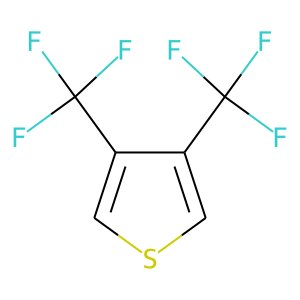

c1sc(c(c1C(F)(F)F)C(F)(F)F)

2


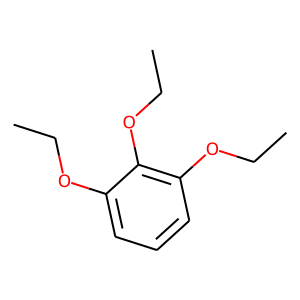

c1c(OCC)c(OCC)c(OCC)cc1

3


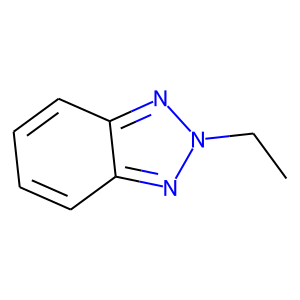

c1ccc(c2c1nn(CC)n2)

4


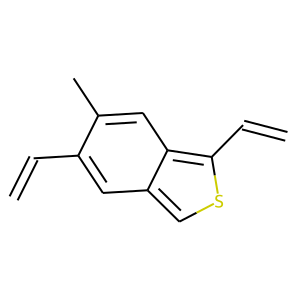

c1sc(c2c1cc(C=C)c(C)c2)C=C

5


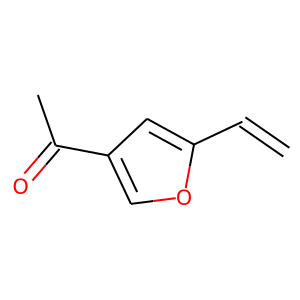

c1oc(cc1C(=O)C)C=C

6


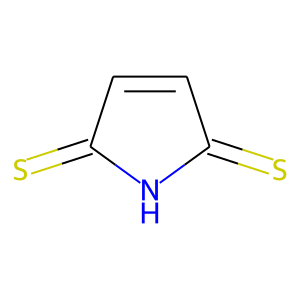

N1C(=S)C=C(C1=S)

7


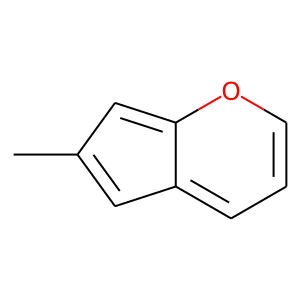

c1c(C)c(c2c1ccco2)

8


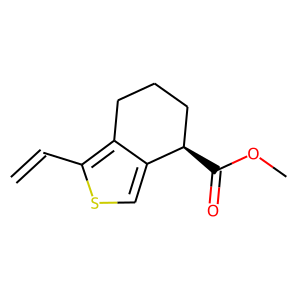

c1sc(c2c1[C@H](C(=O)OC)CCC2)C=C

9


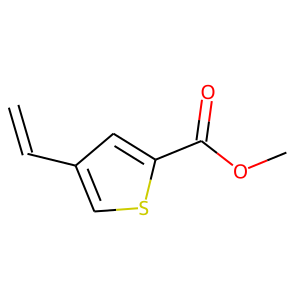

c1sc(C(=O)OC)cc1C=C

10


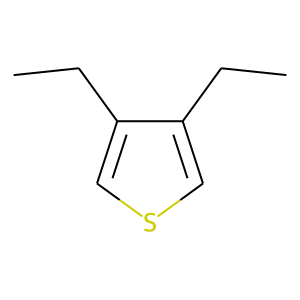

c1sc(c(c1CC)CC)

11


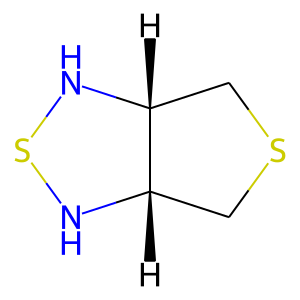

N1[C@H]2CSC[C@H]2N(S1)

12


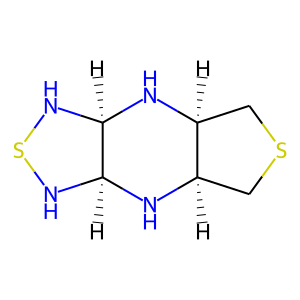

N1[C@H]2[C@H](N[C@@H]3[C@@H](CSC3)N2)N(S1)

13


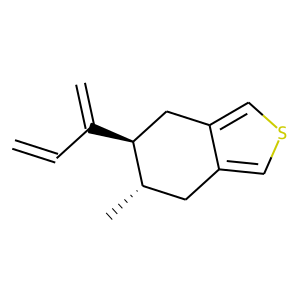

c1scc2c1C[C@H](C)[C@H](C2)C(=C)C=C

14


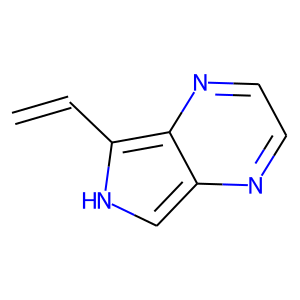

c1[nH]c(c2c1nccn2)C=C

15


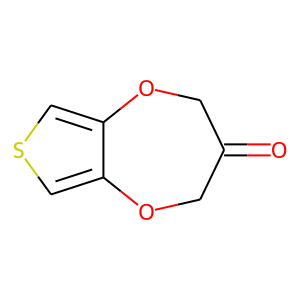

C1Oc2cscc2OC(C1=O)

16


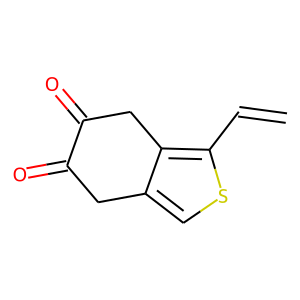

c1sc(c2c1CC(=O)C(=O)C2)C=C

17


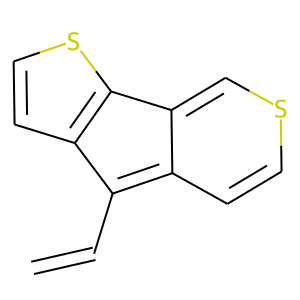

c1cc2c(cs1)c1c(ccs1)c2C=C

18


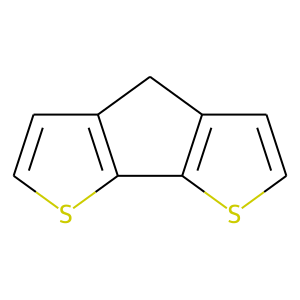

c1cc2c(s1)c1c(C2)cc(s1)

19


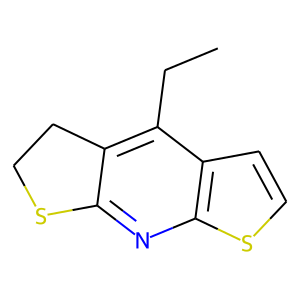

c1c(c2c(s1)nc1c(c2CC)CCS1)

20


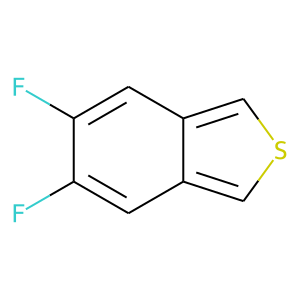

c1sc(c2c1cc(F)c(F)c2)

21


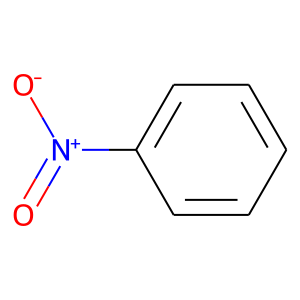

c1cc(N(=O)=O)c(cc1)

22


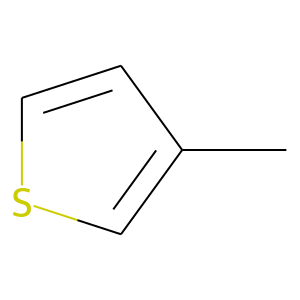

c1c(C)cc(s1)

23


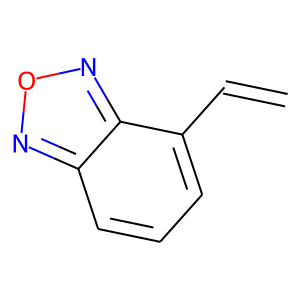

c1c2nonc2c(cc1)C=C

24


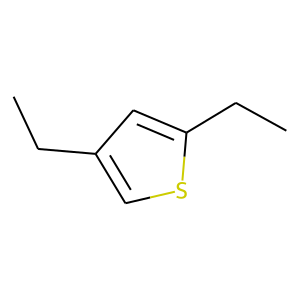

c1sc(CC)c(c1CC)

25


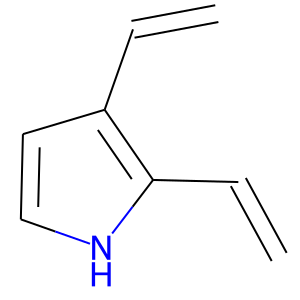

c1[nH]c(C=C)c(c1)C=C

26


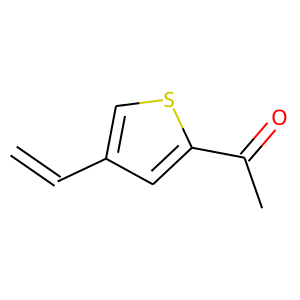

c1c(C(=O)C)scc1C=C

27


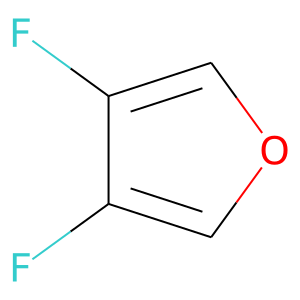

c1oc(c(c1F)F)

28


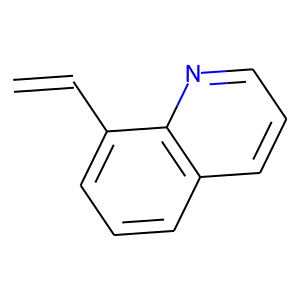

c1ccc(c2c1cccn2)C=C

29


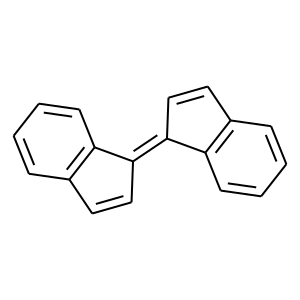

c1cc2c(C=C/C/2=C\2/C=Cc3c2cccc3)c(c1)

30


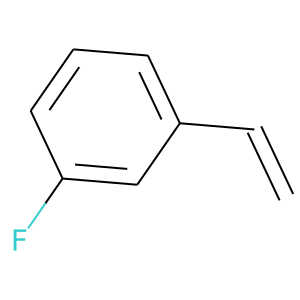

c1c(F)cccc1C=C

31


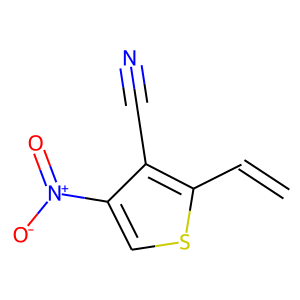

c1sc(c(c1N(=O)=O)C#N)C=C

32


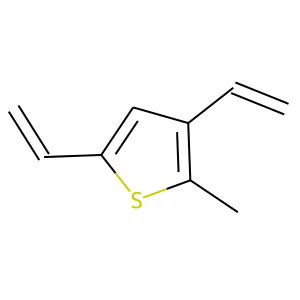

C(=C)c1sc(C)c(c1)C=C

33


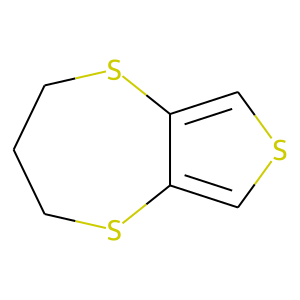

c1sc(c2c1SCCCS2)

34


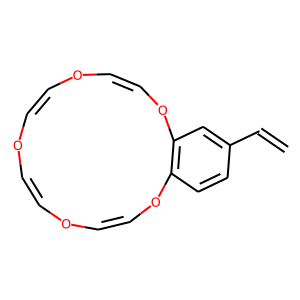

c1cc2occoccoccoccoc2cc1C=C

35


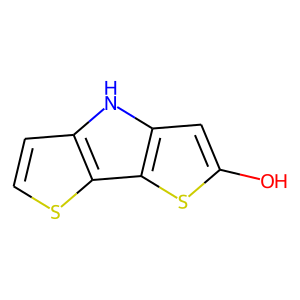

c1c(O)sc2c1[nH]c1c2sc(c1)

36


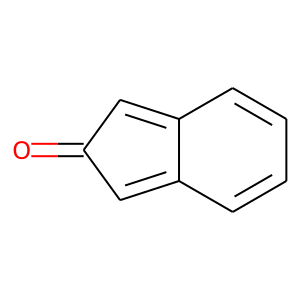

c1c2ccccc2c(c1=O)

37


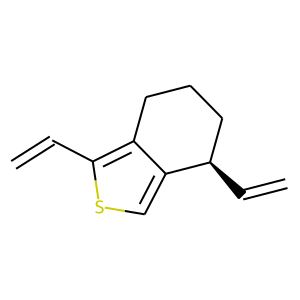

c1sc(c2c1[C@H](C=C)CCC2)C=C

38


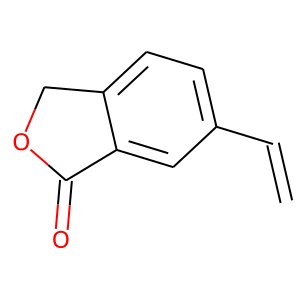

c1c2C(=O)OCc2ccc1C=C

39


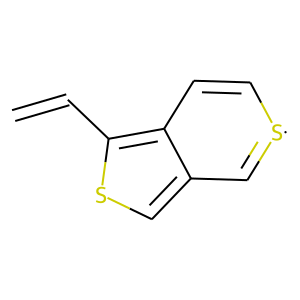

c1sc(c2c1C=[S]C=C2)C=C

40


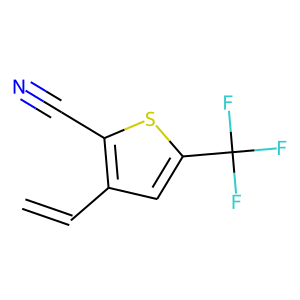

c1c(C(F)(F)F)sc(C#N)c1C=C

41


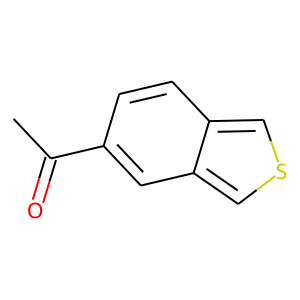

c1sc(c2c1cc(C(=O)C)cc2)

42


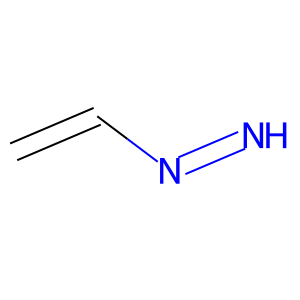

C(=C)N=N

43


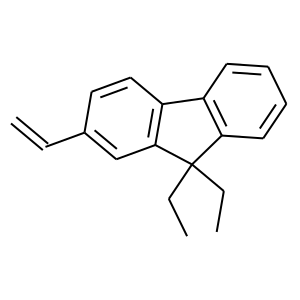

c1cc2c(cc1)c1c(C2(CC)CC)cc(cc1)C=C

44


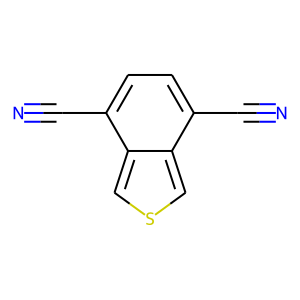

c1sc(c2c1c(C#N)ccc2C#N)

45


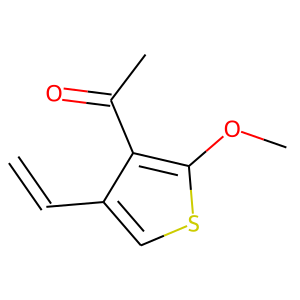

c1sc(OC)c(C(=O)C)c1C=C

46


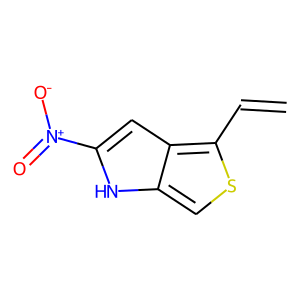

c1sc(c2c1[nH]c(N(=O)=O)c2)C=C

47


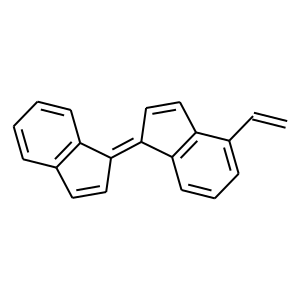

c1cc2c(C=C/C/2=C\2/C=Cc3c2cccc3)c(c1)C=C

48


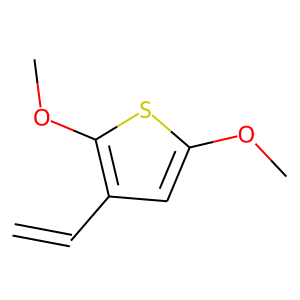

c1c(OC)sc(OC)c1C=C

49


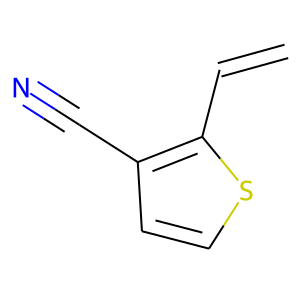

c1sc(c(c1)C#N)C=C

50


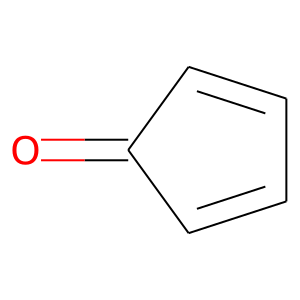

c1ccc(=O)c1

51


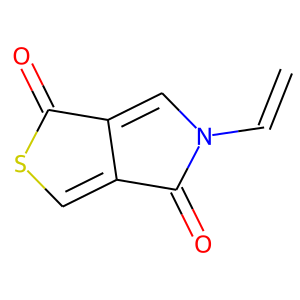

C1=C2C(C(=O)S1)=CN(C2=O)C=C

52


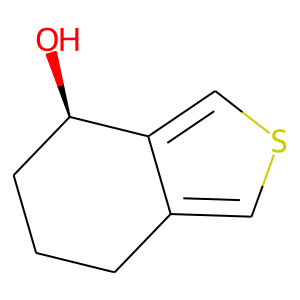

c1sc(c2c1CCC[C@H]2O)

53


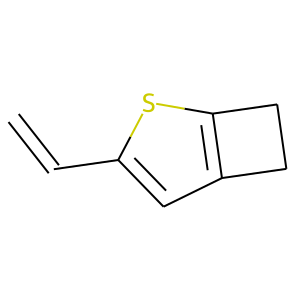

c1c2CCc2sc1C=C

54


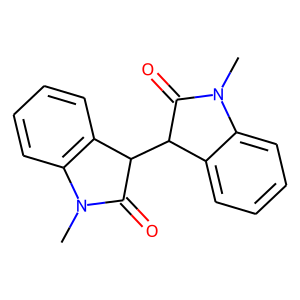

c1cccc2c1N(C)C(=O)C2C1C(=O)N(C)c2cc(ccc12)

55


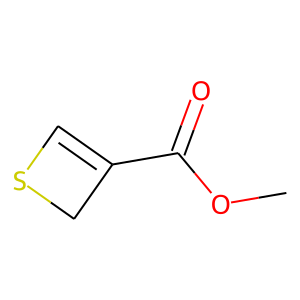

C1SC=C1C(=O)OC

56


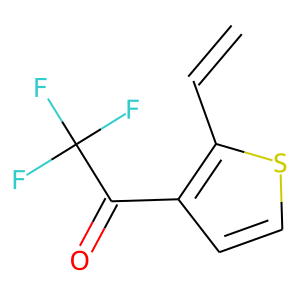

c1sc(c(c1)C(=O)C(F)(F)F)C=C

57


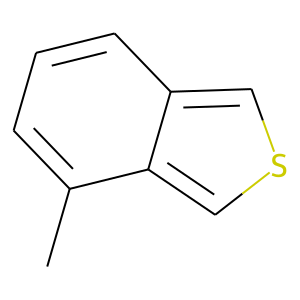

c1sc(c2c1c(C)ccc2)

58


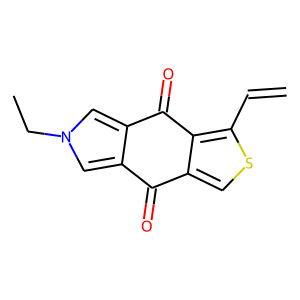

c(s1)c2c(=O)c3cn(CC)cc3c(=O)c2c1C=C

59


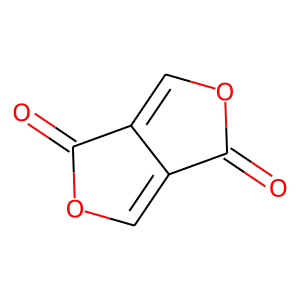

C1=C2C(C(=O)O1)=C(OC2=O)

60


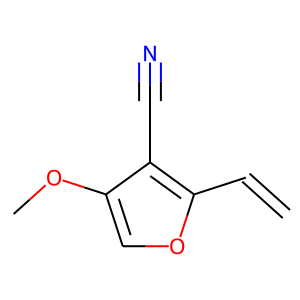

c1oc(c(c1OC)C#N)C=C

61


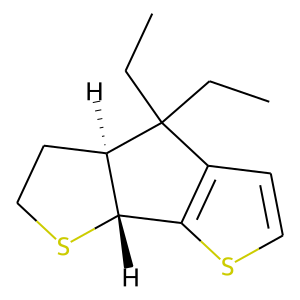

c1c(c2c(s1)[C@H]1[C@H](C2(CC)CC)CCS1)

62


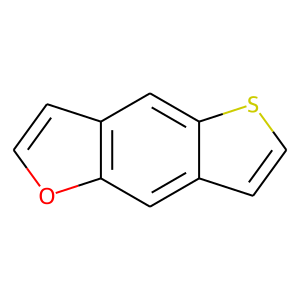

c1sc2c(c3ccoc3cc2c1)

63


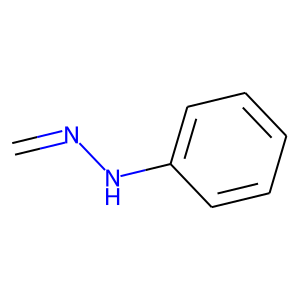

C=NNc1ccc(cc1)

64


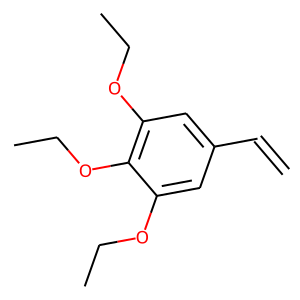

c1c(OCC)c(OCC)c(OCC)cc1C=C

65


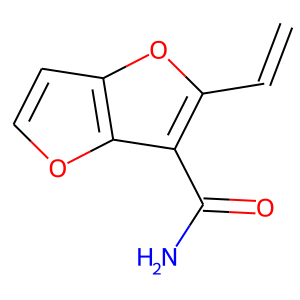

c1oc2c(C(=O)N)c(oc2c1)C=C

66


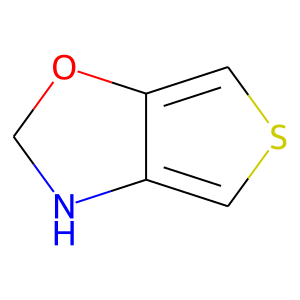

c(s1)c2NCOc2c1

67


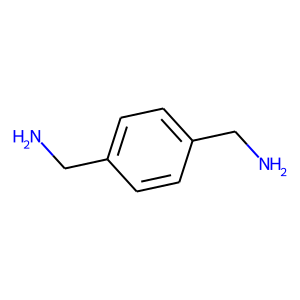

c1cc(CN)ccc1CN

68


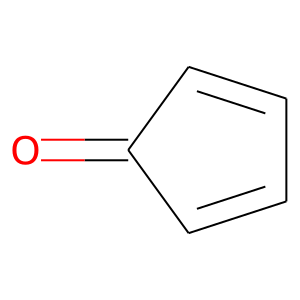

C1=CC=C(C1=O)

69


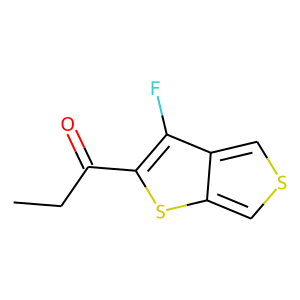

c1sc(c2c1sc(C(=O)CC)c2F)

70


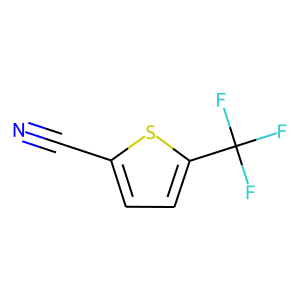

c1c(C(F)(F)F)sc(C#N)c1

71


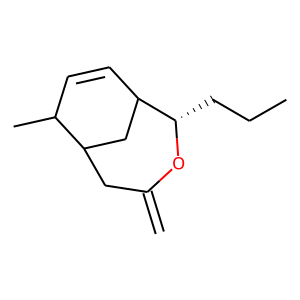

C1C2CC(=C)O[C@H](C1C=CC2C)CCC

72


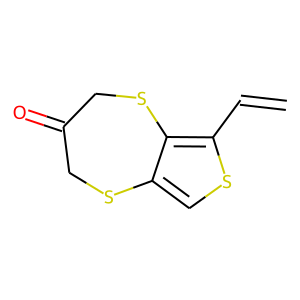

c1sc(c2c1SCC(=O)CS2)C=C

73


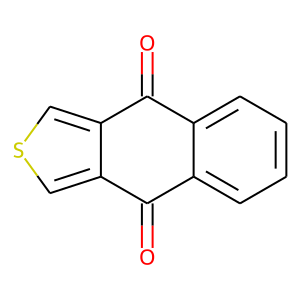

c1sc(c2c1C(=O)c1ccccc1C2=O)

74


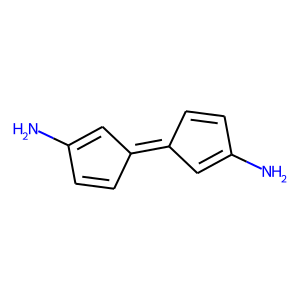

C1=C(C=C/C/1=C\1/C=CC(=C1)N)N

75


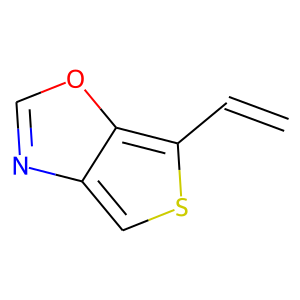

c1sc(c2c1nco2)C=C

76


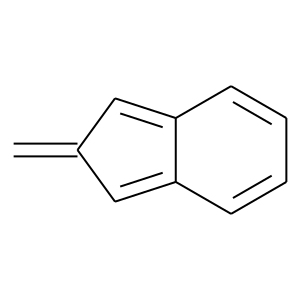

C1=c2ccccc2=C(C1=C)

77


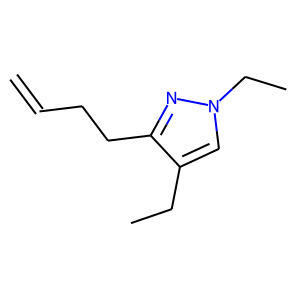

c1n(CC)nc(c1CC)CCC=C

78


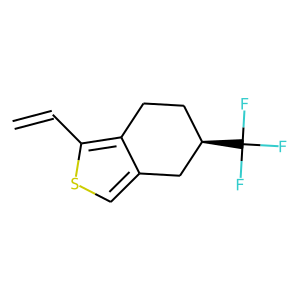

c1sc(c2c1C[C@H](C(F)(F)F)CC2)C=C

79


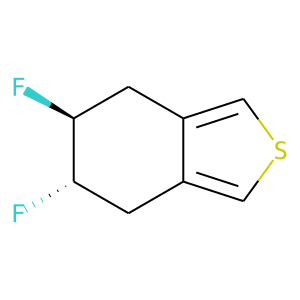

c1sc(c2c1C[C@H](F)[C@@H](F)C2)

80


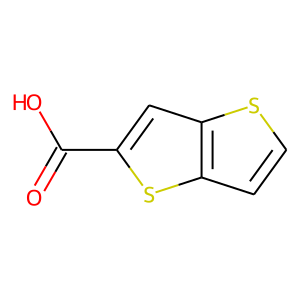

c1sc2cc(C(=O)O)sc2c1

81


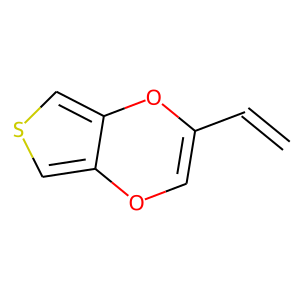

C1=C(Oc2c(csc2)O1)C=C

82


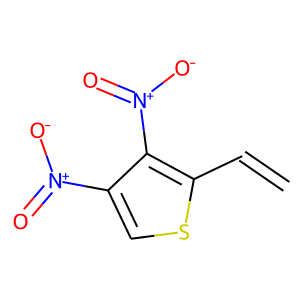

c1sc(c(c1N(=O)=O)N(=O)=O)C=C

83


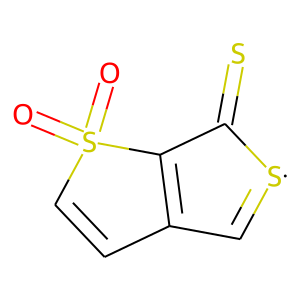

C1=[S]C(=S)C2=C1C=C(S2(=O)=O)

84


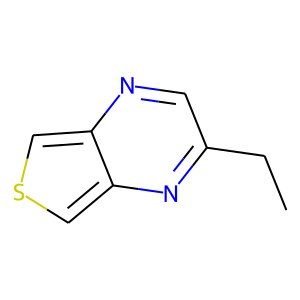

c1c2c(ncc(CC)n2)c(s1)

85


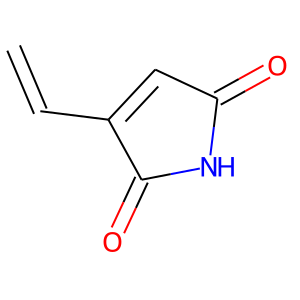

N1C(=O)C=C(C1=O)C=C

86


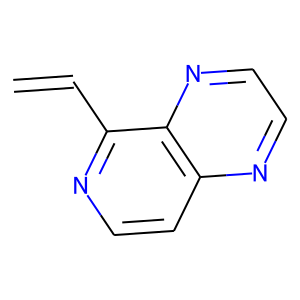

c1cnc(c2c1nccn2)C=C

87


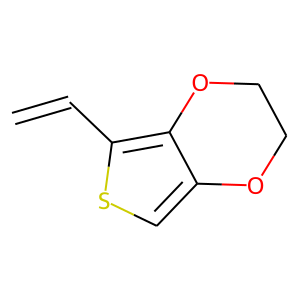

c1sc(c2c1OCCO2)C=C

88


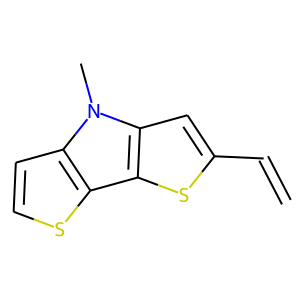

c1sc2c(c1)n(C)c1c2sc(c1)C=C

89


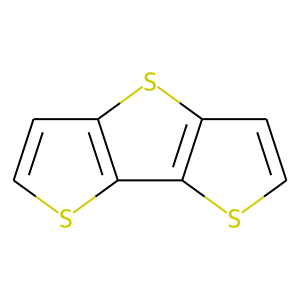

c1sc2c(c1)sc1cc(sc21)

90


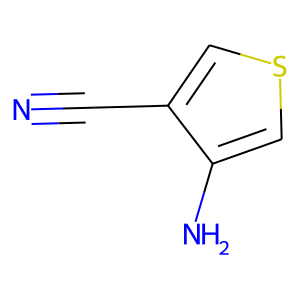

c1scc(C#N)c1N

91


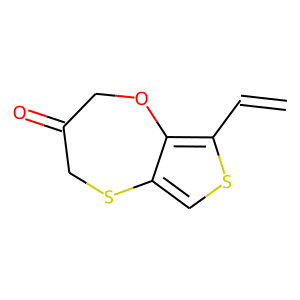

c1sc(c2c1SCC(=O)CO2)C=C

92


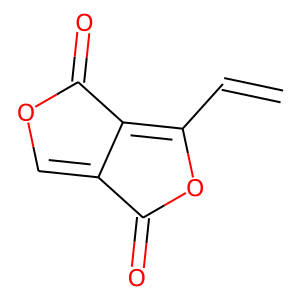

C1=C2C(C(=O)O1)=C(OC2=O)C=C

93


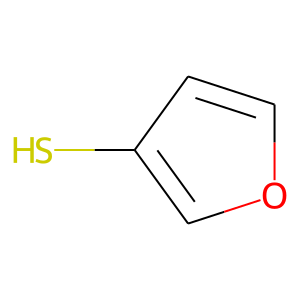

c1occc1S

94


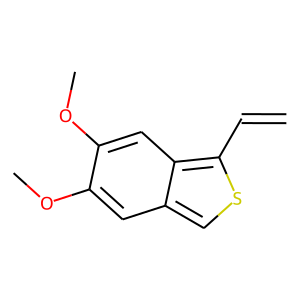

c(s1)c2cc(OC)c(OC)cc2c1C=C

95


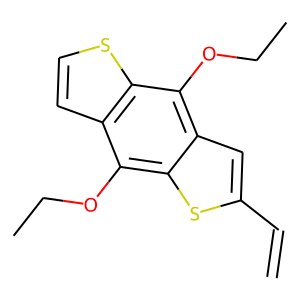

c1c2c(OCC)c3c(ccs3)c(OCC)c2sc1C=C

96


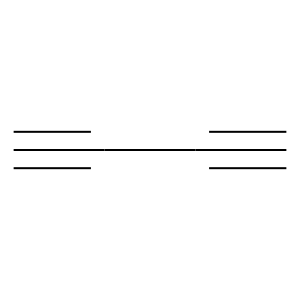

C#CC#C

97


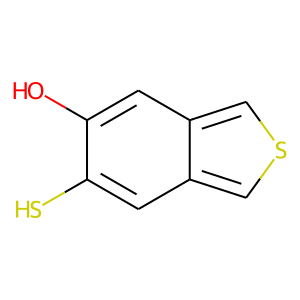

c1sc(c2c1cc(S)c(O)c2)

98


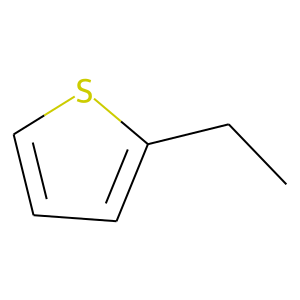

c1c(CC)sc(c1)

99


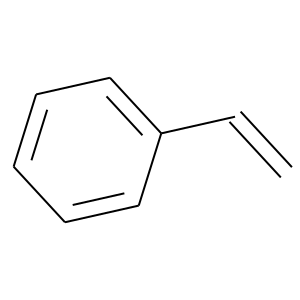

c1ccc(cc1)C=C

100


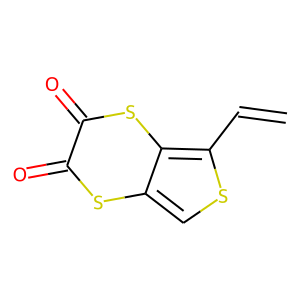

c1sc(c2c1sc(=O)c(=O)s2)C=C

101


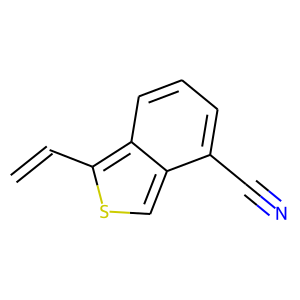

c1sc(c2c1c(C#N)ccc2)C=C

102


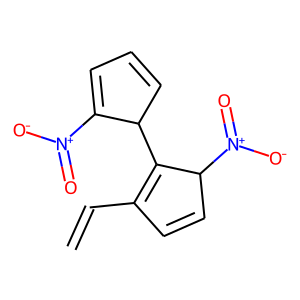

C1=CC(N(=O)=O)C(C2C=CC=C2N(=O)=O)=C1C=C

103


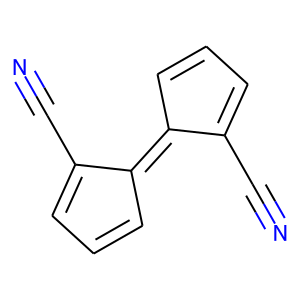

C1=C/C(/C(=C1)C#N)=C\1/C=C(C=C1C#N)

104


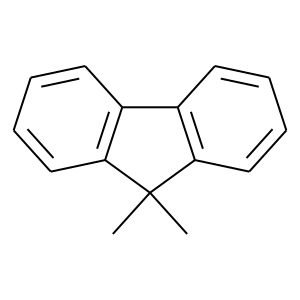

c1cc2c(cc1)c1c(C2(C)C)cc(cc1)

105


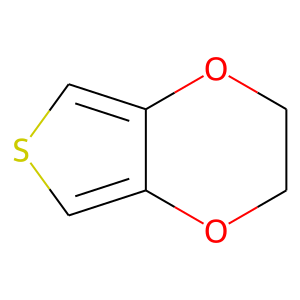

c1sc(c2c1OCCO2)

106


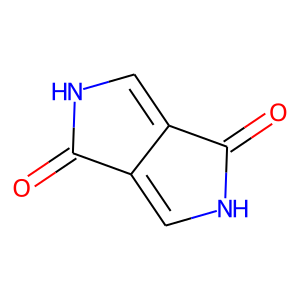

c1[nH]c(=O)c2c1c(=O)[nH]c2

107


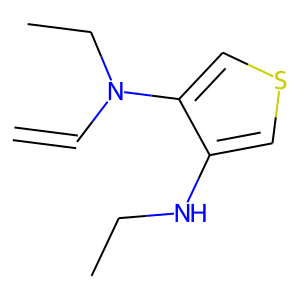

N(CC)c1cscc1N(CC)C=C

108


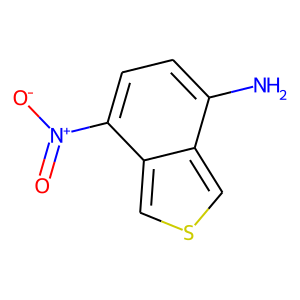

c1sc(c2c1c(N(=O)=O)ccc2N)

109


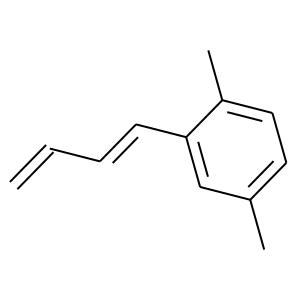

c1c(C)cc(c(c1)C)C=CC=C

110


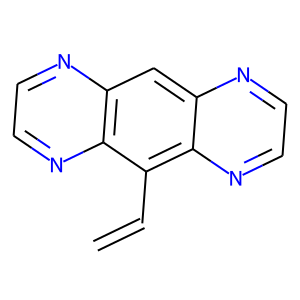

c1c2c(nccn2)c(c2c1nccn2)C=C

111


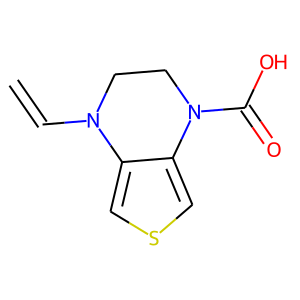

c1scc2c1N(CCN2C(=O)O)C=C

112


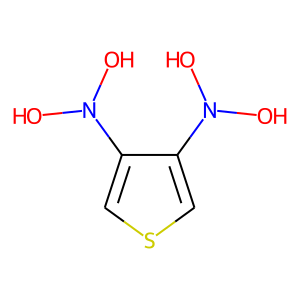

c1scc(N(O)O)c1N(O)O

113


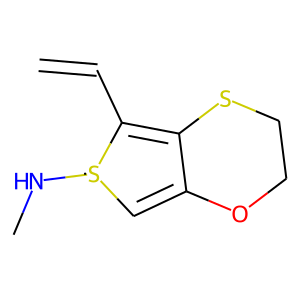

C1=C2OCCSC2=C([S@@]1NC)C=C

114


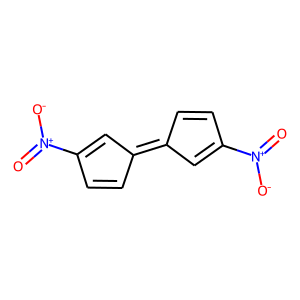

C1=C(N(=O)=O)C=C/C/1=C\1/C=CC(N(=O)=O)=C1

115


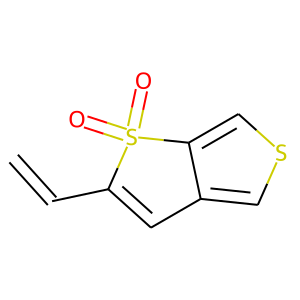

c1scc2c1C=C(S2(=O)=O)C=C

116


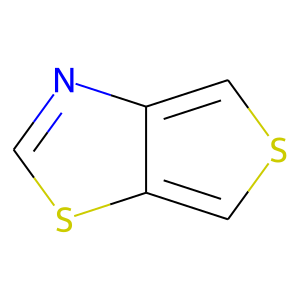

c(s1)c2scnc2c1

117


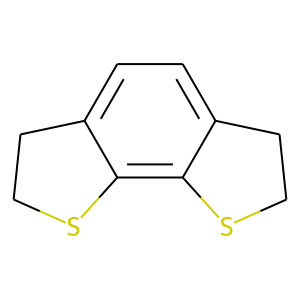

c1c2c(SCC2)c2c(CCS2)c1

118


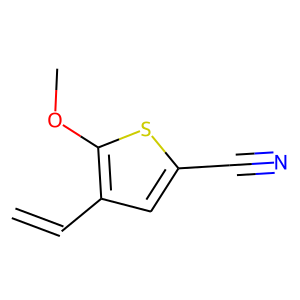

c1c(C#N)sc(OC)c1C=C

119


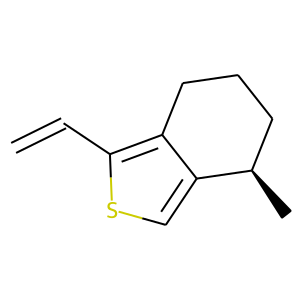

c1sc(c2c1[C@H](C)CCC2)C=C

120


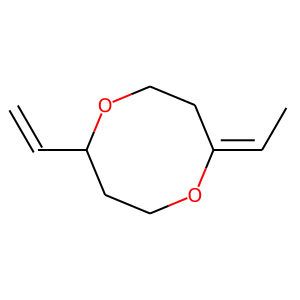

C/C=C\1/OCCC(OCC1)C=C

121


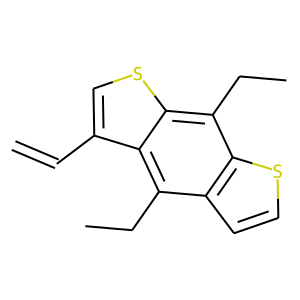

c1csc2c1c(CC)c1c(c2CC)scc1C=C

122


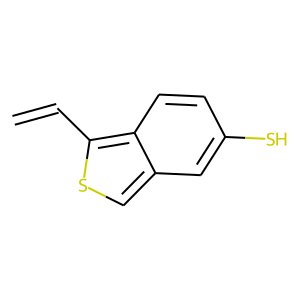

c1sc(c2c1cc(S)cc2)C=C

123


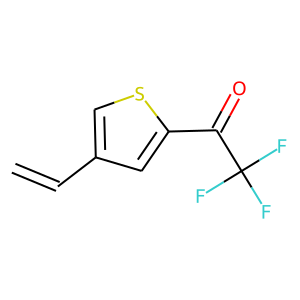

c1c(C(=O)C(F)(F)F)scc1C=C

124


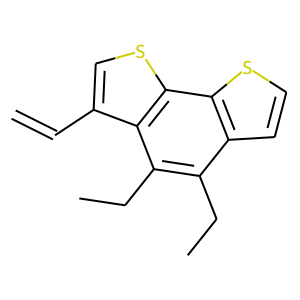

c1csc2c1c(CC)c(CC)c1c(csc21)C=C

125


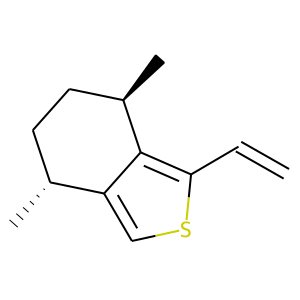

c1sc(c2c1[C@H](C)CC[C@H]2C)C=C

126


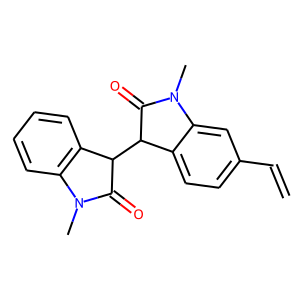

c1cccc2c1N(C)C(=O)C2C1C(=O)N(C)c2cc(ccc12)C=C

127


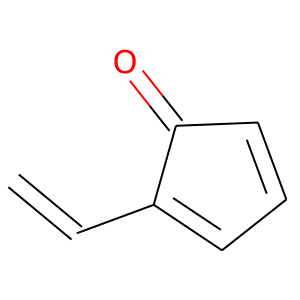

c1ccc(=O)c1C=C

128


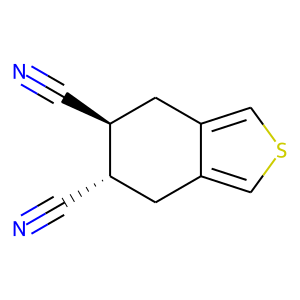

c1sc(c2c1C[C@H](C#N)[C@@H](C#N)C2)

129


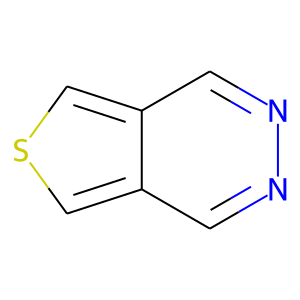

c1c2cscc2c(nn1)

130


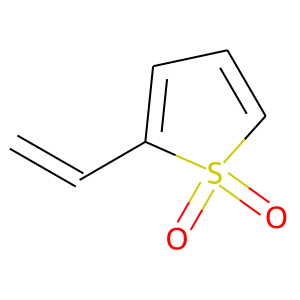

C1=CC=C(S1(=O)=O)C=C

131


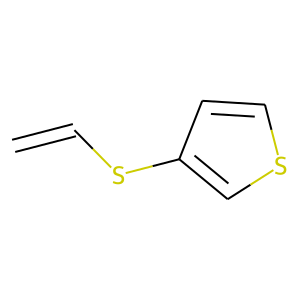

c1sccc1SC=C

132


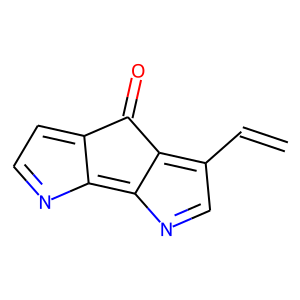

c1nc2c(c(=O)c3c2ncc3)c1C=C

133


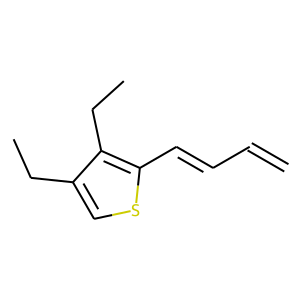

c1sc(c(c1CC)CC)C=CC=C

134


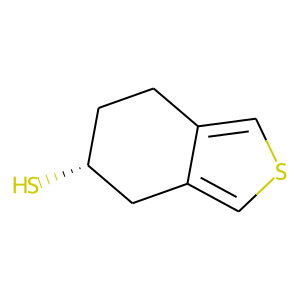

c1sc(c2c1C[C@H](S)CC2)

135


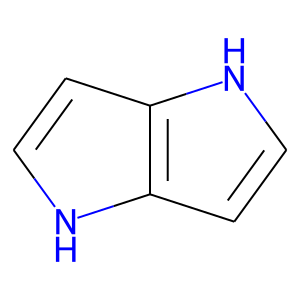

c1[nH]c2cc([nH]c2c1)

136


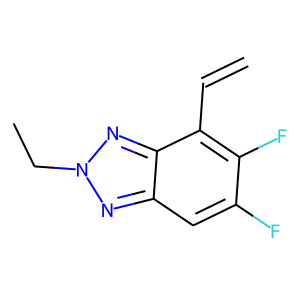

c1c(F)c(F)c(c2c1nn(CC)n2)C=C

137


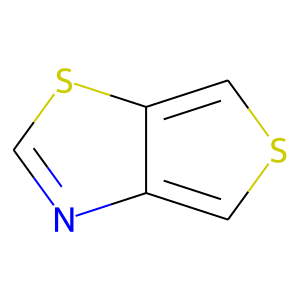

c1sc(c2c1ncs2)

138


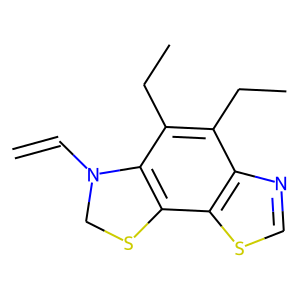

c1nc2c(s1)c1c(c(c2CC)CC)N(CS1)C=C

139


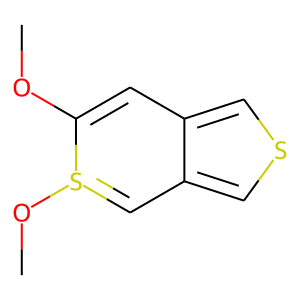

c1scc2c1C(=[S@@](OC)C(=C2)OC)

140


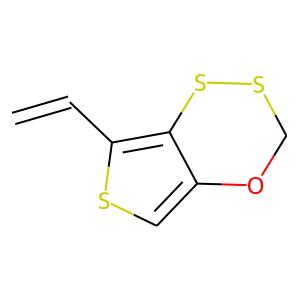

c1sc(c2c1OCSS2)C=C

141


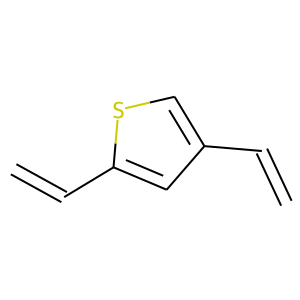

C=Cc1csc(c1)C=C

142


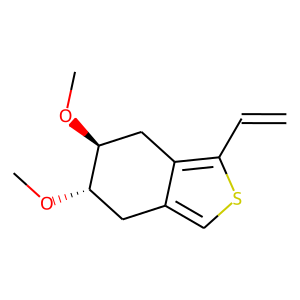

c1sc(c2c1C[C@H](OC)[C@@H](OC)C2)C=C

143


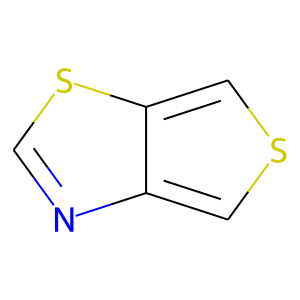

c(s1)c2ncsc2c1

144


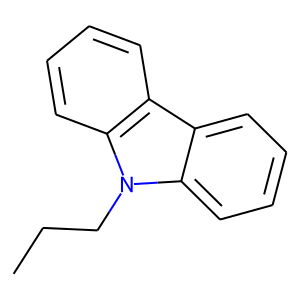

c1c2n(CCC)c3c(c2ccc1)cccc3

145


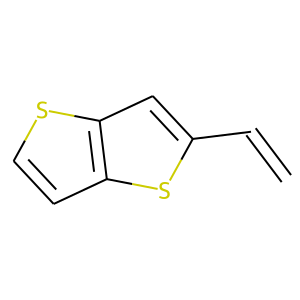

c1cc2c(s1)cc(s2)C=C

146


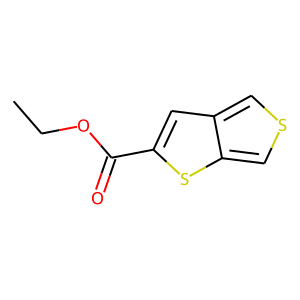

c1sc(c2c1sc(C(=O)OCC)c2)

147


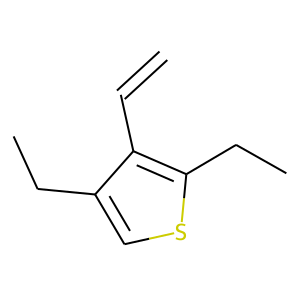

c1sc(CC)c(c1CC)C=C

148


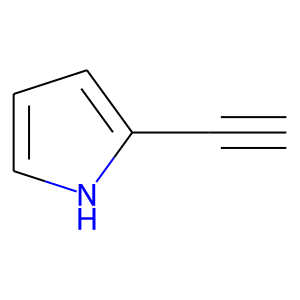

c1[nH]c(cc1)C#C

149


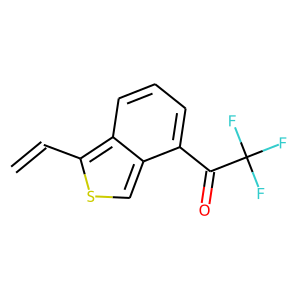

c1sc(c2c1c(C(=O)C(F)(F)F)ccc2)C=C

150


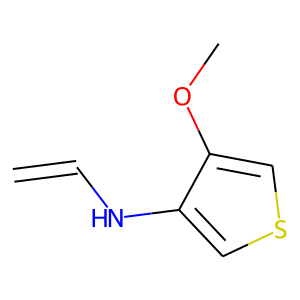

c1scc(OC)c1NC=C

151


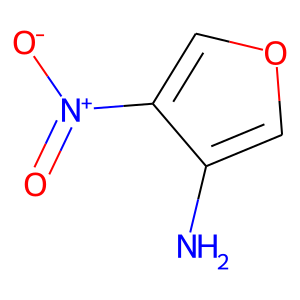

c1occ(N(=O)=O)c1N

152


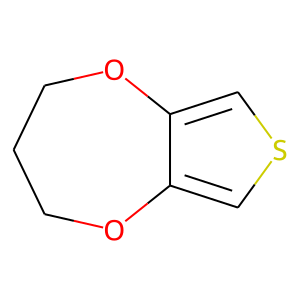

c1sc(c2c1OCCCO2)

153


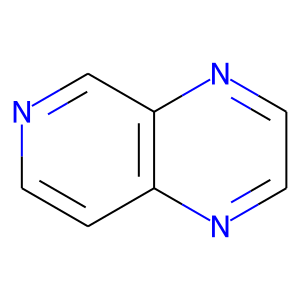

c1cnc(c2c1nccn2)

154


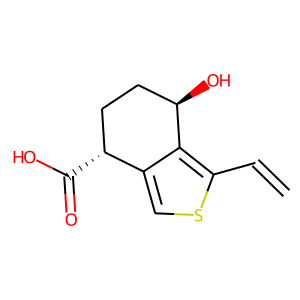

c1sc(c2c1[C@H](C(=O)O)CC[C@H]2O)C=C

155


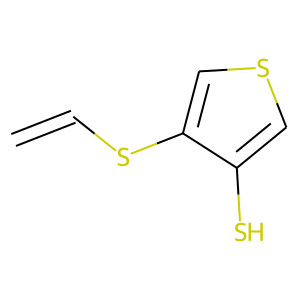

Sc1cscc1SC=C

156


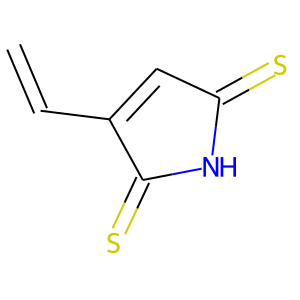

N1C(=S)C=C(C1=S)C=C

157


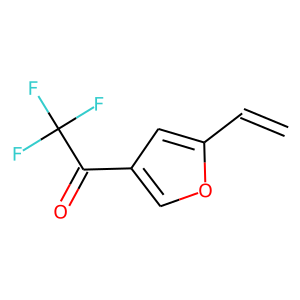

c1oc(cc1C(=O)C(F)(F)F)C=C

158


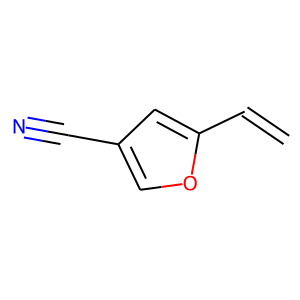

c1oc(cc1C#N)C=C

159


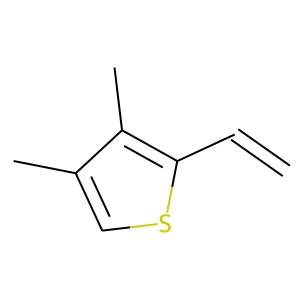

c1sc(c(c1C)C)C=C

160


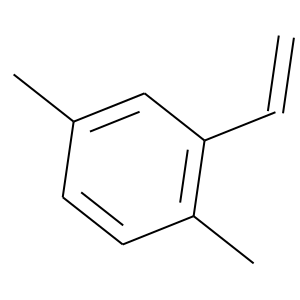

c1cc(C)cc(c1C)C=C

161


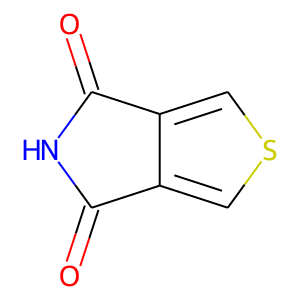

c1sc(c2c1C(=O)NC2=O)

162


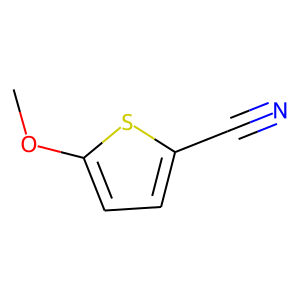

c1c(C#N)sc(OC)c1

163


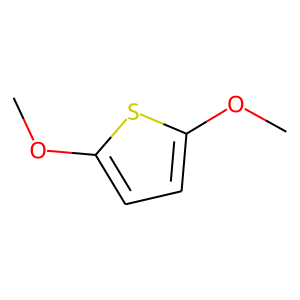

c1c(OC)sc(OC)c1

164


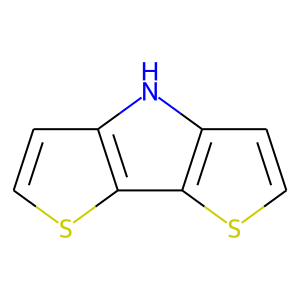

c1cc2c(s1)c1c([nH]2)cc(s1)

165


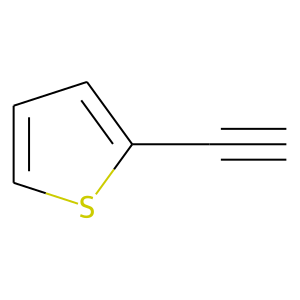

c1sc(cc1)C#C

166


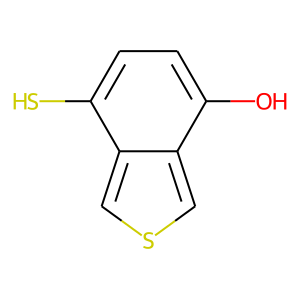

c1sc(c2c1c(S)ccc2O)

167


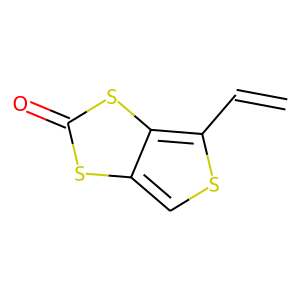

c1sc(c2c1sc(=O)s2)C=C

168


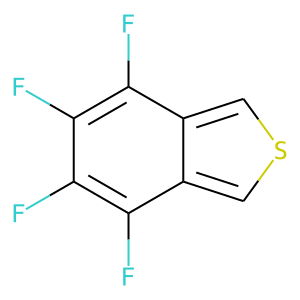

c1sc(c2c1c(F)c(F)c(F)c2F)

169


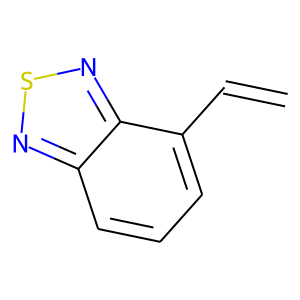

c1c2nsnc2c(cc1)C=C

170


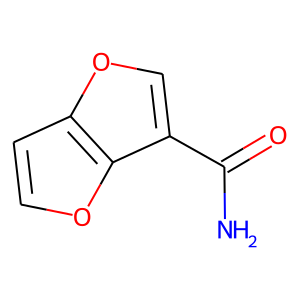

c1oc2c(C(=O)N)c(oc2c1)

171


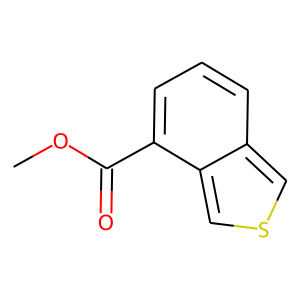

c1sc(c2c1c(C(=O)OC)ccc2)

172


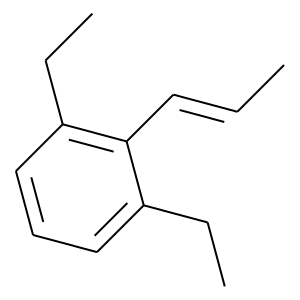

c1cc(CC)c(c(c1)CC)/C=C(/C)

173


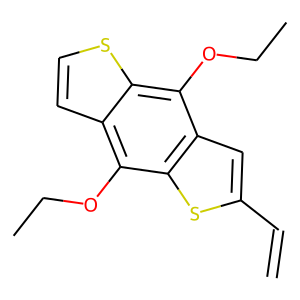

c1c2c(OCC)c3c(c(c2sc1)OCC)cc(s3)C=C

174


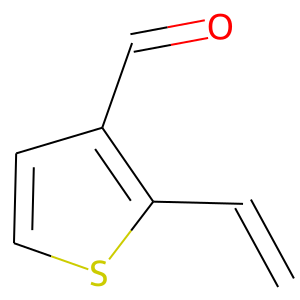

c1sc(c(c1)C=O)C=C

175


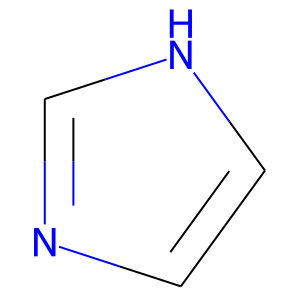

c1[nH]cnc1

176


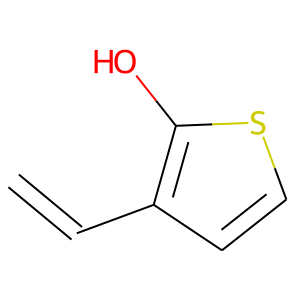

c1sc(O)c(c1)C=C

177


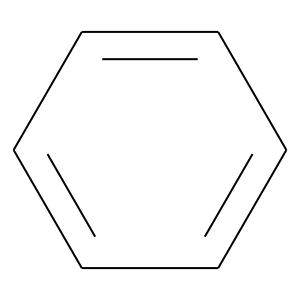

c1ccc(cc1)

178


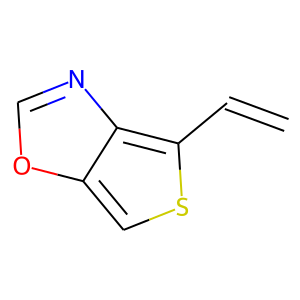

c1sc(c2c1ocn2)C=C

179


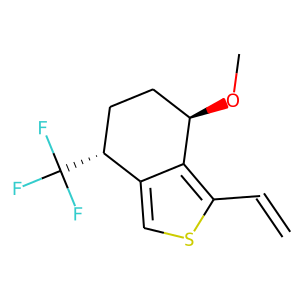

c1sc(c2c1[C@H](C(F)(F)F)CC[C@H]2OC)C=C

180


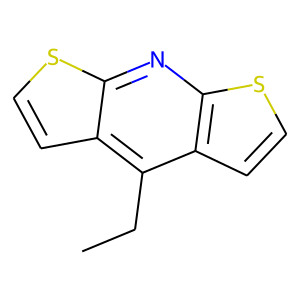

c1csc2c1c(CC)c1c(n2)scc1

181


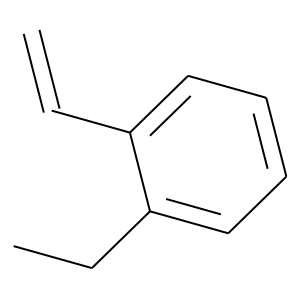

c1c(CC)c(ccc1)C=C

182


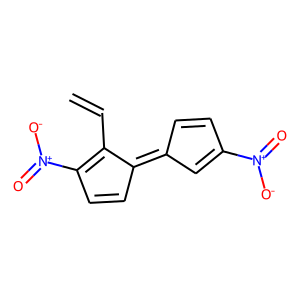

C1=C(N(=O)=O)C=C/C/1=C\1/C=CC(N(=O)=O)=C1C=C

183


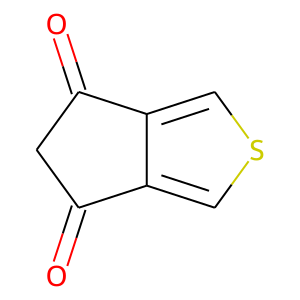

c1sc(c2c1C(=O)CC2=O)

184


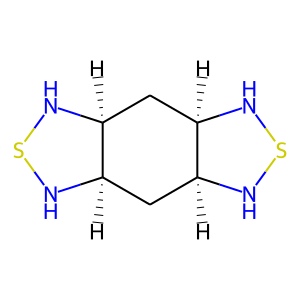

N1[C@@H]2C[C@@H]3NSN[C@@H]3C[C@@H]2N(S1)

185


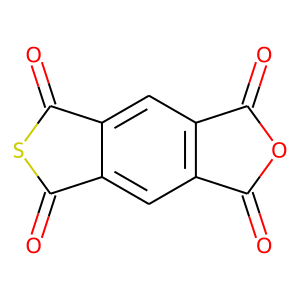

c1c2c(=O)sc(=O)c2c(c2c1c(=O)oc2=O)

186


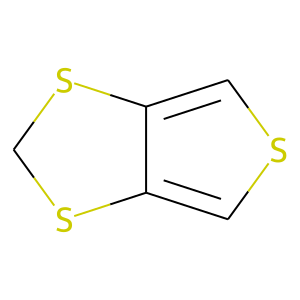

c1sc(c2c1SCS2)

187


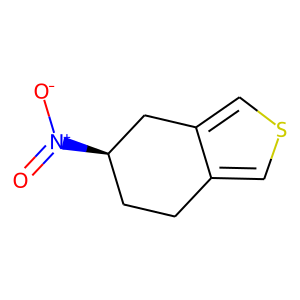

c1sc(c2c1CC[C@@H](N(=O)=O)C2)

188


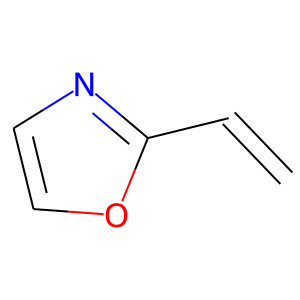

c1oc(nc1)C=C

189


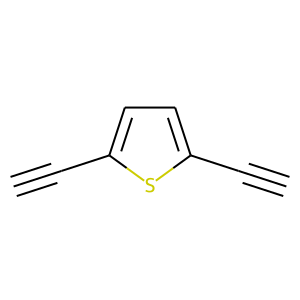

C#Cc1sc(cc1)C#C

190


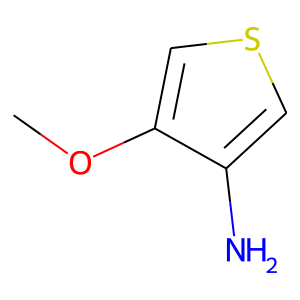

c1scc(OC)c1N

191


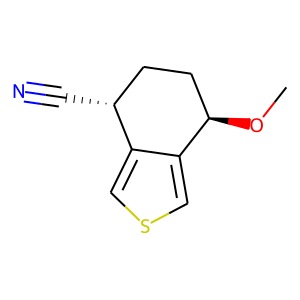

c1sc(c2c1[C@H](C#N)CC[C@H]2OC)

192


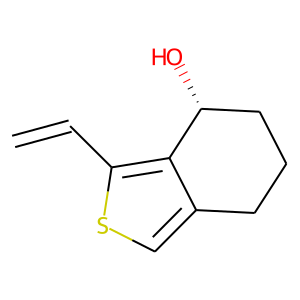

c1sc(c2c1CCC[C@H]2O)C=C

193


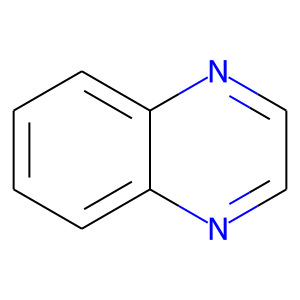

c1c(cc2c(c1)nccn2)

194


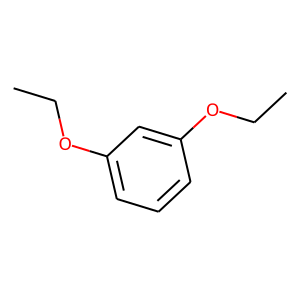

c1c(OCC)cc(OCC)c(c1)

195


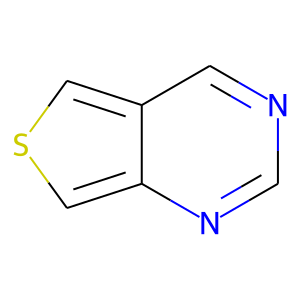

c1sc(c2c1ncnc2)

196


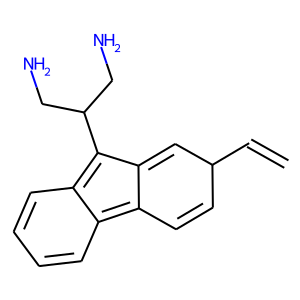

c1cc2c(C(CN)CN)c3cC(ccc3c2cc1)C=C

197


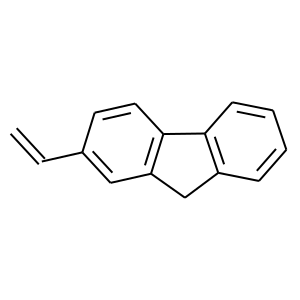

c1cc2c(cc1)c1c(C2)cc(cc1)C=C

198


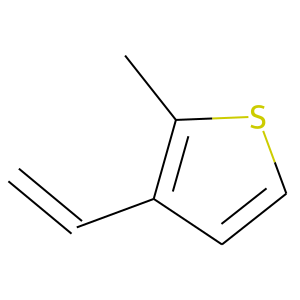

c1sc(C)c(c1)C=C

199


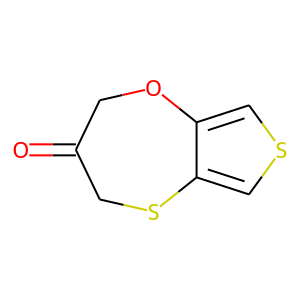

c1sc(c2c1SCC(=O)CO2)

200


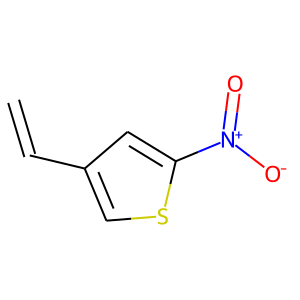

c1sc(N(=O)=O)cc1C=C

201


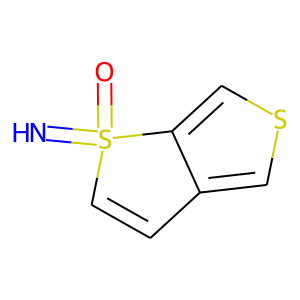

c(s1)c2ccs(=N)(=O)c2c1

202


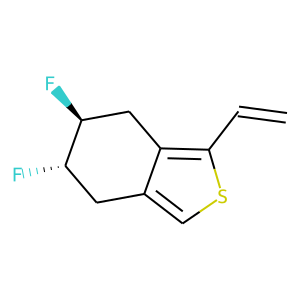

c1sc(c2c1C[C@H](F)[C@@H](F)C2)C=C

203


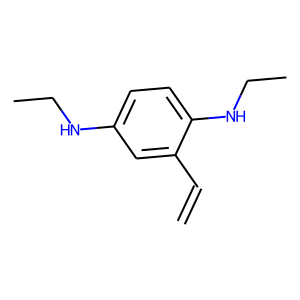

N(CC)c1ccc(c(c1)C=C)N(CC)

204


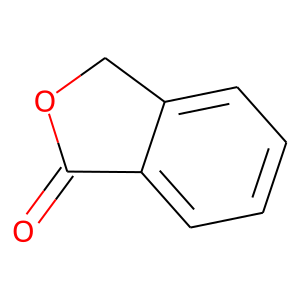

c1c2C(=O)OCc2ccc1

205


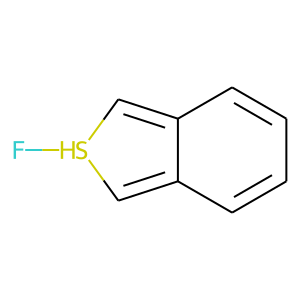

c1c2cS(F)cc2ccc1

206


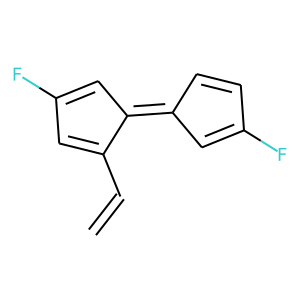

C1=C(F)C=C/C/1=C\1/C(=CC(=C1)F)C=C

207


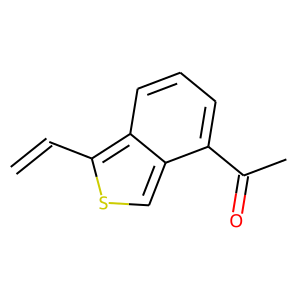

c1sc(c2c1c(C(=O)C)ccc2)C=C

208


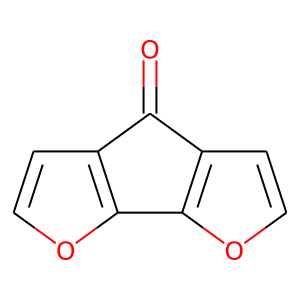

c1oc2c(c1)C(=O)c1c2oc(c1)

209


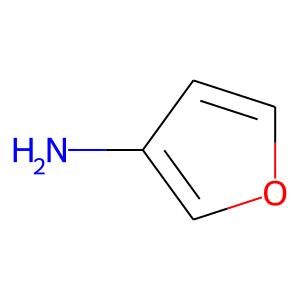

c1occc1N

210


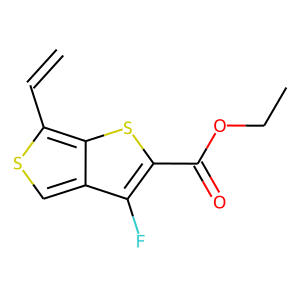

c1c2c(sc(C(=O)OCC)c2F)c(s1)C=C

211


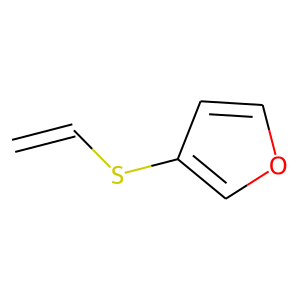

c1occc1SC=C

212


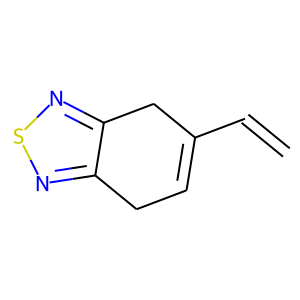

C1=C(Cc2c(C1)nsn2)C=C

213


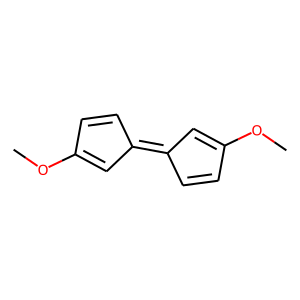

C1=CC(OC)=C(/C/1=C\1/C=C(OC)C=C1)

214


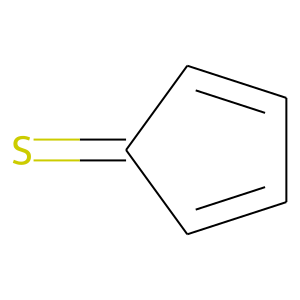

C1=CC=C(C1=S)

215


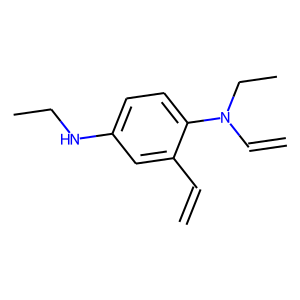

N(CC)c1ccc(c(c1)C=C)N(CC)C=C

216


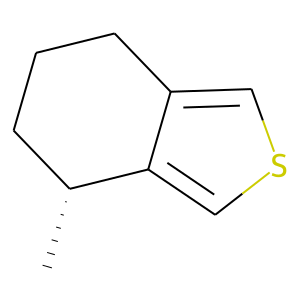

c1sc(c2c1[C@H](C)CCC2)

217


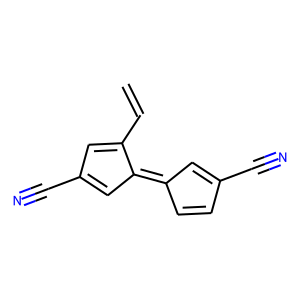

C1=CC(C#N)=C/C/1=C/1\C(=CC(=C1)C#N)C=C

218


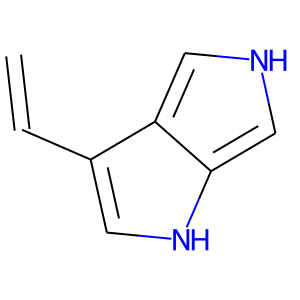

c1[nH]cc2c1[nH]cc2C=C

219


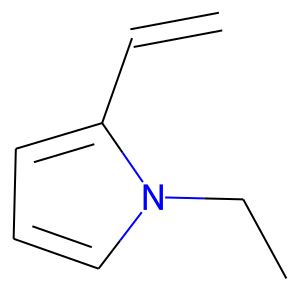

c1n(CC)c(cc1)C=C

220


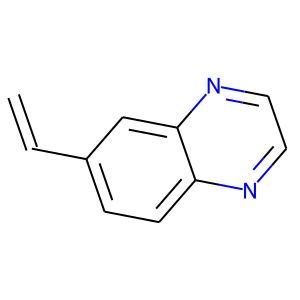

c1c(cc2c(c1)nccn2)C=C

221


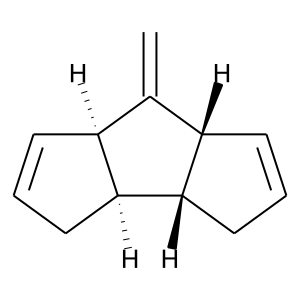

C1=C[C@@H]2[C@H](C1)[C@@H]1[C@@H](C=CC1)C2=C

222


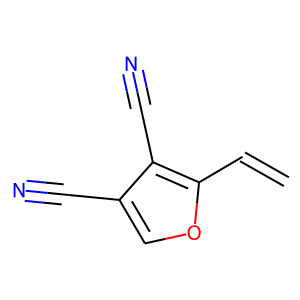

c1oc(c(c1C#N)C#N)C=C

223


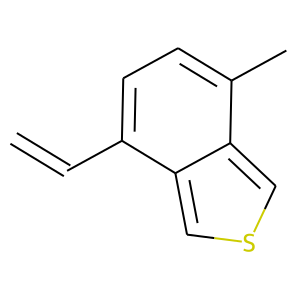

c1sc(c2c1c(C=C)ccc2C)

224


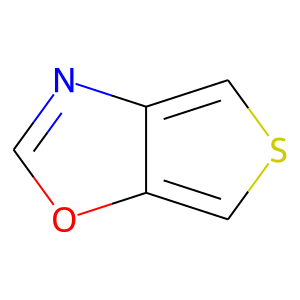

c1sc(c2c1ocn2)

225


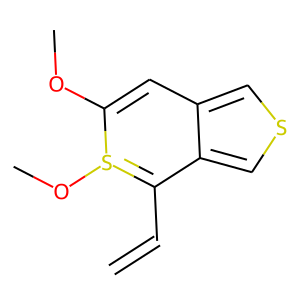

c1scc2c1C(=[S@@](OC)C(=C2)OC)C=C

226


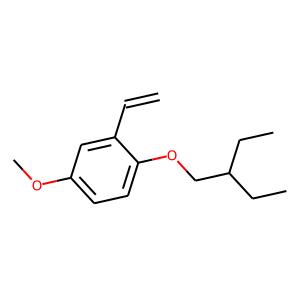

c1c(OC)cc(c(c1)OCC(CC)CC)C=C

227


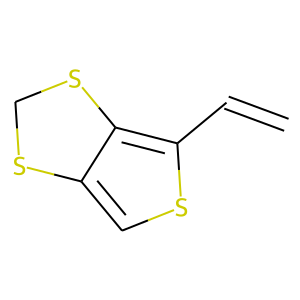

c1sc(c2c1SCS2)C=C

228


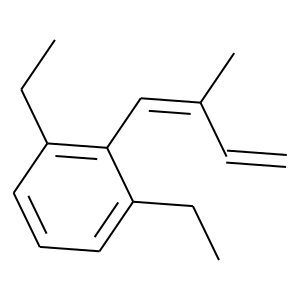

c1cc(CC)c(c(c1)CC)/C=C(/C)C=C

229


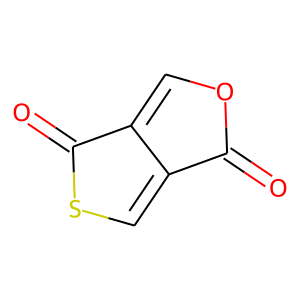

C1=C2C(C(=O)S1)=C(OC2=O)

230


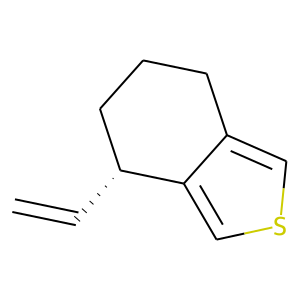

c1sc(c2c1[C@H](C=C)CCC2)

231


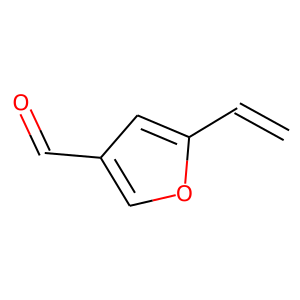

c1oc(cc1C=O)C=C

232


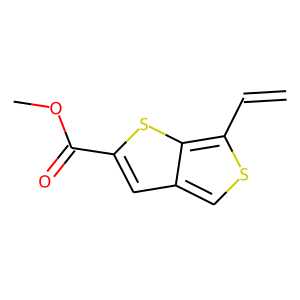

c1sc(c2c1cc(C(=O)OC)s2)C=C

233


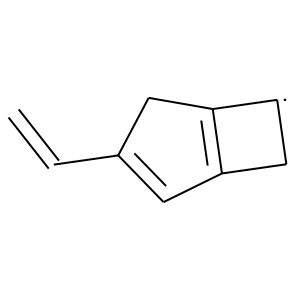

C1=C(CC2=C1C[CH]2)C=C

234


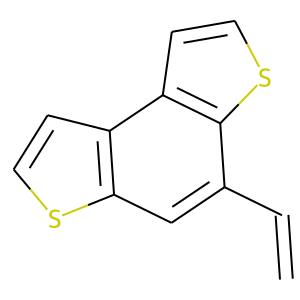

c1sc2c(c1)c1c(scc1)c(c2)C=C

235


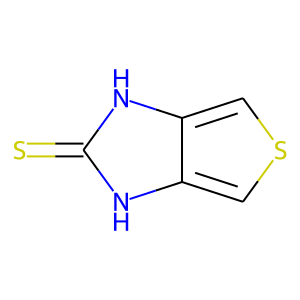

c1sc(c2c1[nH]c(=S)[nH]2)

236


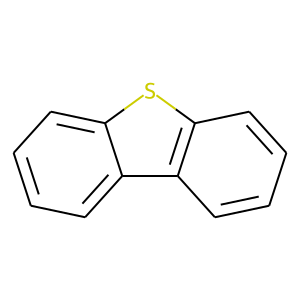

c1cc(c2c(c1)c1c(s2)cccc1)

237


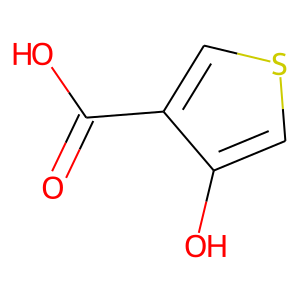

c1sc(c(c1O)C(=O)O)

238


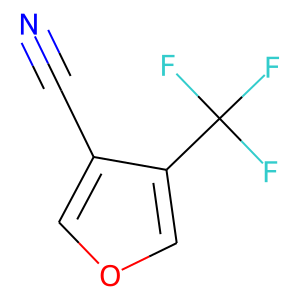

c1oc(c(c1C#N)C(F)(F)F)

239


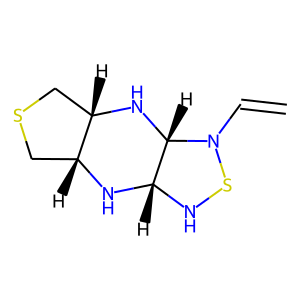

N1[C@H]2[C@H](N[C@@H]3[C@@H](CSC3)N2)N(S1)C=C

240


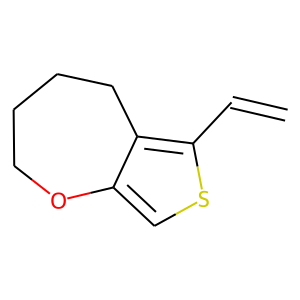

c1sc(c2c1OCCCC2)C=C

241


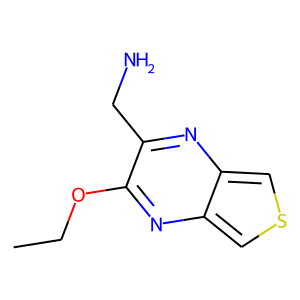

c1sc(c2c1nc(OCC)c(CN)n2)

242


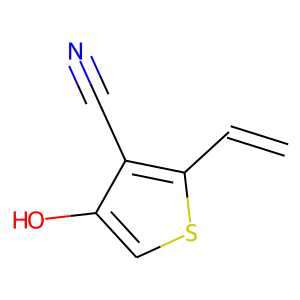

c1sc(c(c1O)C#N)C=C

243


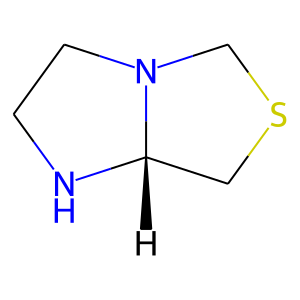

C1SCN2[C@H]1NCC2

244


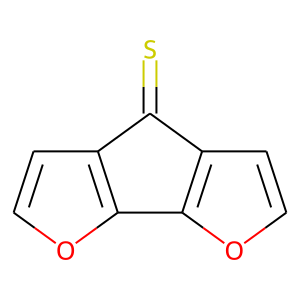

c1oc2c(c1)C(=S)c1c2oc(c1)

245


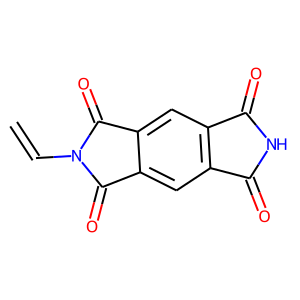

c1c2c(=O)n(c(=O)c2cc2c1c(=O)[nH]c2=O)C=C

246


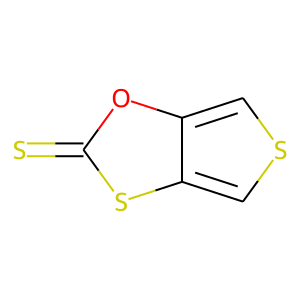

c1sc(c2c1sc(=S)o2)

247


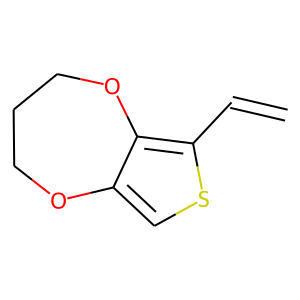

c1sc(c2c1OCCCO2)C=C

248


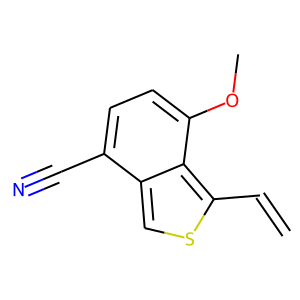

c1sc(c2c1c(C#N)ccc2OC)C=C

249


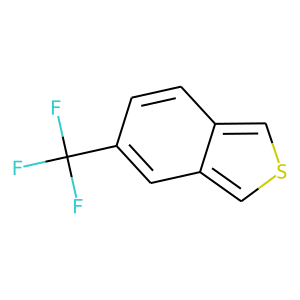

c1sc(c2c1cc(C(F)(F)F)cc2)

250


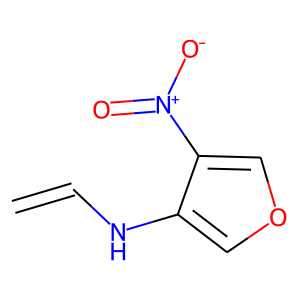

c1occ(N(=O)=O)c1NC=C

251


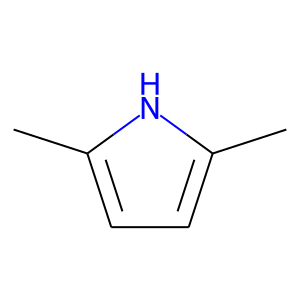

c1c(C)Nc(C)c1

252


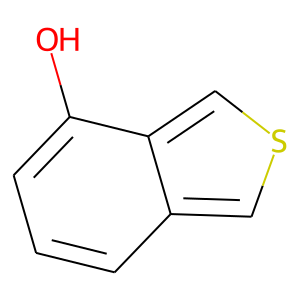

c1scc2c1c(ccc2O)

253


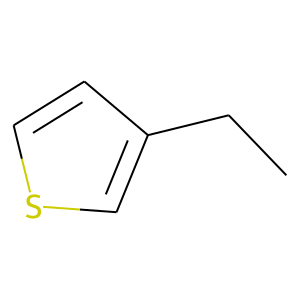

c1c(CC)cc(s1)

254


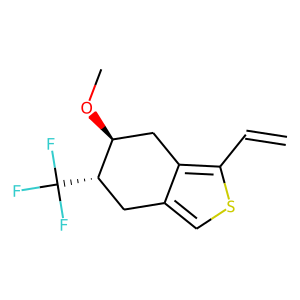

c1sc(c2c1C[C@H](C(F)(F)F)[C@@H](OC)C2)C=C

255


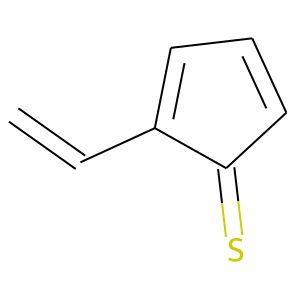

C1=CC=C(C1=S)C=C

256


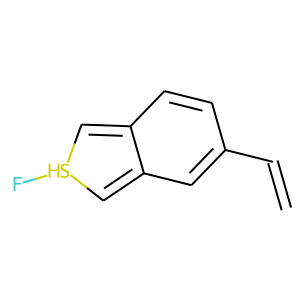

c1c2cS(F)cc2ccc1C=C

257


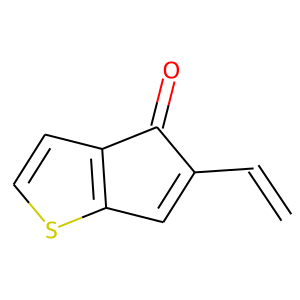

c1sc2c(c1)C(=O)C(=C2)C=C

258


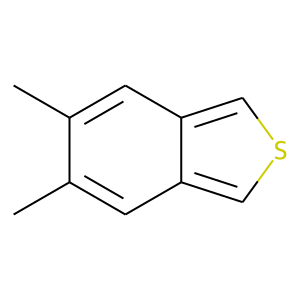

c1sc(c2c1cc(C)c(C)c2)

259


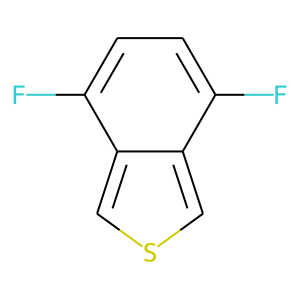

c1sc(c2c1c(F)ccc2F)

260


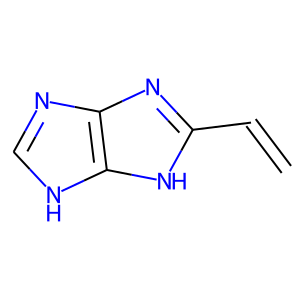

c1[nH]c2[nH]c(nc2n1)C=C

261


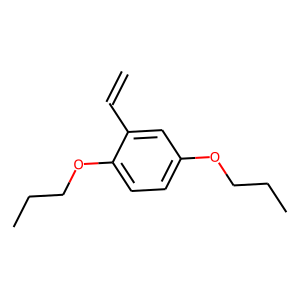

c1c(OCCC)c(cc(c1)OCCC)C=C

262


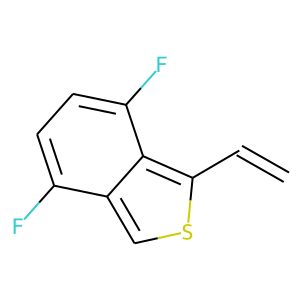

c1sc(c2c1c(F)ccc2F)C=C

263


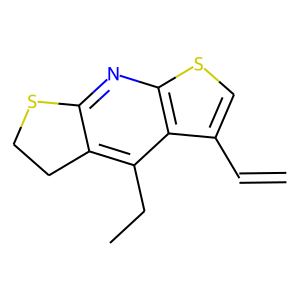

c1c(c2c(s1)nc1c(c2CC)CCS1)C=C

264


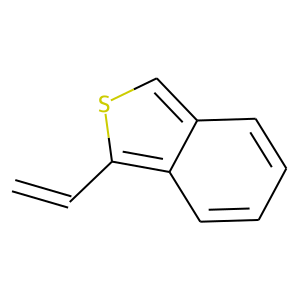

c1c2c(cccc2)c(s1)C=C

265


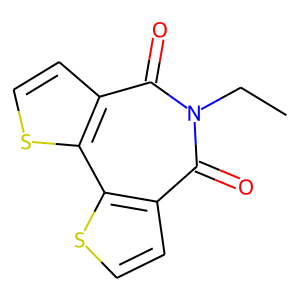

c1cc2c(s1)c1c(c(=O)n(c2=O)CC)cc(s1)

266


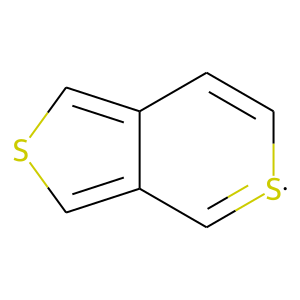

c1sc(c2c1C=[S]C=C2)

267


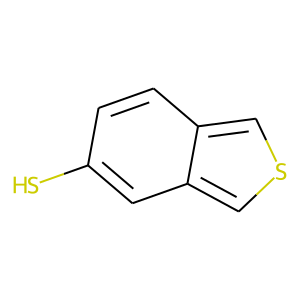

c1sc(c2c1cc(S)cc2)

268


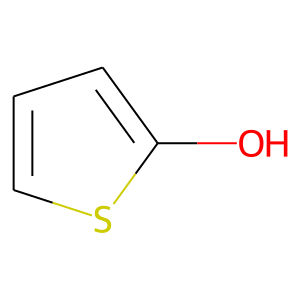

c1sc(O)c(c1)

269


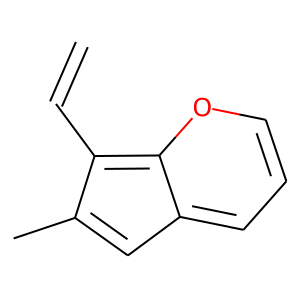

c1c(C)c(c2c1ccco2)C=C

270


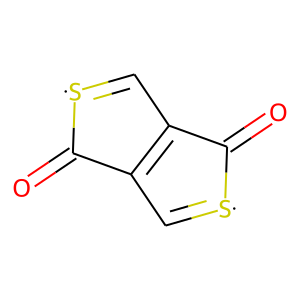

C1=[S]C(=O)C2=C1C(=O)[S]=C2

271


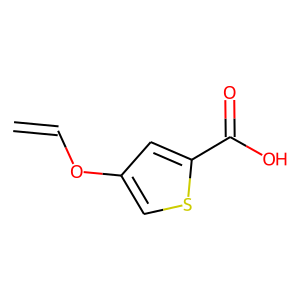

c1sc(C(=O)O)cc1OC=C

272


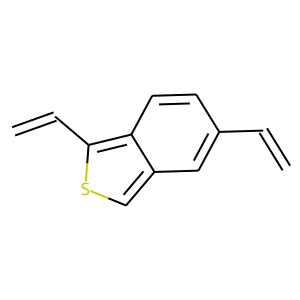

c1sc(c2c1cc(C=C)cc2)C=C

273


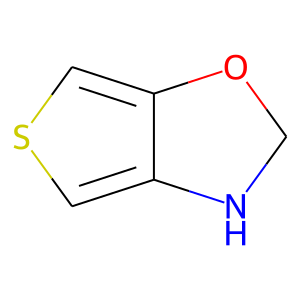

c1c2c(OCN2)c(s1)

274


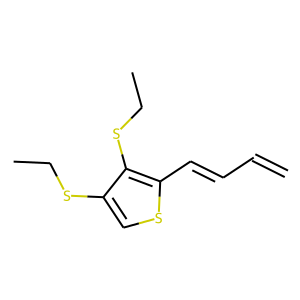

c1sc(c(c1SCC)SCC)C=CC=C

275


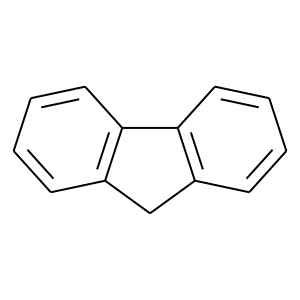

c1cc2c(cc1)c1c(C2)cc(cc1)

276


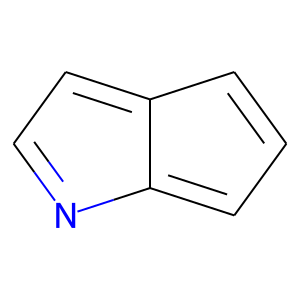

C1=CC2=CC(=NC2=C1)

277


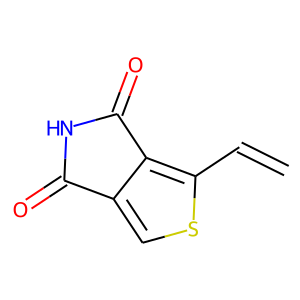

c1sc(c2c1C(=O)NC2=O)C=C

278


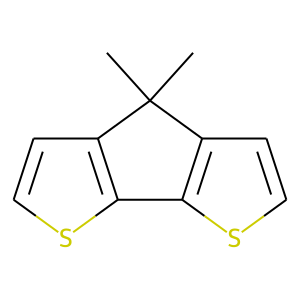

c1sc2c(c1)C(C)(C)c1c2sc(c1)

279


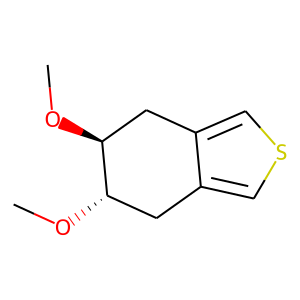

c1sc(c2c1C[C@H](OC)[C@@H](OC)C2)

280


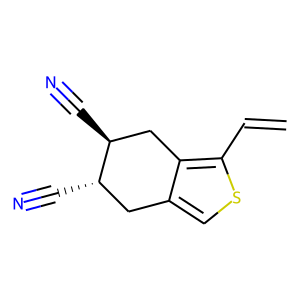

c1sc(c2c1C[C@H](C#N)[C@@H](C#N)C2)C=C

281


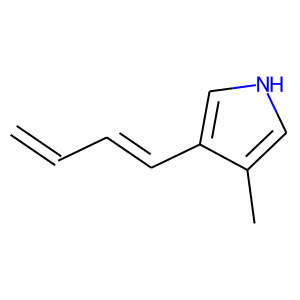

c1[nH]cc(c1C)C=CC=C

282


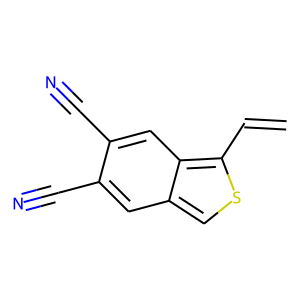

c1sc(c2c1cc(C#N)c(C#N)c2)C=C

283


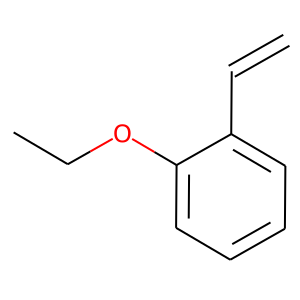

c1c(OCC)c(ccc1)C=C

284


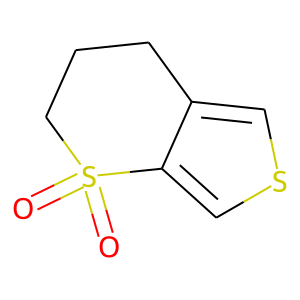

c1sc(c2c1S(=O)(=O)CCC2)

285


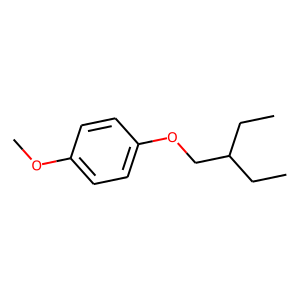

c1c(OC)cc(c(c1)OCC(CC)CC)

286


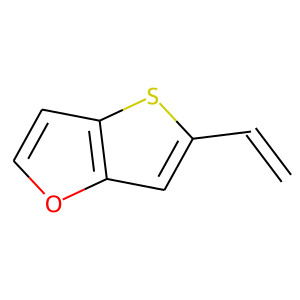

c1oc2cc(sc2c1)C=C

287


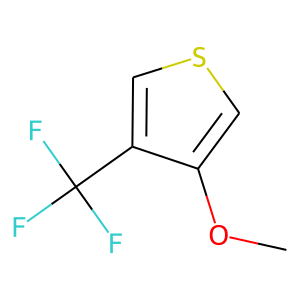

c1sc(c(c1OC)C(F)(F)F)

288


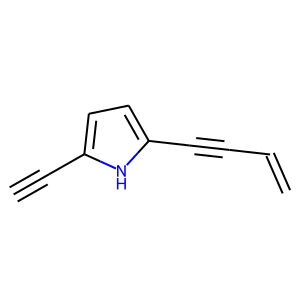

C#Cc1[nH]c(cc1)C#CC=C

289


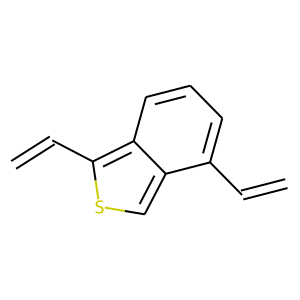

c1sc(c2c1c(C=C)ccc2)C=C

290


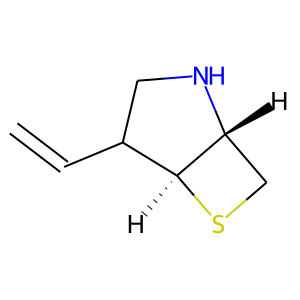

C1S[C@@H]2[C@@H]1NCC2C=C

291


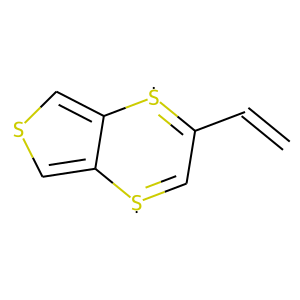

C1=[S]c2cscc2[S]=C1C=C

292


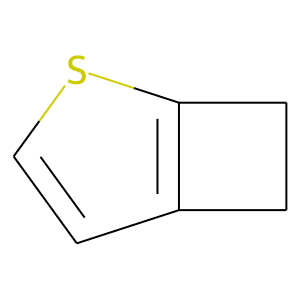

c1c2CCc2sc1

293


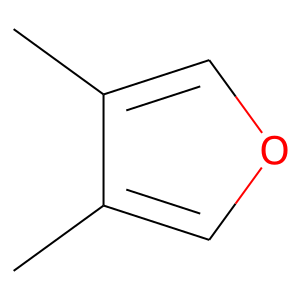

c1oc(c(c1C)C)

294


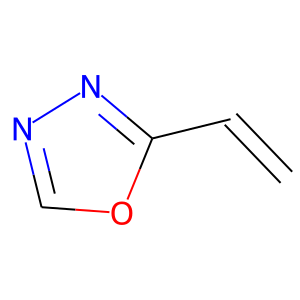

c1oc(nn1)C=C

295


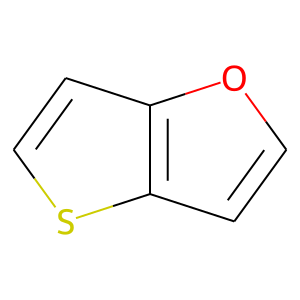

c1oc2cc(sc2c1)

296


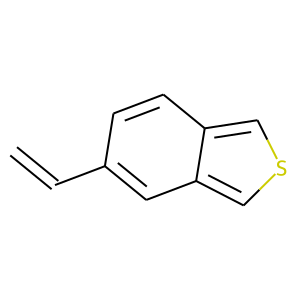

c1sc(c2c1cc(C=C)cc2)

297


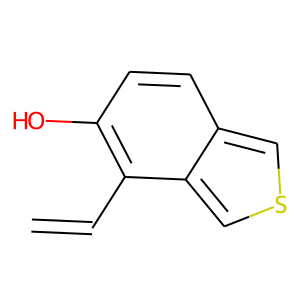

c1scc2c1c(c(cc2)O)C=C

298


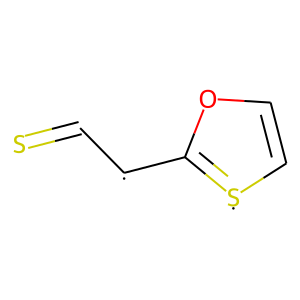

C(=S)[CH]C1=[S]C=C(O1)

299


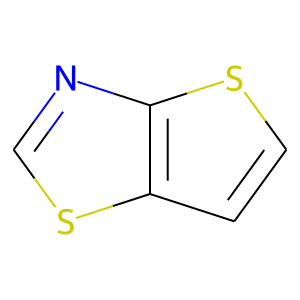

c1sc2nc(sc2c1)

300


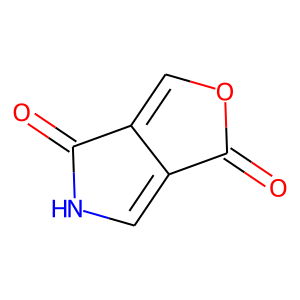

C1=C2C(C(=O)N1)=C(OC2=O)

301


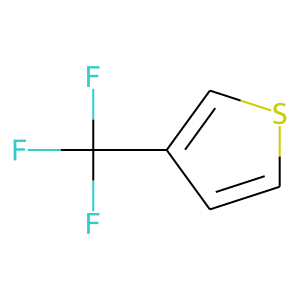

c1sc(c(c1)C(F)(F)F)

302


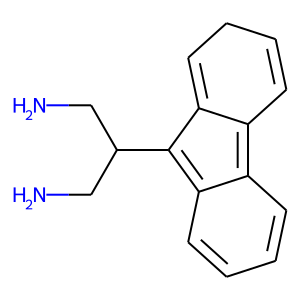

c1cc2c(C(CN)CN)c3cC(ccc3c2cc1)

303


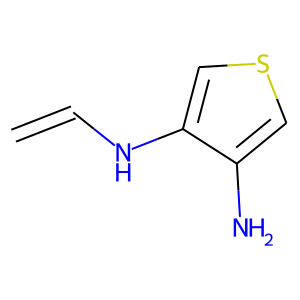

Nc1cscc1NC=C

304


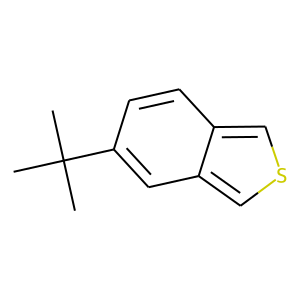

c1sc(c2c1cc(C(C)(C)C)cc2)

305


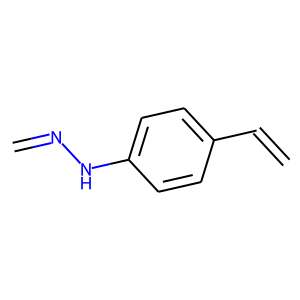

C=NNc1ccc(cc1)C=C

306


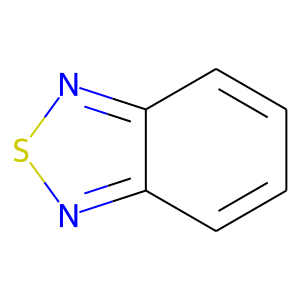

c1c2nsnc2c(cc1)

307


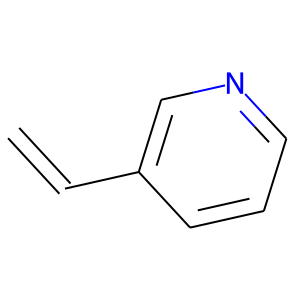

c1cc(cnc1)C=C

308


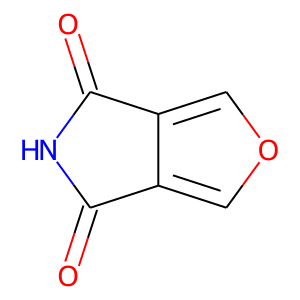

c(o1)c2c(=O)Nc(=O)c2c1

309


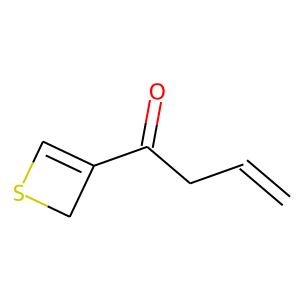

C1SC=C1C(=O)CC=C

310


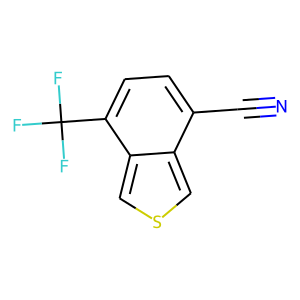

c1sc(c2c1c(C(F)(F)F)ccc2C#N)

311


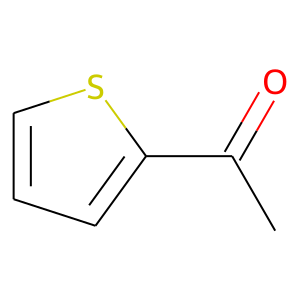

c1c(C(=O)C)scc1

312


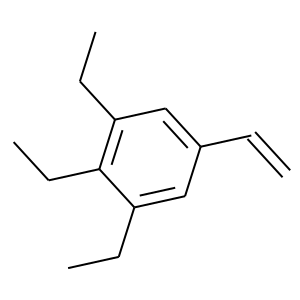

c1c(CC)c(CC)c(CC)cc1C=C

313


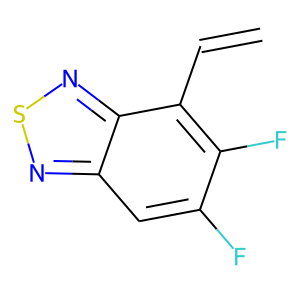

c1c(F)c(F)c(c2c1nsn2)C=C

314


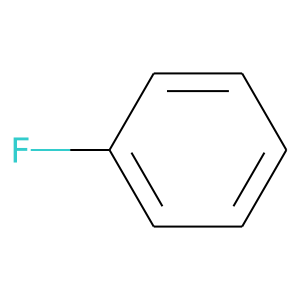

c1c(F)cccc1

315


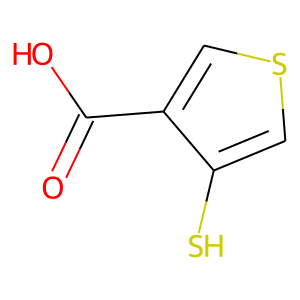

c1scc(C(=O)O)c1S

316


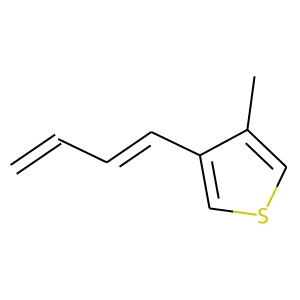

c1scc(C)c1C=CC=C

317


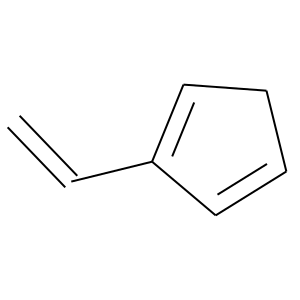

c1cCcc1C=C

318


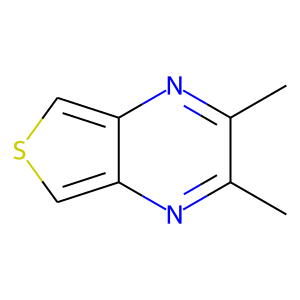

c1c2nc(C)c(C)nc2c(s1)

319


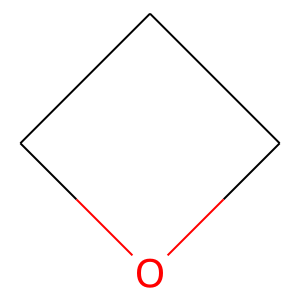

C1OCC1

320


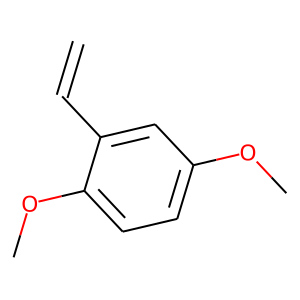

c1c(OC)c(cc(c1)OC)C=C

321


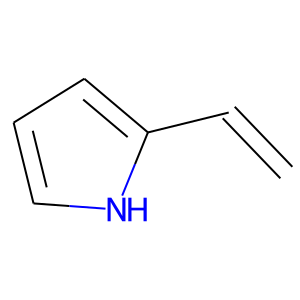

c1[nH]c(C=C)c(c1)

322


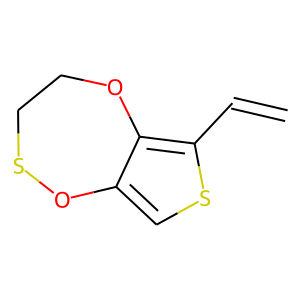

c1sc(c2c1OSCCO2)C=C

323


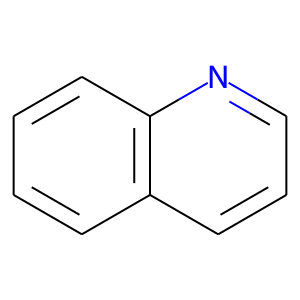

c1ccc(c2c1cccn2)

324


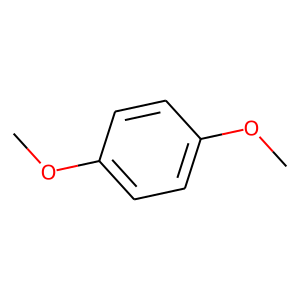

c1c(OC)c(cc(c1)OC)

325


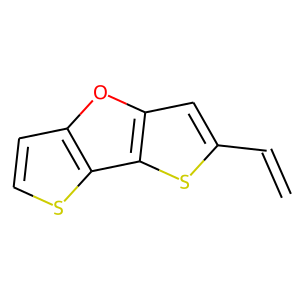

c1sc2c(c1)oc1c2sc(c1)C=C

326


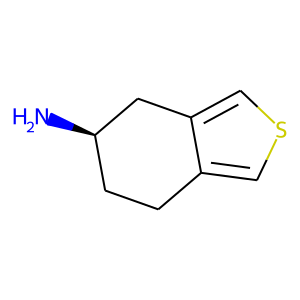

c1sc(c2c1CC[C@@H](N)C2)

327


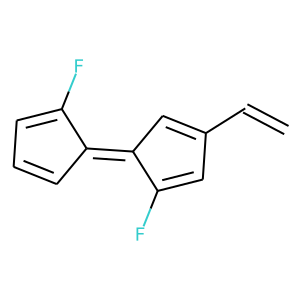

C1=C/C(/C(=C1)F)=C\1/C=C(C=C1F)C=C

328


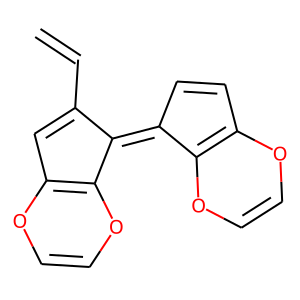

C1=CC2=C(OC=CO2)/C/1=C/1\C2=C(OC=CO2)C=C1C=C

329


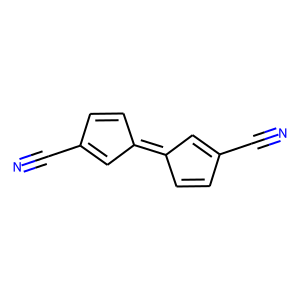

C1=CC(C#N)=C/C/1=C/1\C(=CC(=C1)C#N)

330


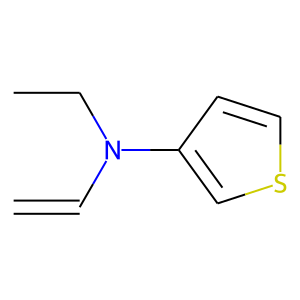

c1sccc1N(CC)C=C

331


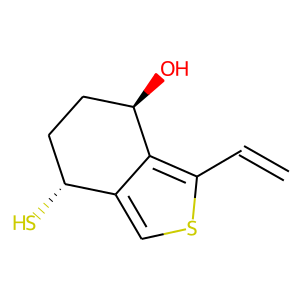

c1sc(c2c1[C@H](S)CC[C@H]2O)C=C

332


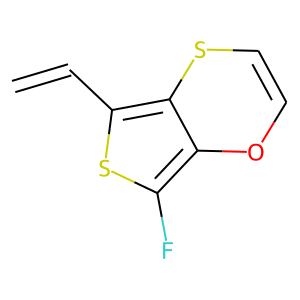

c(oc1c(F)s2)csc1c2C=C

333


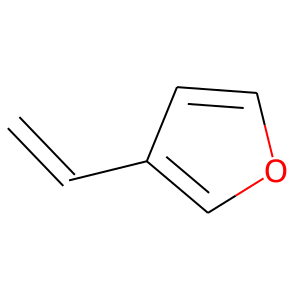

c1occc1C=C

334


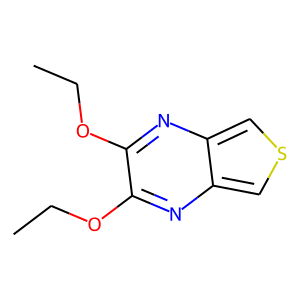

c1sc(c2c1nc(OCC)c(OCC)n2)

335


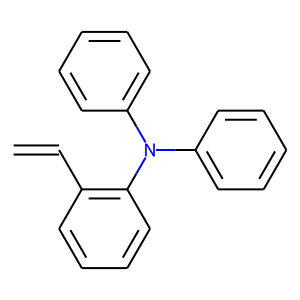

c1cc(c(cc1)N(c1ccccc1)c1ccccc1)C=C

336


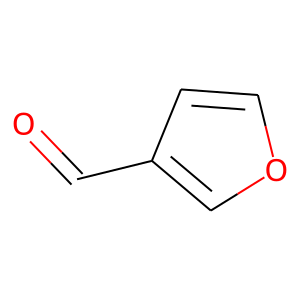

c1oc(cc1C=O)

337


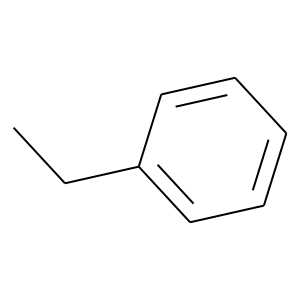

c1c(CC)c(ccc1)

338


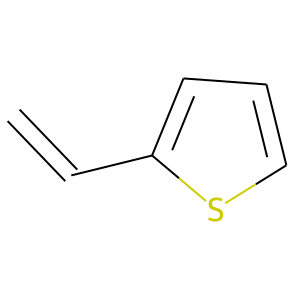

c1ccc(s1)C=C

339


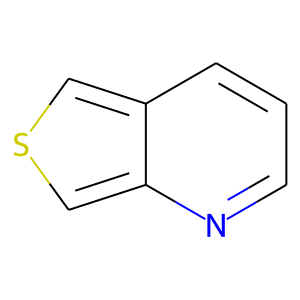

c1c2c(nccc2)c(s1)

340


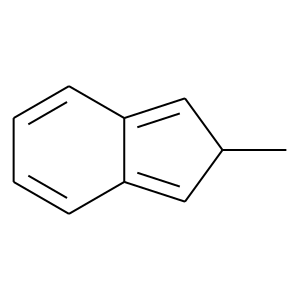

c(cc1)c2cC(C)cc2c1

341


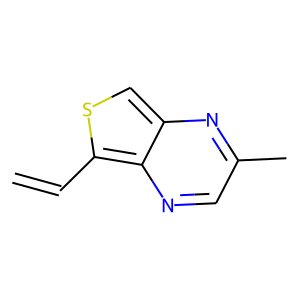

c1c2c(ncc(C)n2)c(s1)C=C

342


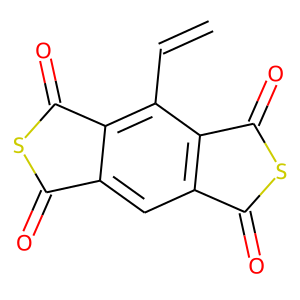

c1c2c(=O)sc(=O)c2c(c2c1c(=O)sc2=O)C=C

343


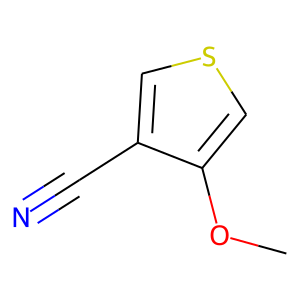

c1sc(c(c1OC)C#N)

344


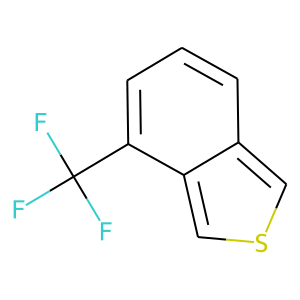

c1sc(c2c1c(C(F)(F)F)ccc2)

345


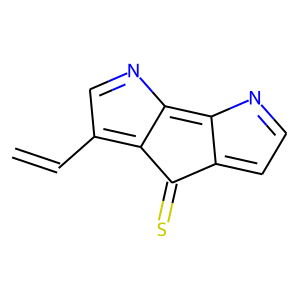

c1cnc2c1c(=S)c1c2ncc1C=C

346


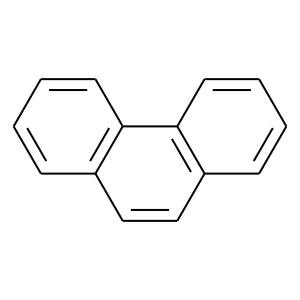

c1cc(cc2c1ccc1c2cccc1)

347


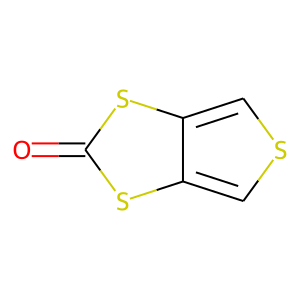

c1sc(c2c1sc(=O)s2)

348


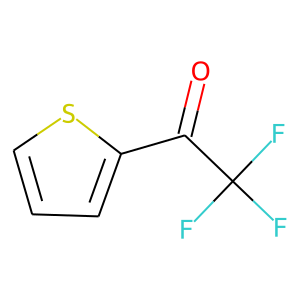

c1c(C(=O)C(F)(F)F)scc1

349


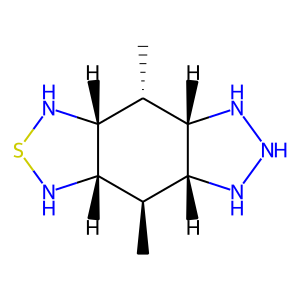

N1N[C@H]2[C@@H](C)[C@@H]3[C@@H](NSN3)[C@H](C)[C@H]2N1

350


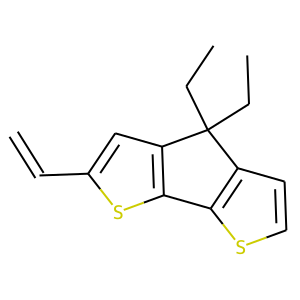

c1cc2c(s1)c1c(C2(CC)CC)cc(s1)C=C

351


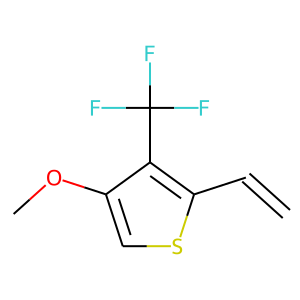

c1sc(c(c1OC)C(F)(F)F)C=C

352


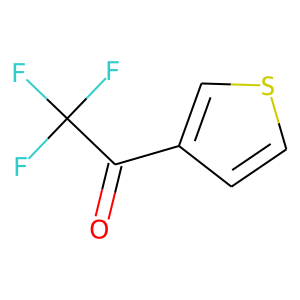

c1sc(c(c1)C(=O)C(F)(F)F)

353


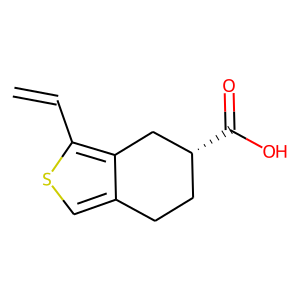

c1sc(c2c1CC[C@@H](C(=O)O)C2)C=C

354


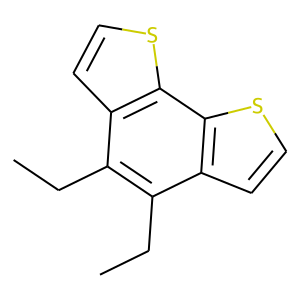

c1csc2c1c(CC)c(CC)c1c(csc21)

355


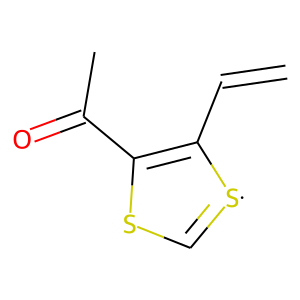

C1=[S]C(=C(S1)C(=O)C)C=C

356


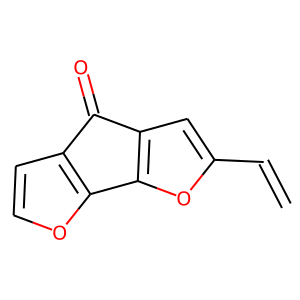

c1oc2c(c1)C(=O)c1c2oc(c1)C=C

357


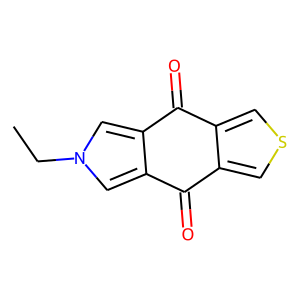

c(s1)c2c(=O)c3cn(CC)cc3c(=O)c2c1

358


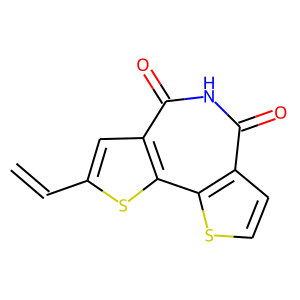

c1cc2c(s1)c1c(c(=O)[nH]c2=O)cc(s1)C=C

359


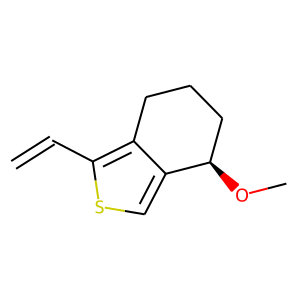

c1sc(c2c1[C@H](OC)CCC2)C=C

360


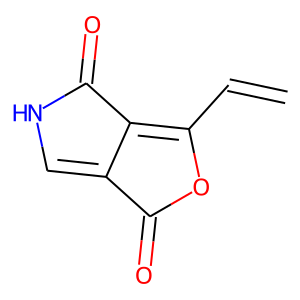

C1=C2C(C(=O)N1)=C(OC2=O)C=C

361


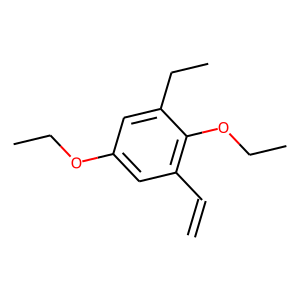

c1c(OCC)cc(CC)c(OCC)c1C=C

362


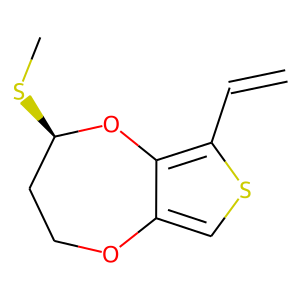

c1sc(c2c1OCC[C@@H](SC)O2)C=C

363


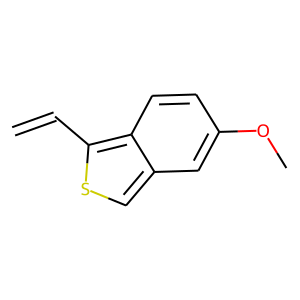

c1sc(c2c1cc(OC)cc2)C=C

364


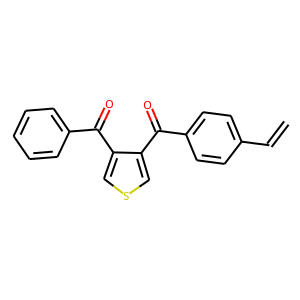

c1c(C(=O)c2cscc2C(=O)c2ccccc2)ccc(c1)C=C

365


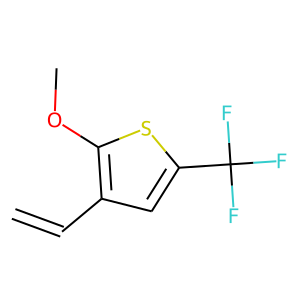

c1c(C(F)(F)F)sc(OC)c1C=C

366


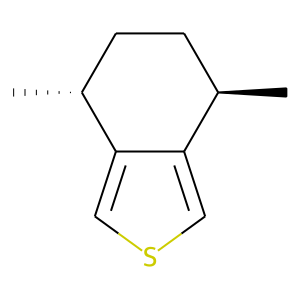

c1sc(c2c1[C@H](C)CC[C@H]2C)

367


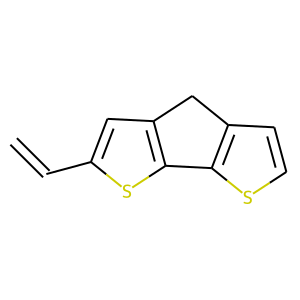

c1cc2c(s1)c1c(C2)cc(s1)C=C

368


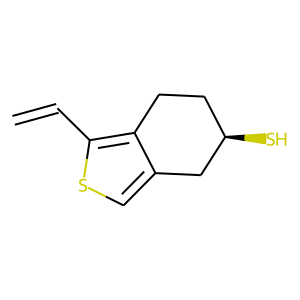

c1sc(c2c1C[C@H](S)CC2)C=C

369


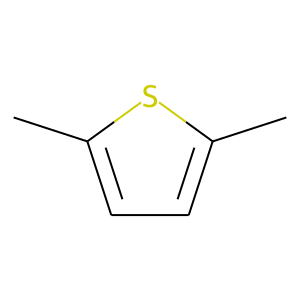

c1c(C)sc(C)c1

370


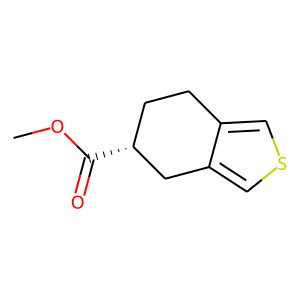

c1sc(c2c1C[C@H](C(=O)OC)CC2)

371


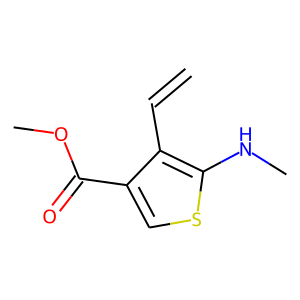

c1sc(NC)c(c1C(=O)OC)C=C

372


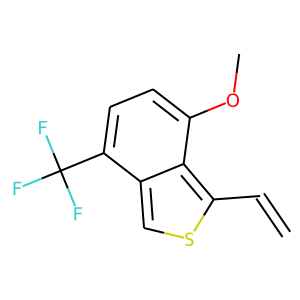

c1sc(c2c1c(C(F)(F)F)ccc2OC)C=C

373


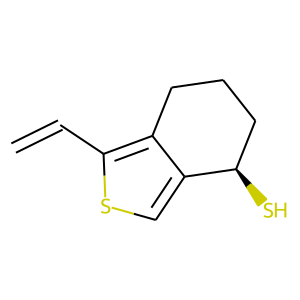

c1sc(c2c1[C@H](S)CCC2)C=C

374


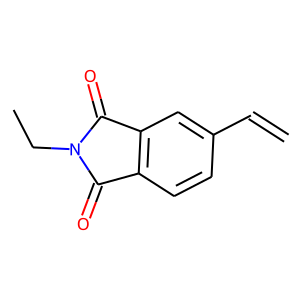

c1cc2c(C(=O)N(C2=O)CC)cc1C=C

375


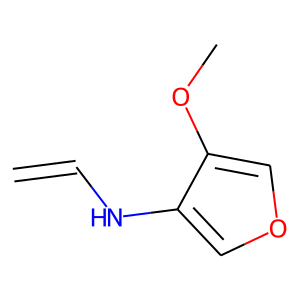

c1occ(OC)c1NC=C

376


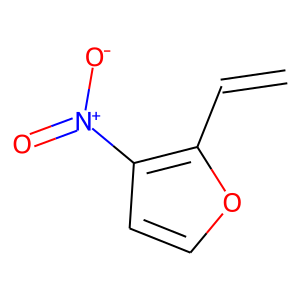

c1oc(c(c1)N(=O)=O)C=C

377


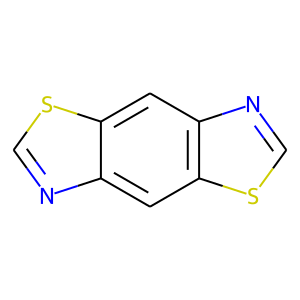

c1c2c(ncs2)c(c2c1ncs2)

378


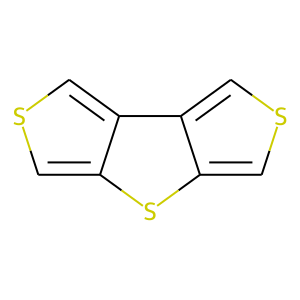

c1scc2c1sc1c2csc1

379


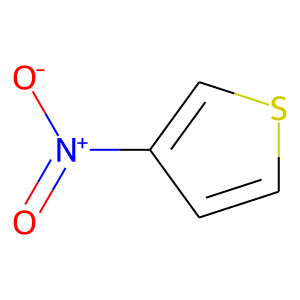

c1sc(c(c1)N(=O)=O)

380


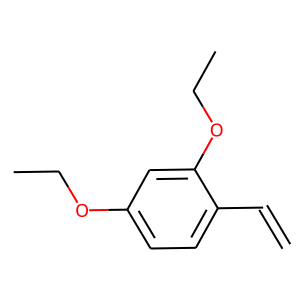

c1c(OCC)cc(OCC)c(c1)C=C

381


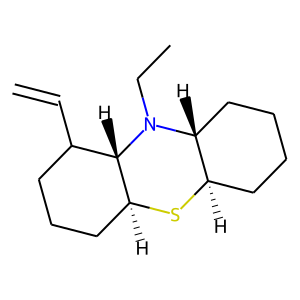

C1C[C@@H]2[C@@H](CC1)N(CC)[C@@H]1[C@@H](S2)CCCC1C=C

382


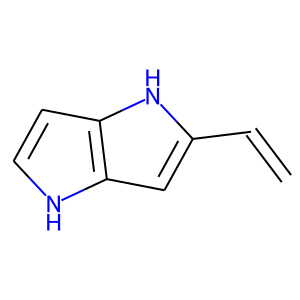

c1[nH]c2cc([nH]c2c1)C=C

383


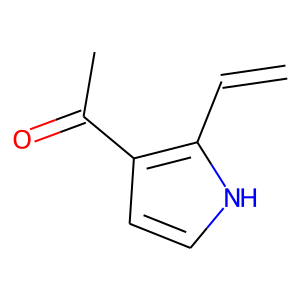

c1[nH]c(c(c1)C(=O)C)C=C

384


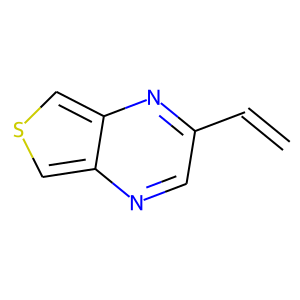

c1nc2cscc2nc1C=C

385


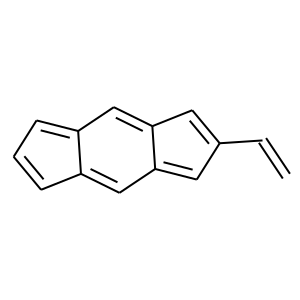

C1=Cc2cc3=CC(=Cc3cc2=C1)C=C

386


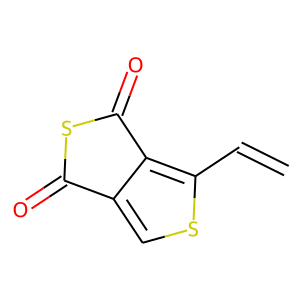

c1sc(c2c1C(=O)SC2=O)C=C

387


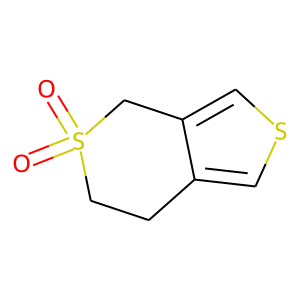

c1sc(c2c1CCS(=O)(=O)C2)

388


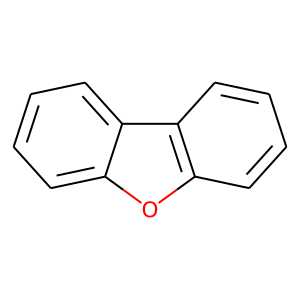

c1ccc2c(c1)oc1c2ccc(c1)

389


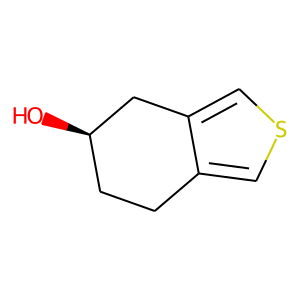

c1sc(c2c1CC[C@@H](O)C2)

390


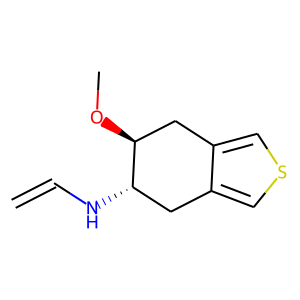

c1scc2c1C[C@@H]([C@@H](OC)C2)NC=C

391


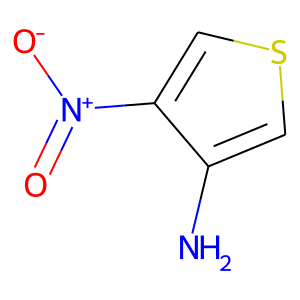

c1scc(N(=O)=O)c1N

392


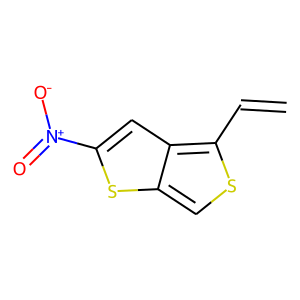

c1sc(c2c1sc(N(=O)=O)c2)C=C

393


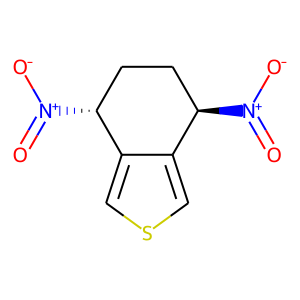

c1sc(c2c1[C@H](N(=O)=O)CC[C@H]2N(=O)=O)

394


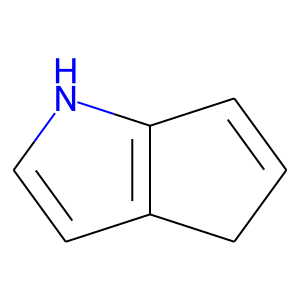

C1=Cc2[nH]c(cc2C1)

395


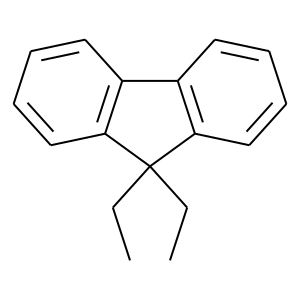

c1cc2c(cc1)c1c(C2(CC)CC)cc(cc1)

396


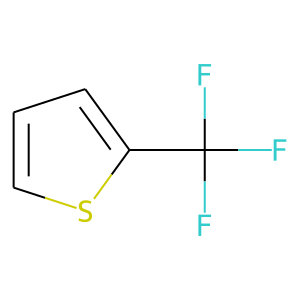

c1sc(C(F)(F)F)cc1

397


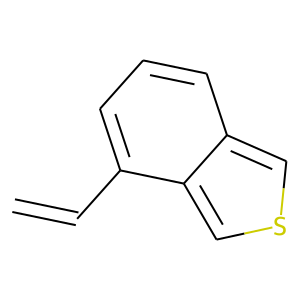

c1sc(c2c1c(C=C)ccc2)

398


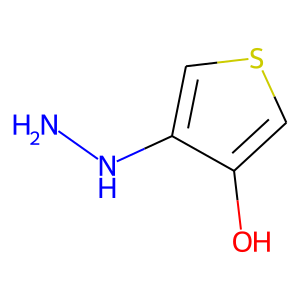

c(s1)c(O)c(NN)c1

399


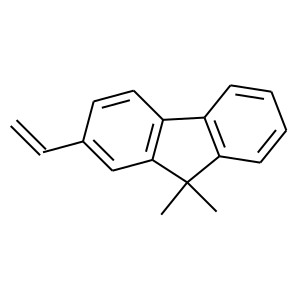

c1cc2c(cc1)c1c(C2(C)C)cc(cc1)C=C

400


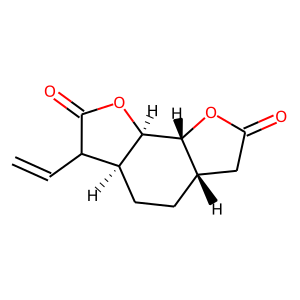

C1C(=O)O[C@@H]2[C@H]1CC[C@@H]1[C@H]2OC(=O)C1C=C

401


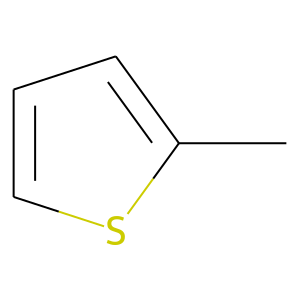

c1sc(C)c(c1)

402


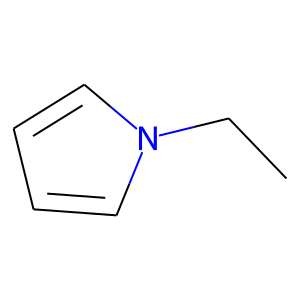

c1n(CC)c(cc1)

403


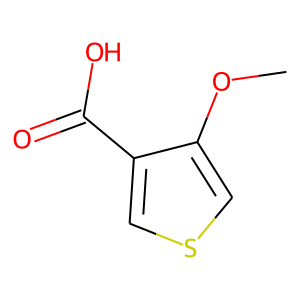

c1sc(c(c1C(=O)O)OC)

404


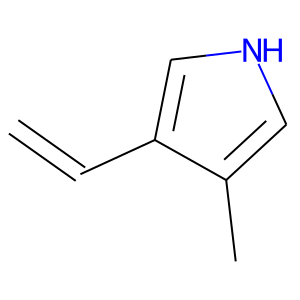

c1[nH]cc(c1C)C=C

405


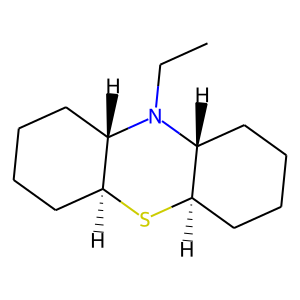

C1C[C@@H]2[C@@H](CC1)N(CC)[C@@H]1[C@@H](S2)CCCC1

406


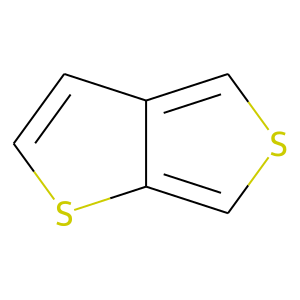

c1sc(c2c1scc2)

407


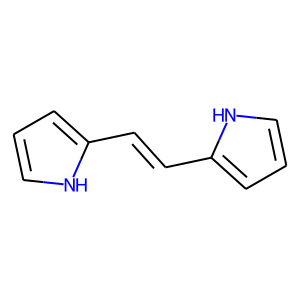

c1[nH]c(/C=C/c2[nH]ccc2)c(c1)

408


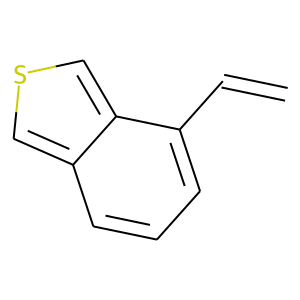

c1c2cccc(c2cs1)C=C

409


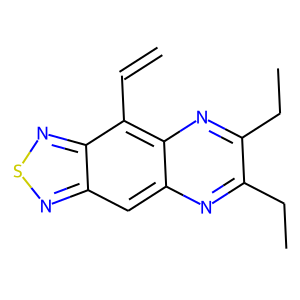

c1c2nsnc2c(c2c1nc(CC)c(CC)n2)C=C

410


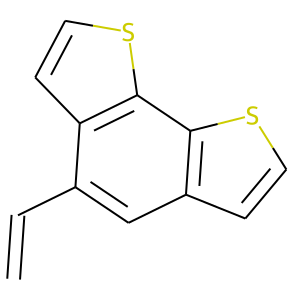

c1csc2c1cc(c1c2scc1)C=C

411


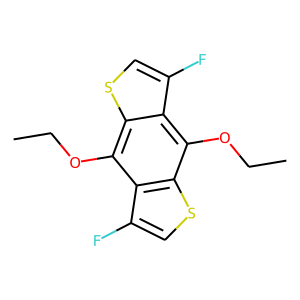

c1sc2c(c1F)c(OCC)c1c(c2OCC)c(F)c(s1)

412


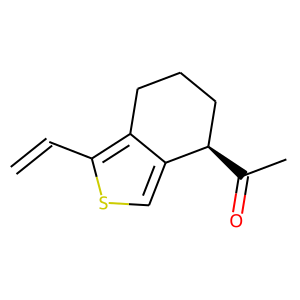

c1sc(c2c1[C@H](C(=O)C)CCC2)C=C

413


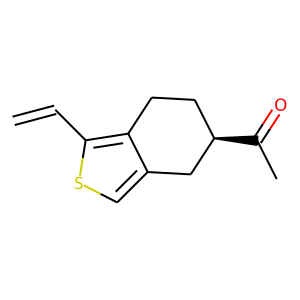

c1sc(c2c1C[C@H](C(=O)C)CC2)C=C

414


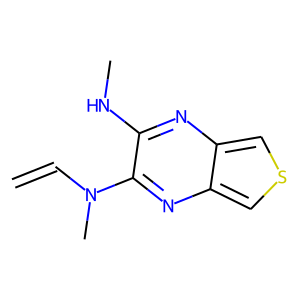

c1scc2c1nc(c(NC)n2)N(C)C=C

415


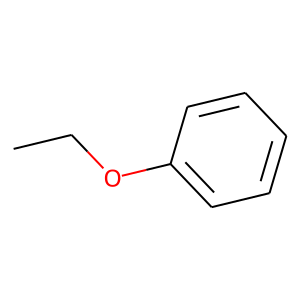

c1c(OCC)c(ccc1)

416


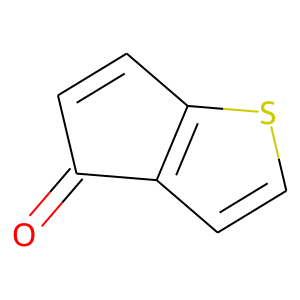

c1sc2c(c1)C(=O)C(=C2)

417


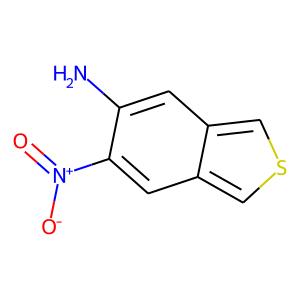

c1sc(c2c1cc(N(=O)=O)c(N)c2)

418


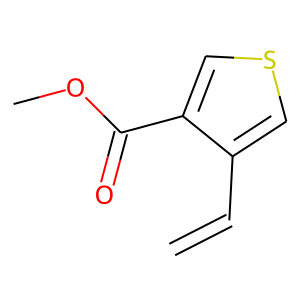

c1scc(C(=O)OC)c1C=C

419


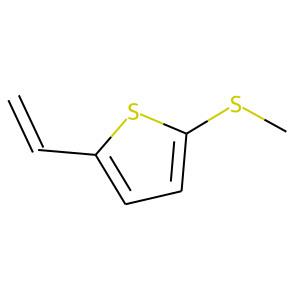

c1cc(SC)sc1C=C

420


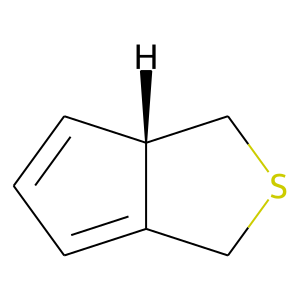

C1=C2CSC[C@H]2C(=C1)

421


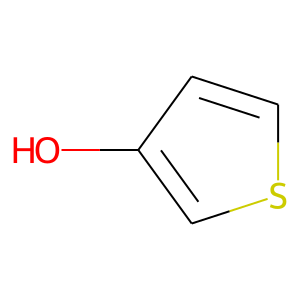

c1sccc1O

422


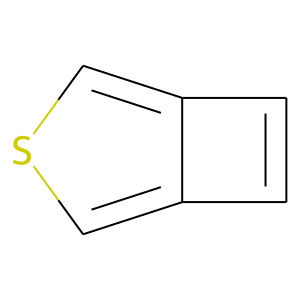

C1=C(c2cscc12)

423


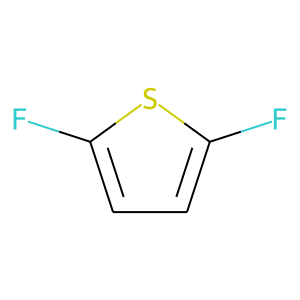

c1c(F)sc(F)c1

424


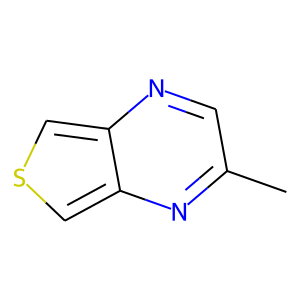

c1c2c(ncc(C)n2)c(s1)

425


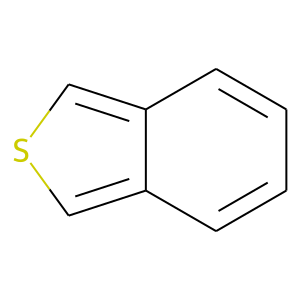

c1c2c(cccc2)c(s1)

426


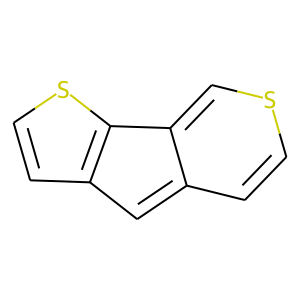

c1cc2c(cs1)c1c(ccs1)c2

427


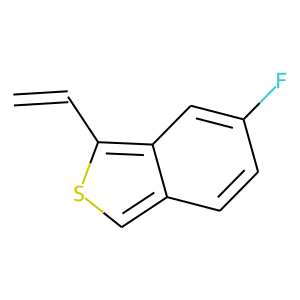

c1sc(c2c1ccc(F)c2)C=C

428


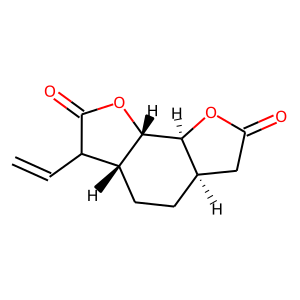

C1C(=O)O[C@H]2[C@@H]1CC[C@H]1[C@@H]2OC(=O)C1C=C

429


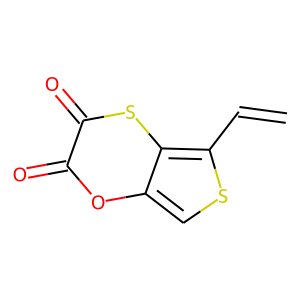

c1sc(c2c1oc(=O)c(=O)s2)C=C

430


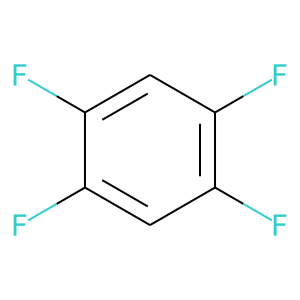

c1c(F)c(F)c(c(c1F)F)

431


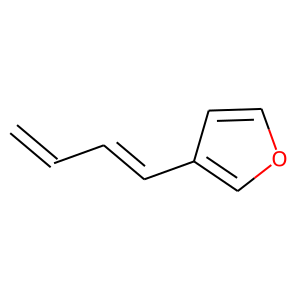

c1occc1C=CC=C

432


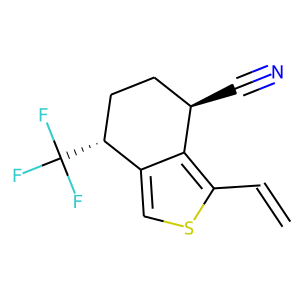

c1sc(c2c1[C@H](C(F)(F)F)CC[C@H]2C#N)C=C

433


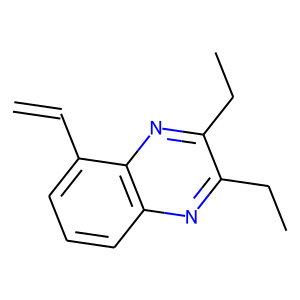

c1ccc(c2c1nc(CC)c(CC)n2)C=C

434


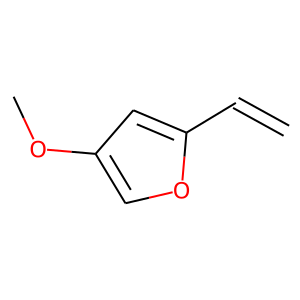

c1oc(cc1OC)C=C

435


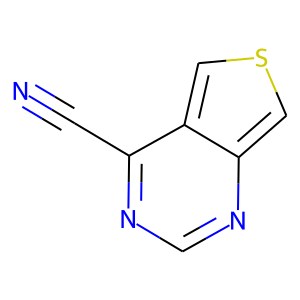

c1sc(c2c1ncnc2C#N)

436


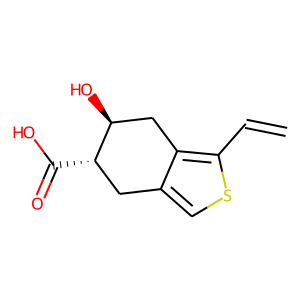

c1sc(c2c1C[C@H](C(=O)O)[C@@H](O)C2)C=C

437


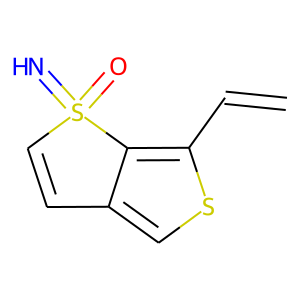

c(s1)c2ccs(=N)(=O)c2c1C=C

438


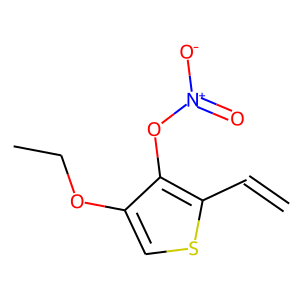

c1sc(c(c1OCC)ON(=O)=O)C=C

439


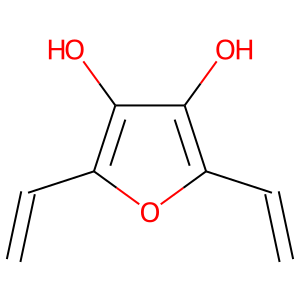

C=Cc1oc(c(c1O)O)C=C

440


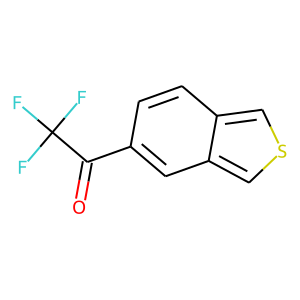

c1sc(c2c1cc(C(=O)C(F)(F)F)cc2)

441


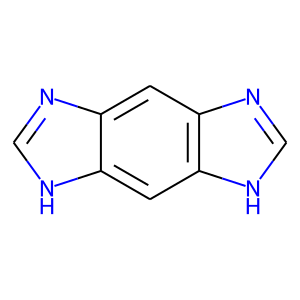

c1c2[nH]cnc2c(c2c1[nH]cn2)

442


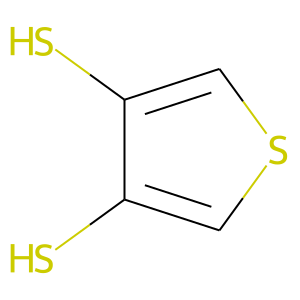

Sc1cscc1S

443


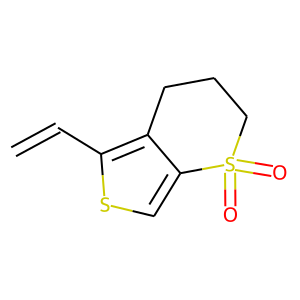

c1sc(c2c1S(=O)(=O)CCC2)C=C

444


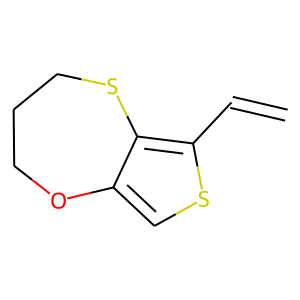

c1sc(c2c1OCCCS2)C=C

445


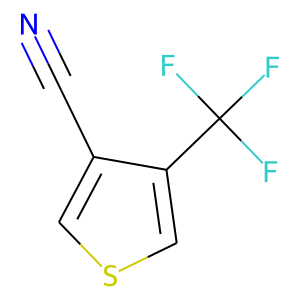

c1sc(c(c1C#N)C(F)(F)F)

446


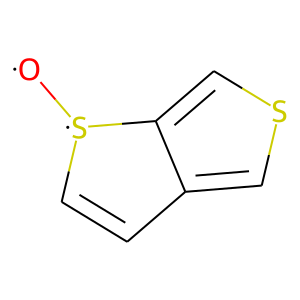

c1scc2c1C(=C[S@@]2[O])

447


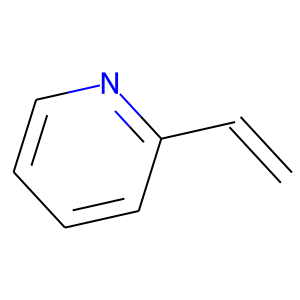

c1cnc(cc1)C=C

448


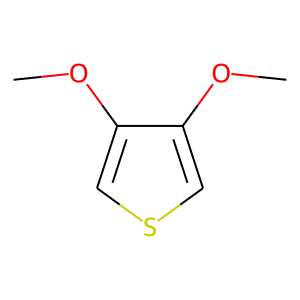

c1sc(c(c1OC)OC)

449


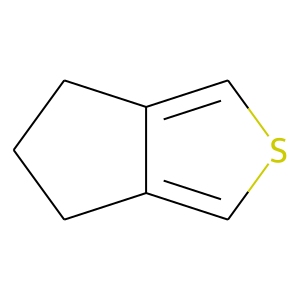

c1sc(c2c1CCC2)

450


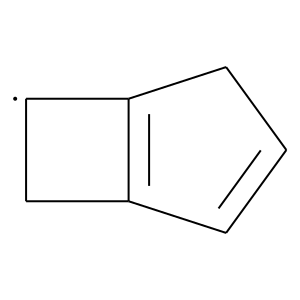

C1=C(CC2=C1C[CH]2)

451


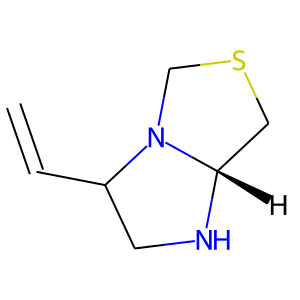

C1SCN2[C@H]1NCC2C=C

452


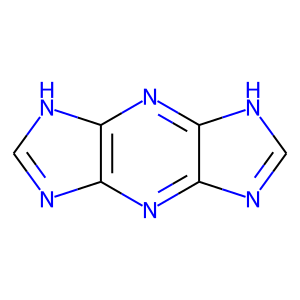

c1[nH]c2nc3[nH]c(nc3nc2n1)

453


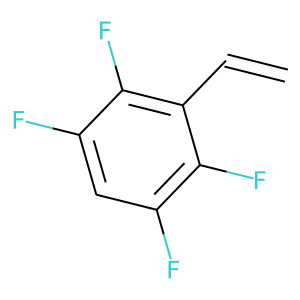

c1c(F)c(F)c(c(c1F)F)C=C

454


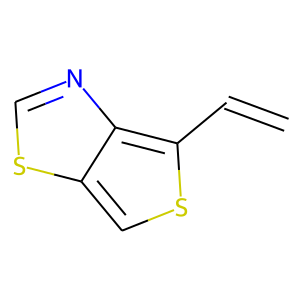

c(s1)c2scnc2c1C=C

455


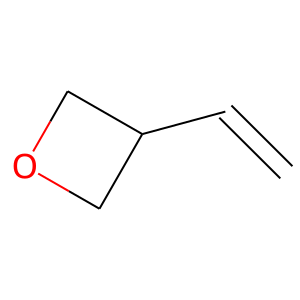

C1OCC1C=C

456


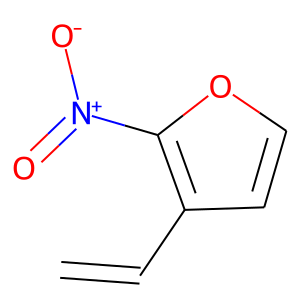

c1coc(N(=O)=O)c1C=C

457


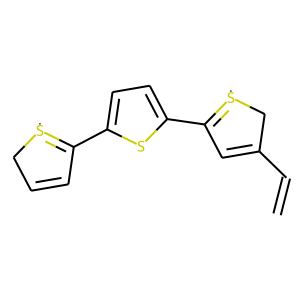

C1=CC(=[S]C1)c1ccc(s1)C1=[S]CC(=C1)C=C

458


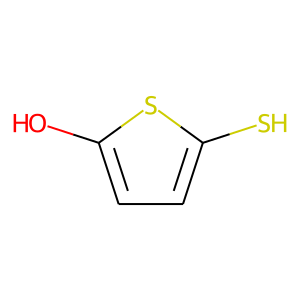

c1c(S)sc(O)c1

459


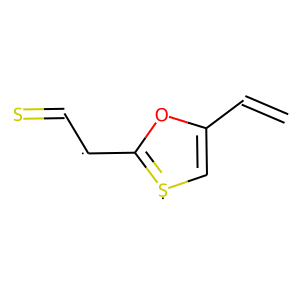

C(=S)[CH]C1=[S]C=C(O1)C=C

460


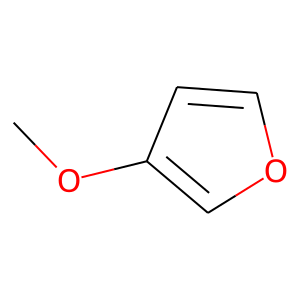

c1oc(cc1OC)

461


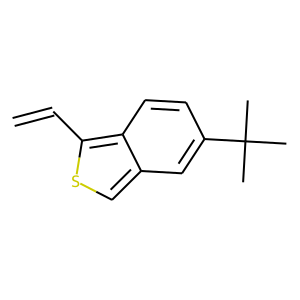

c1sc(c2c1cc(C(C)(C)C)cc2)C=C

462


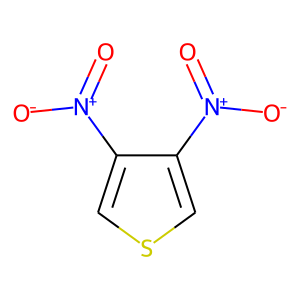

c1sc(c(c1N(=O)=O)N(=O)=O)

463


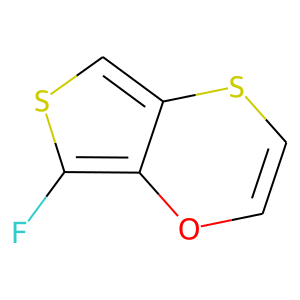

c(oc1c(F)s2)csc1c2

464


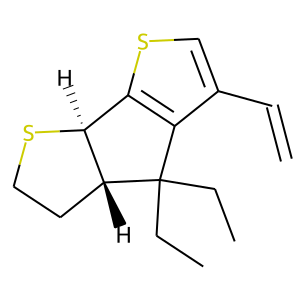

c1c(c2c(s1)[C@H]1[C@H](C2(CC)CC)CCS1)C=C

465


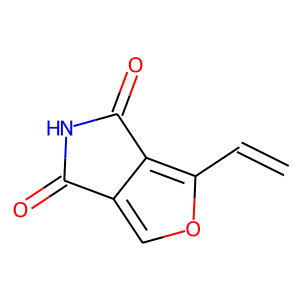

c(o1)c2c(=O)Nc(=O)c2c1C=C

466


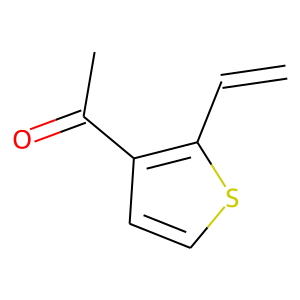

c1sc(c(c1)C(=O)C)C=C

467


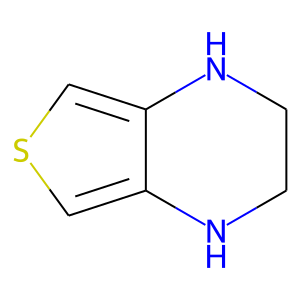

N1c2cscc2N(CC1)

468


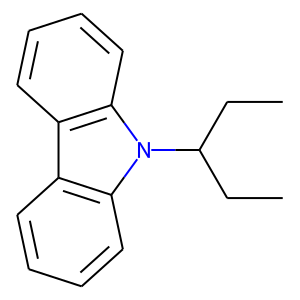

c1cc(cc2c1n(c1c2cccc1)C(CC)CC)

469


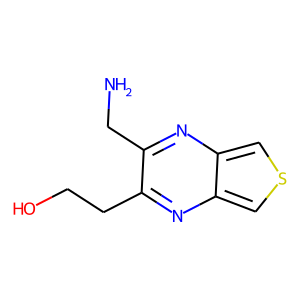

c1sc(c2c1nc(CCO)c(CN)n2)

470


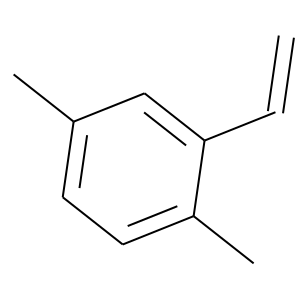

c1c(C)cc(c(c1)C)C=C

471


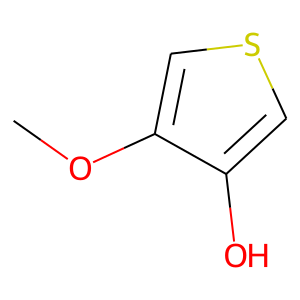

c1sc(c(c1O)OC)

472


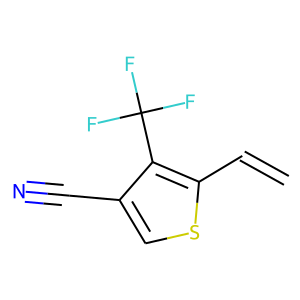

c1sc(c(c1C#N)C(F)(F)F)C=C

473


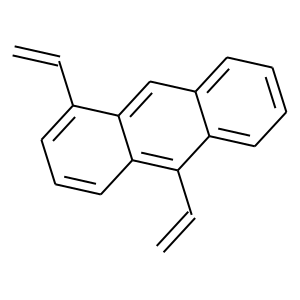

c1c2c(C=C)c3c(cc2ccc1)c(ccc3)C=C

474


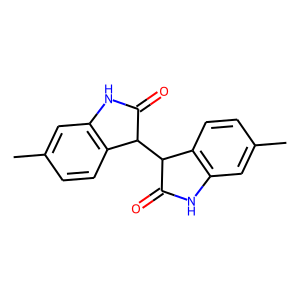

N1C(=O)C(c2c1cc(cc2)C)C1C(=O)N(c2c1ccc(C)c2)

475


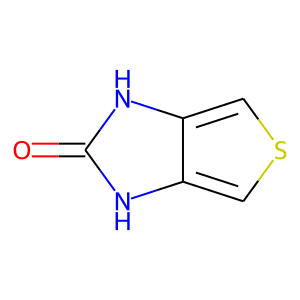

c1sc(c2c1[nH]c(=O)[nH]2)

476


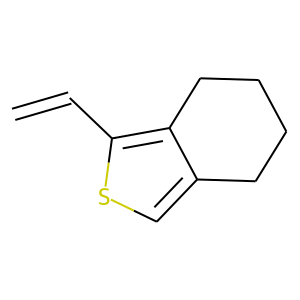

c1sc(c2c1CCCC2)C=C

477


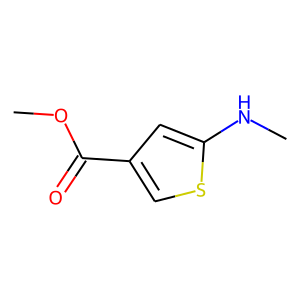

c1sc(NC)c(c1C(=O)OC)

478


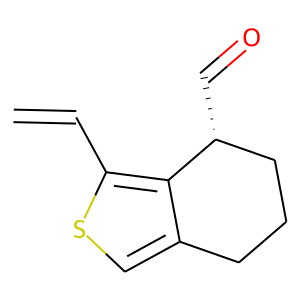

c1sc(c2c1CCC[C@H]2C=O)C=C

479


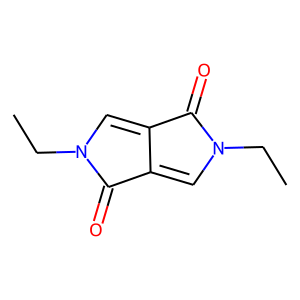

c1n(CC)c(=O)c2c1c(=O)n(CC)c2

480


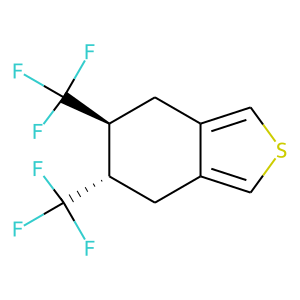

c1sc(c2c1C[C@H](C(F)(F)F)[C@@H](C(F)(F)F)C2)

481


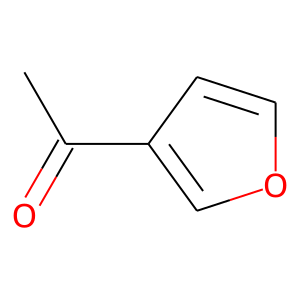

c1oc(cc1C(=O)C)

482


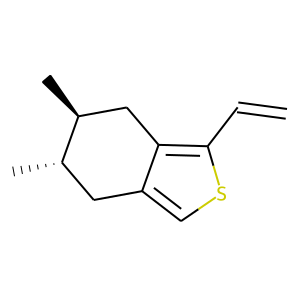

c1sc(c2c1C[C@H](C)[C@@H](C)C2)C=C

483


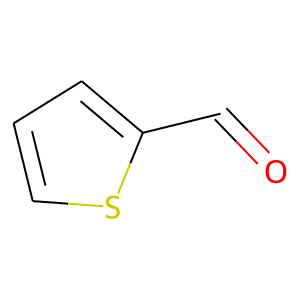

c1sc(C=O)c(c1)

484


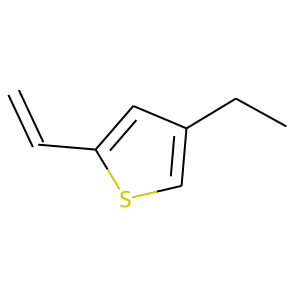

c1c(CC)cc(s1)C=C

485


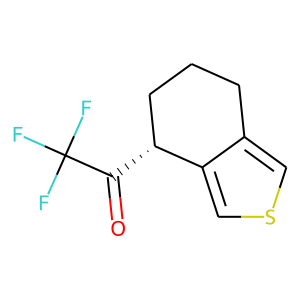

c1sc(c2c1[C@H](C(=O)C(F)(F)F)CCC2)

486


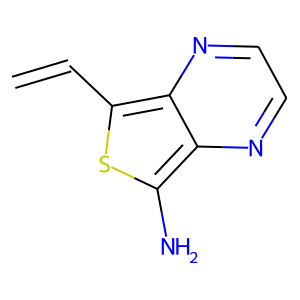

Nc1sc(c2c1nccn2)C=C

487


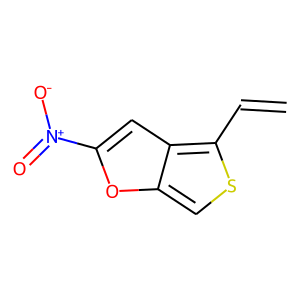

c1sc(c2c1oc(N(=O)=O)c2)C=C

488


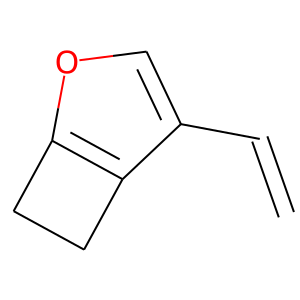

c1oc2CCc2c1C=C

489


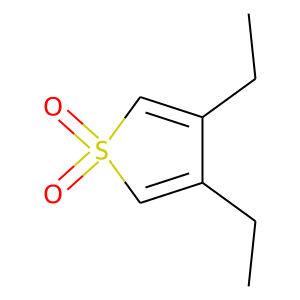

C1=C(CC)C(CC)=C(S1(=O)=O)

490


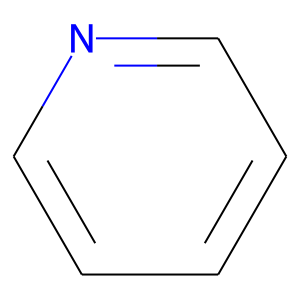

c1cc(cnc1)

491


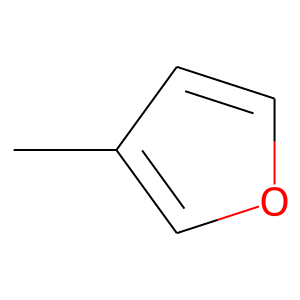

c1oc(cc1C)

492


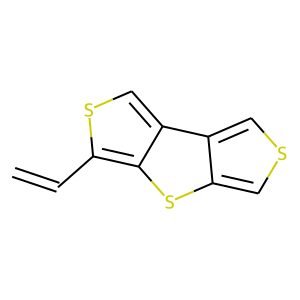

c1scc2c1sc1c2csc1C=C

493


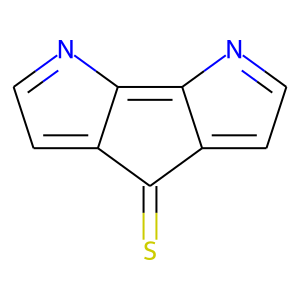

c1cnc2c1c(=S)c1c2ncc1

494


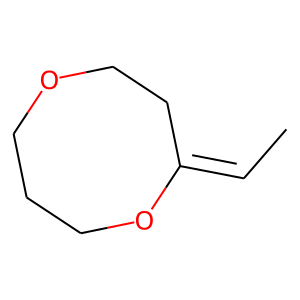

C/C=C\1/OCCC(OCC1)

495


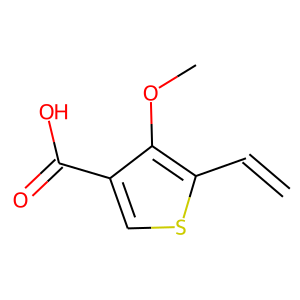

c1sc(c(c1C(=O)O)OC)C=C

496


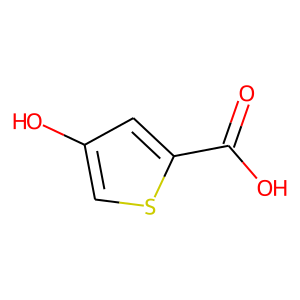

c1sc(C(=O)O)cc1O

497


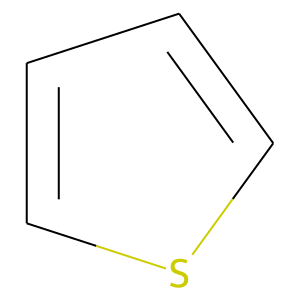

c1ccc(s1)

498


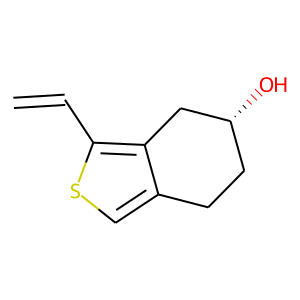

c1sc(c2c1CC[C@@H](O)C2)C=C

499


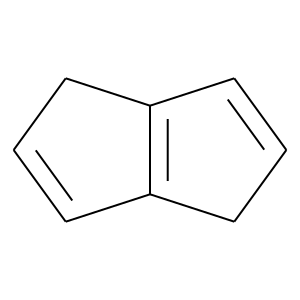

C1=CC2=C(C1)C=C(C2)

500


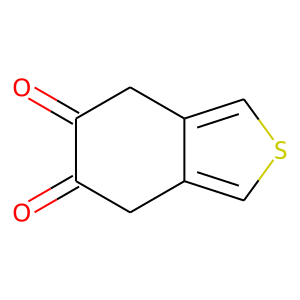

c1sc(c2c1CC(=O)C(=O)C2)

501


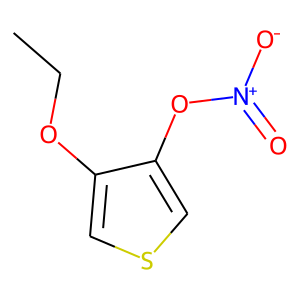

c1sc(c(c1OCC)ON(=O)=O)

502


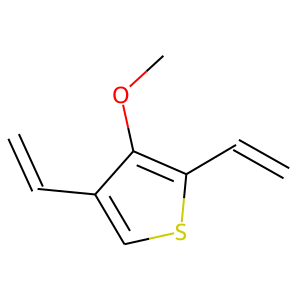

c1sc(c(c1C=C)OC)C=C

503


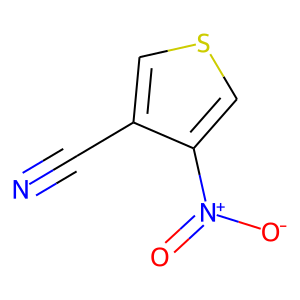

c1sc(c(c1N(=O)=O)C#N)

504


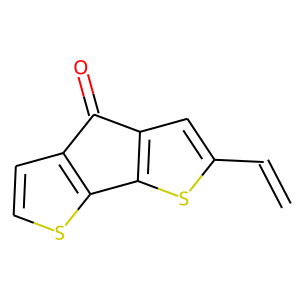

c1sc2c(c1)C(=O)c1c2sc(c1)C=C

505


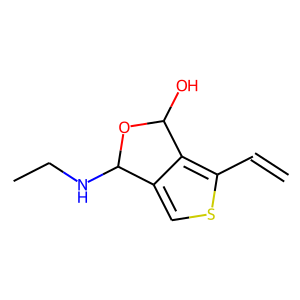

c(s1)c2C(NCC)OC(O)c2c1C=C

506


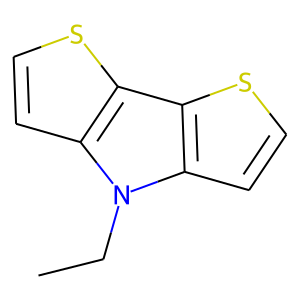

c1csc2c1n(CC)c1c2scc1

507


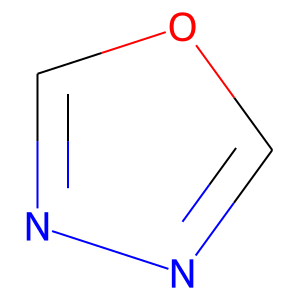

c1oc(nn1)

508


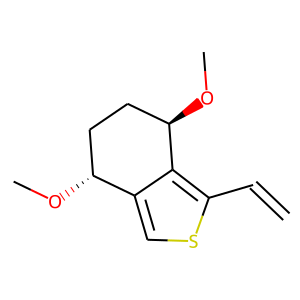

c1sc(c2c1[C@H](OC)CC[C@H]2OC)C=C

509


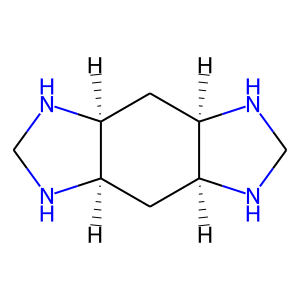

N1CN[C@@H]2C[C@H]3[C@@H](C[C@H]12)N(CN3)

510


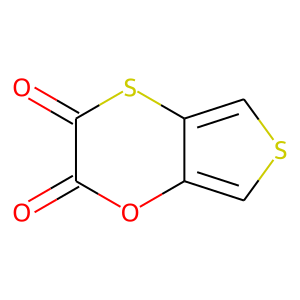

c1sc(c2c1oc(=O)c(=O)s2)

511


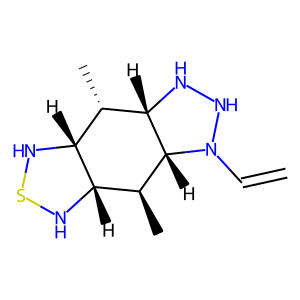

N1N[C@H]2[C@@H](C)[C@@H]3[C@@H](NSN3)[C@H](C)[C@H]2N1C=C

512


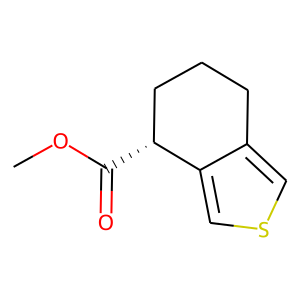

c1sc(c2c1[C@H](C(=O)OC)CCC2)

513


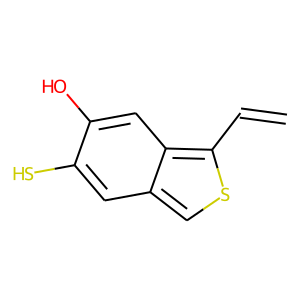

c1sc(c2c1cc(S)c(O)c2)C=C

514


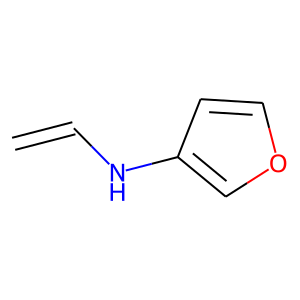

c1occc1NC=C

515


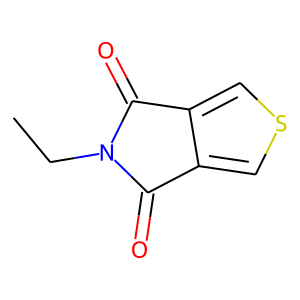

c(s1)c2c(=O)N(CC)c(=O)c2c1

516


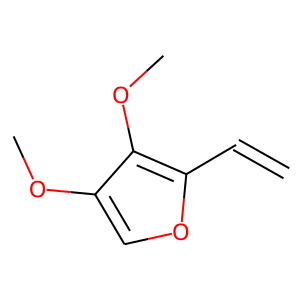

c1oc(c(c1OC)OC)C=C

517


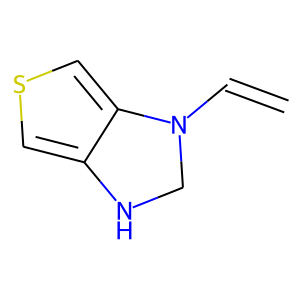

N1c2cscc2N(C1)C=C

518


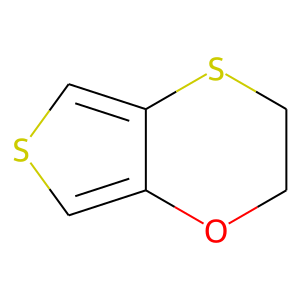

c1sc(c2c1OCCS2)

519


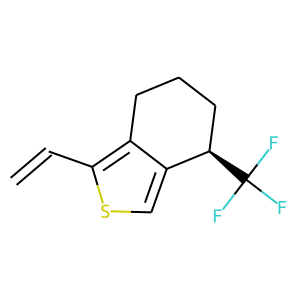

c1sc(c2c1[C@H](C(F)(F)F)CCC2)C=C

520


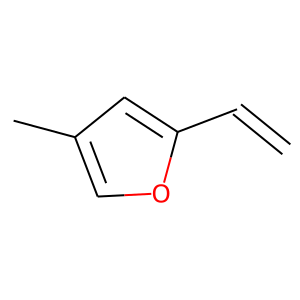

c1oc(cc1C)C=C

521


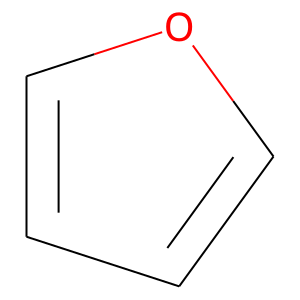

c1oc(cc1)

522


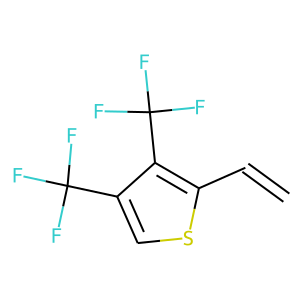

c1sc(c(c1C(F)(F)F)C(F)(F)F)C=C

523


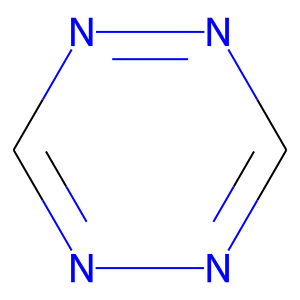

c1nnc(nn1)

524


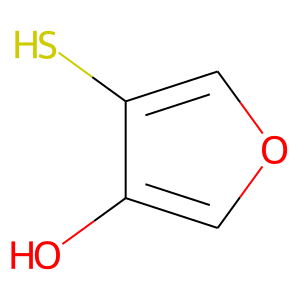

c1oc(c(c1O)S)

525


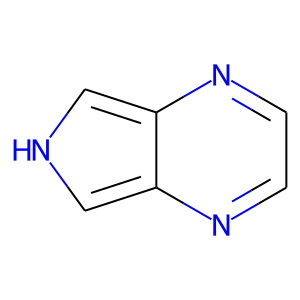

c1[nH]c(c2c1nccn2)

526


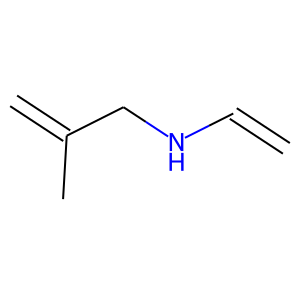

C=C(C)CNC=C

527


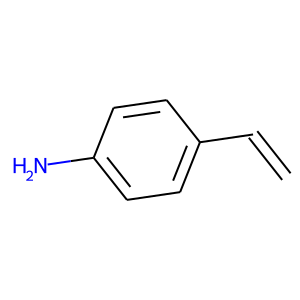

c1c(N)ccc(c1)C=C

528


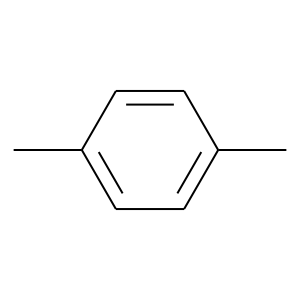

c1c(C)cc(c(c1)C)

529


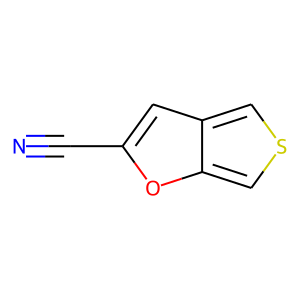

c1sc(c2c1oc(C#N)c2)

530


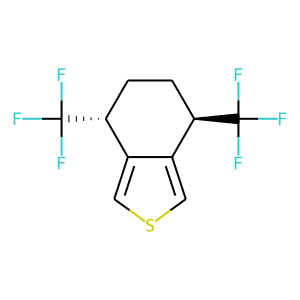

c1sc(c2c1[C@H](C(F)(F)F)CC[C@H]2C(F)(F)F)

531


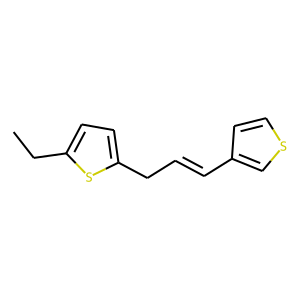

c1sccc1/C=C(/Cc1sc(CC)cc1)

532


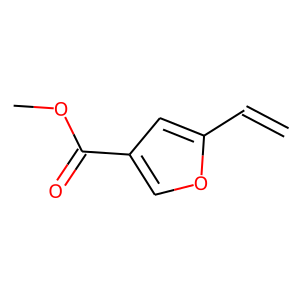

c1oc(cc1C(=O)OC)C=C

533


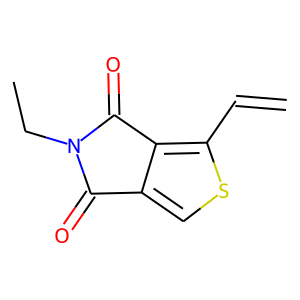

c(s1)c2c(=O)N(CC)c(=O)c2c1C=C

534


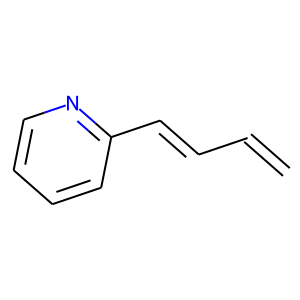

c1cnc(cc1)C=CC=C

535


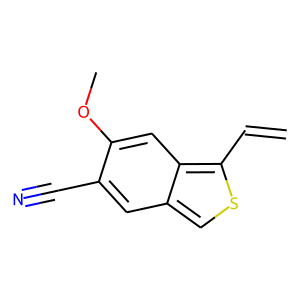

c1sc(c2c1cc(C#N)c(OC)c2)C=C

536


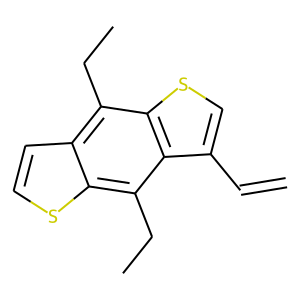

c1c(c2c(s1)c(CC)c1c(c2CC)scc1)C=C

537


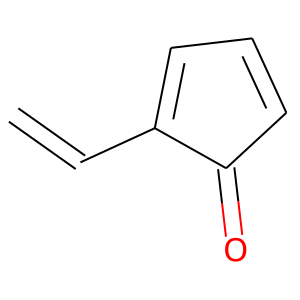

C1=CC=C(C1=O)C=C

538


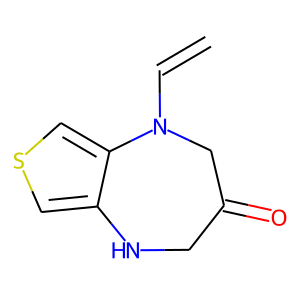

N1c2cscc2N(CC(=O)C1)C=C

539


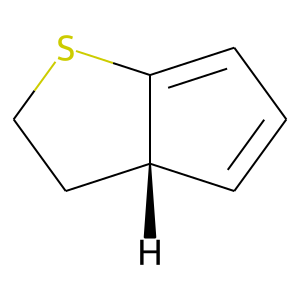

C1=CC(=C2[C@H]1CCS2)

540


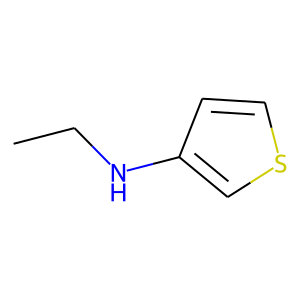

c1sccc1N(CC)

541


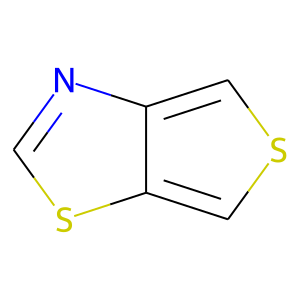

c1sc(c2c1scn2)

542


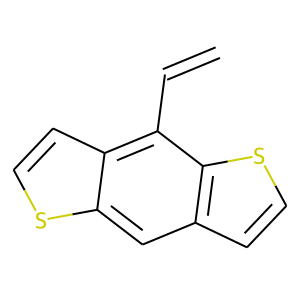

c1csc2c1cc1c(ccs1)c2C=C

543


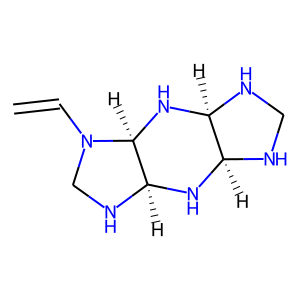

N1CN[C@@H]2N[C@H]3[C@@H](N[C@H]12)NCN3C=C

544


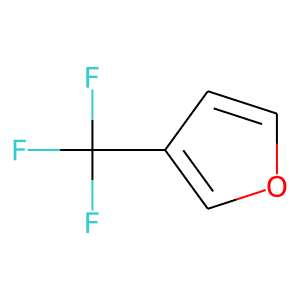

c1oc(cc1C(F)(F)F)

545


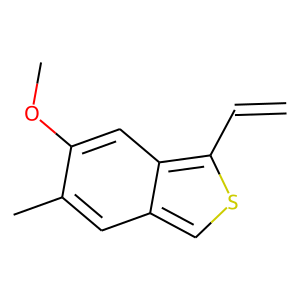

c1sc(c2c1cc(C)c(OC)c2)C=C

546


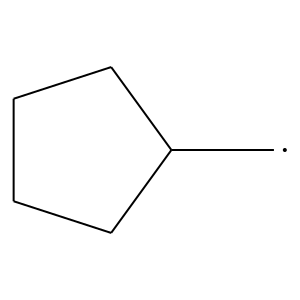

C1C([CH2])CCC1

547


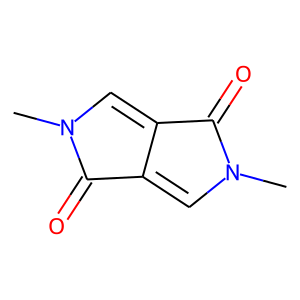

c1n(C)c(=O)c2c1c(=O)n(C)c2

548


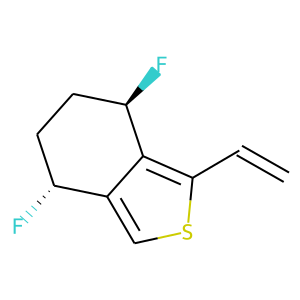

c1sc(c2c1[C@H](F)CC[C@H]2F)C=C

549


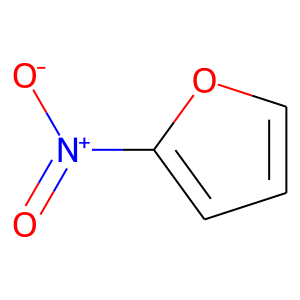

c1coc(N(=O)=O)c1

550


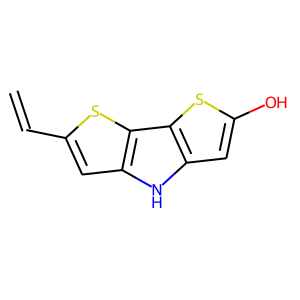

c1c(O)sc2c1[nH]c1c2sc(c1)C=C

551


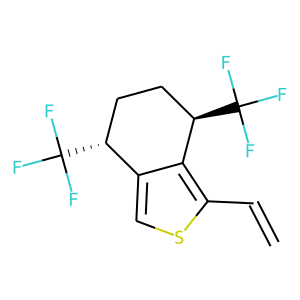

c1sc(c2c1[C@H](C(F)(F)F)CC[C@H]2C(F)(F)F)C=C

552


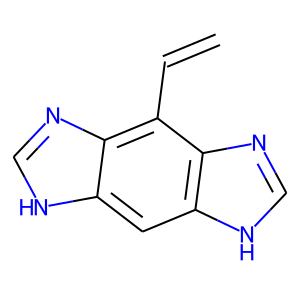

c1c2[nH]cnc2c(c2c1[nH]cn2)C=C

553


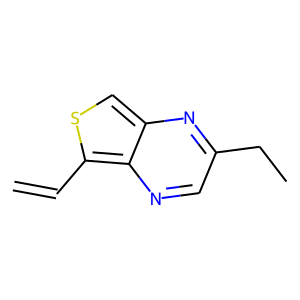

c1c2c(ncc(CC)n2)c(s1)C=C

554


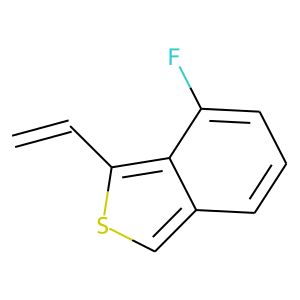

c1sc(c2c1cccc2F)C=C

555


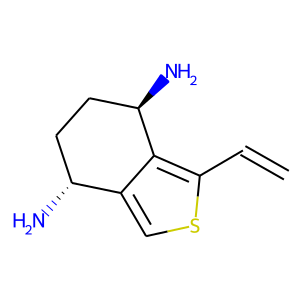

c1sc(c2c1[C@H](N)CC[C@H]2N)C=C

556


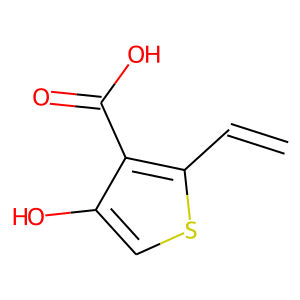

c1sc(c(c1O)C(=O)O)C=C

557


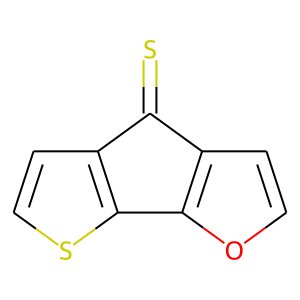

c1sc2c(c1)C(=S)c1c2oc(c1)

558


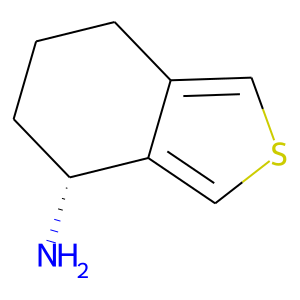

c1scc2c1[C@@H](CCC2)N

559


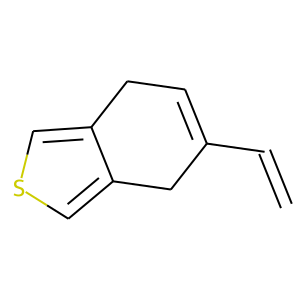

C1=C(Cc2cscc2C1)C=C

560


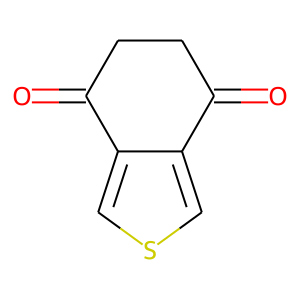

c1sc(c2c1C(=O)CCC2=O)

561


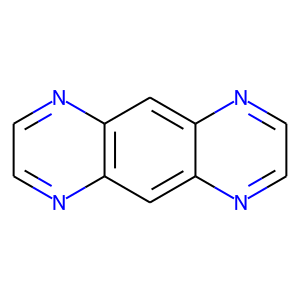

c1c2c(nccn2)c(c2c1nccn2)

562


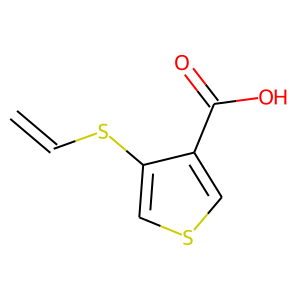

c1scc(C(=O)O)c1SC=C

563


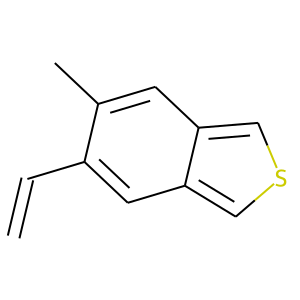

c1sc(c2c1cc(C=C)c(C)c2)

564


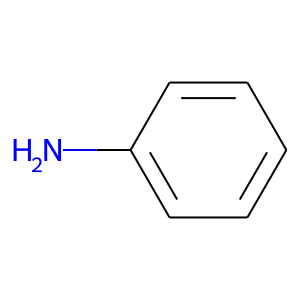

c1c(N)ccc(c1)

565


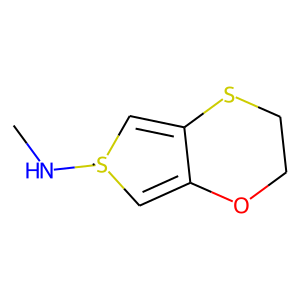

C1=C2OCCSC2=C([S@@]1NC)

566


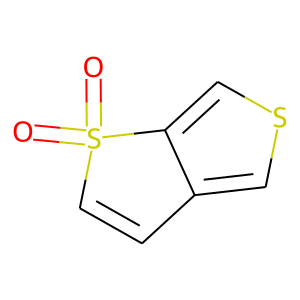

c1scc2c1C=C(S2(=O)=O)

567


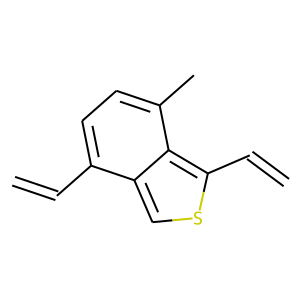

c1sc(c2c1c(C=C)ccc2C)C=C

568


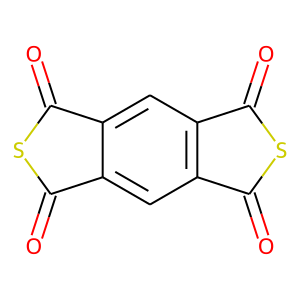

c1c2c(=O)sc(=O)c2c(c2c1c(=O)sc2=O)

569


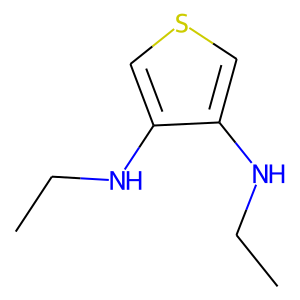

N(CC)c1cscc1N(CC)

570


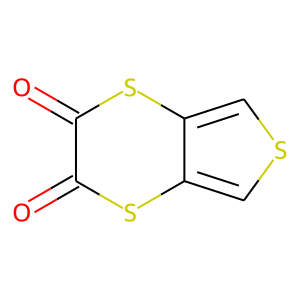

c1sc(c2c1sc(=O)c(=O)s2)

571


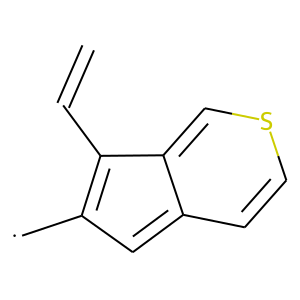

c1c([CH2])c(c2c1ccsc2)C=C

572


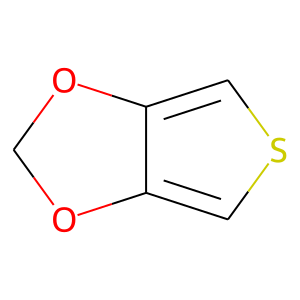

c1sc(c2c1OCO2)

573


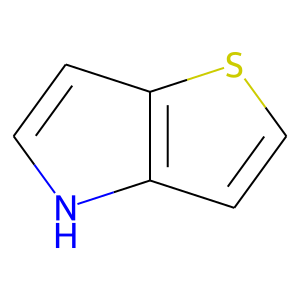

c1sc2c(c1)[nH]c(c2)

574


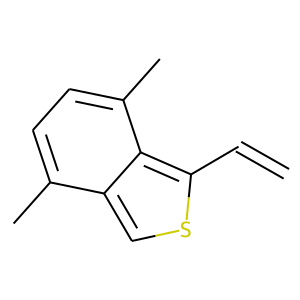

c1sc(c2c1c(C)ccc2C)C=C

575


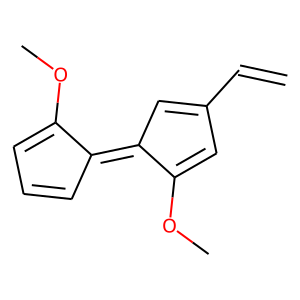

C1=C/C(/C(=C1)OC)=C\1/C=C(C=C1OC)C=C

576


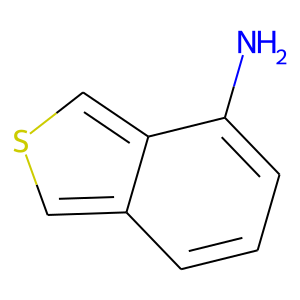

c1c2cscc2c(N)c(c1)

577


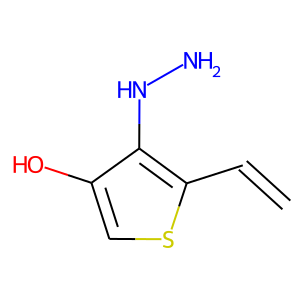

c(s1)c(O)c(NN)c1C=C

578


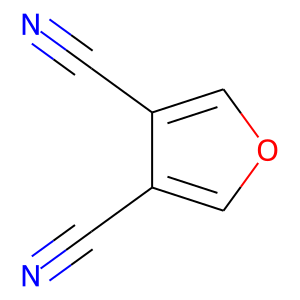

c1oc(c(c1C#N)C#N)

579


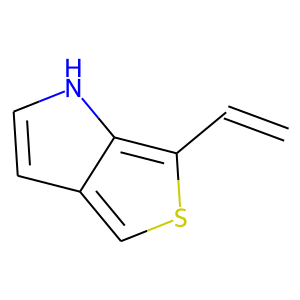

c1sc(c2c1cc[nH]2)C=C

580


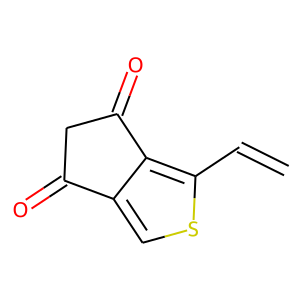

c1sc(c2c1C(=O)CC2=O)C=C

581


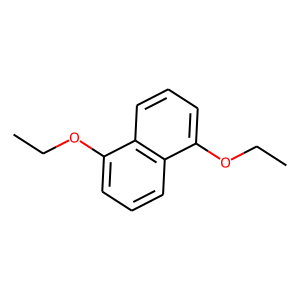

c1ccc(OCC)c2c1c(OCC)ccc2

582


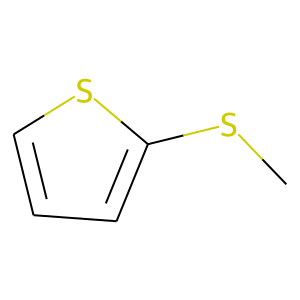

c1cc(SC)sc1

583


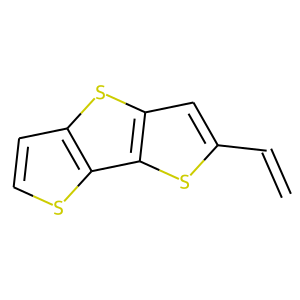

c1sc2c(c1)sc1cc(sc21)C=C

584


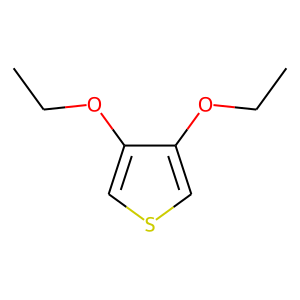

c1sc(c(c1OCC)OCC)

585


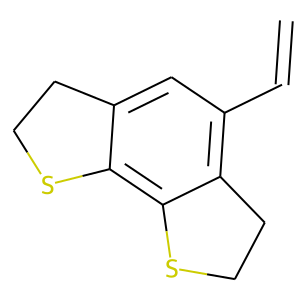

c1c2c(SCC2)c2c(CCS2)c1C=C

586


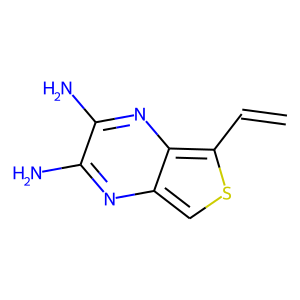

c1sc(c2c1nc(N)c(N)n2)C=C

587


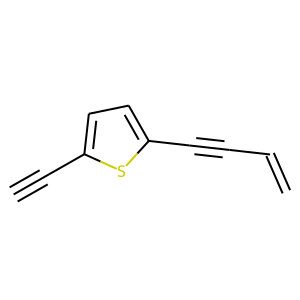

C#Cc1sc(cc1)C#CC=C

588


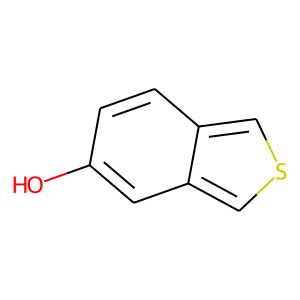

c1scc2c1c(c(cc2)O)

589


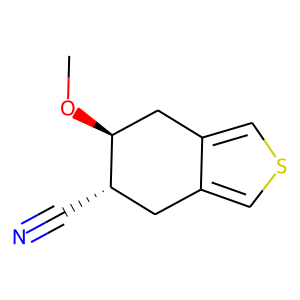

c1sc(c2c1C[C@H](C#N)[C@@H](OC)C2)

590


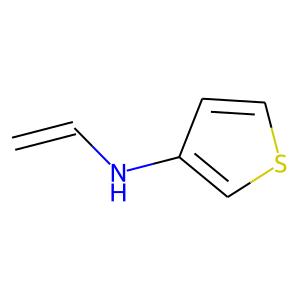

c1sccc1NC=C

591


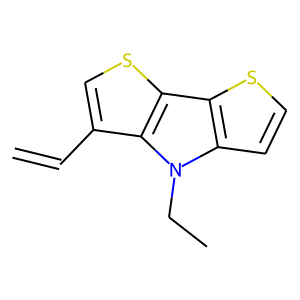

c1csc2c1n(CC)c1c2scc1C=C

592


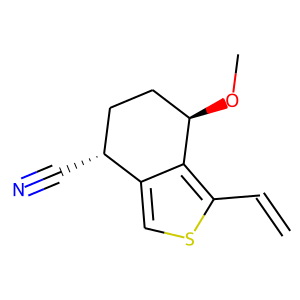

c1sc(c2c1[C@H](C#N)CC[C@H]2OC)C=C

593


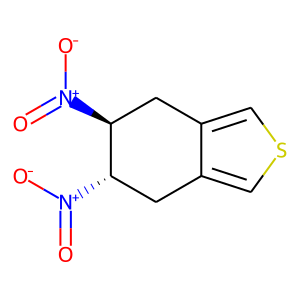

c1sc(c2c1C[C@H](N(=O)=O)[C@@H](N(=O)=O)C2)

594


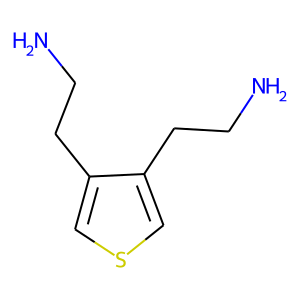

c(s1)c(CCN)c(CCN)c1

595


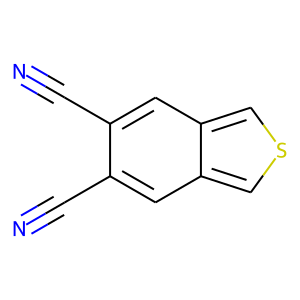

c1sc(c2c1cc(C#N)c(C#N)c2)

596


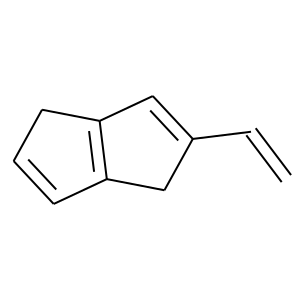

C1=CC2=C(C1)C=C(C2)C=C

597


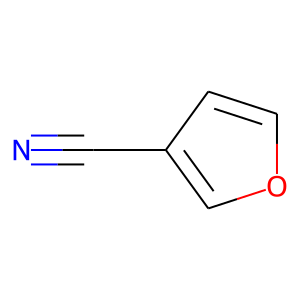

c1oc(cc1C#N)

598


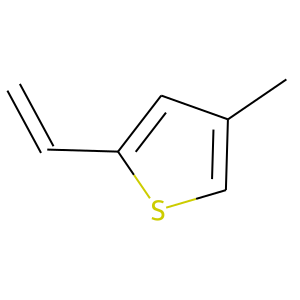

c1c(C)cc(s1)C=C

599


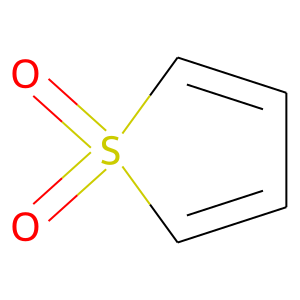

C1=CC=C(S1(=O)=O)

600


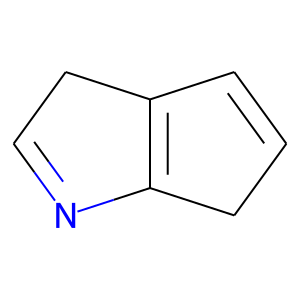

C1=CC2=C(C1)N=C(C2)

601


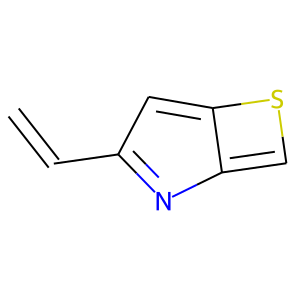

c1c(nc2cSc12)C=C

602


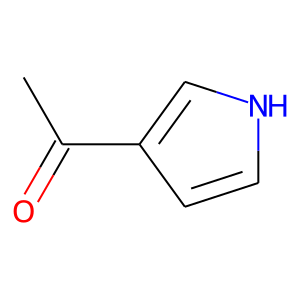

c1[nH]c(c(c1)C(=O)C)

603


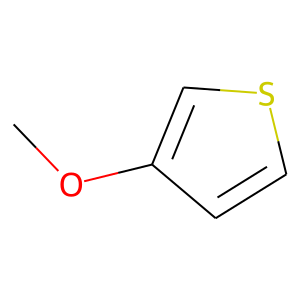

c1sc(c(c1)OC)

604


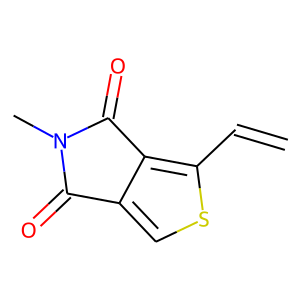

c(s1)c2c(=O)n(C)c(=O)c2c1C=C

605


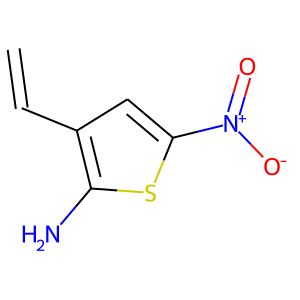

Nc1sc(N(=O)=O)cc1C=C

606


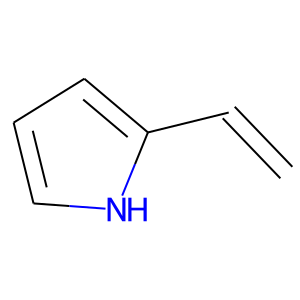

c1[nH]c(cc1)C=C

607


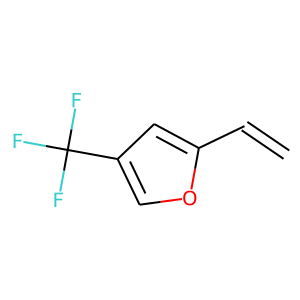

c1oc(cc1C(F)(F)F)C=C

608


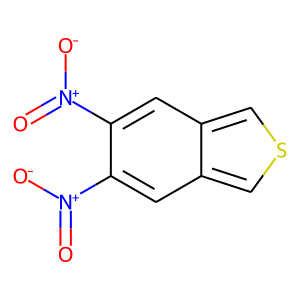

c1sc(c2c1cc(N(=O)=O)c(N(=O)=O)c2)

609


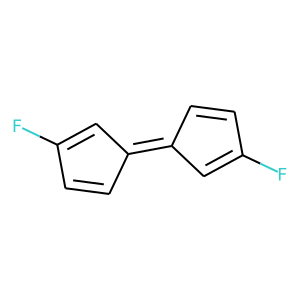

C1=C(F)C=C/C/1=C\1/C(=CC(=C1)F)

610


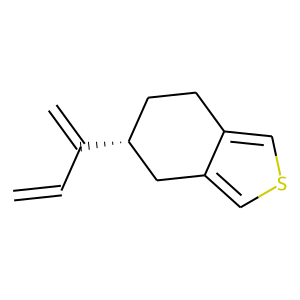

c1scc2c1C[C@@H](CC2)C(=C)C=C

611


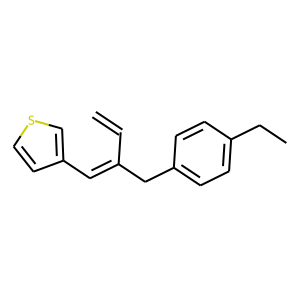

c1sccc1/C=C(/Cc1ccc(CC)cc1)C=C

612


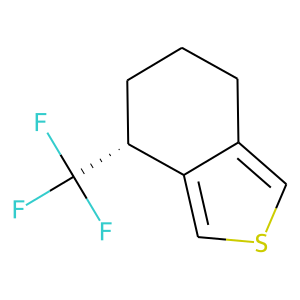

c1sc(c2c1[C@H](C(F)(F)F)CCC2)

613


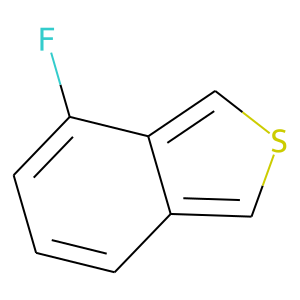

c1sc(c2c1cccc2F)

614


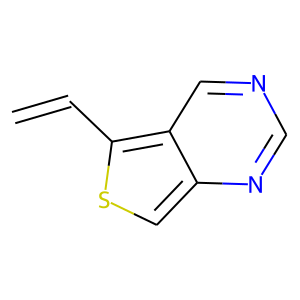

c1sc(c2c1ncnc2)C=C

615


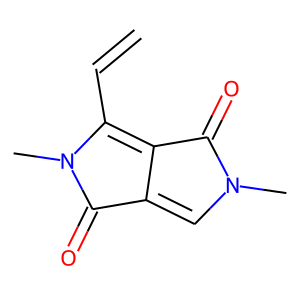

c1n(C)c(=O)c2c1c(=O)n(C)c2C=C

616


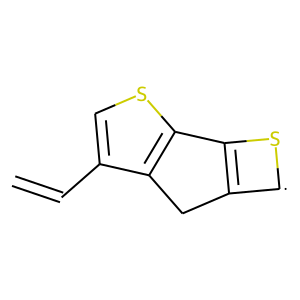

c1sc2C3=C([CH]S3)Cc2c1C=C

617


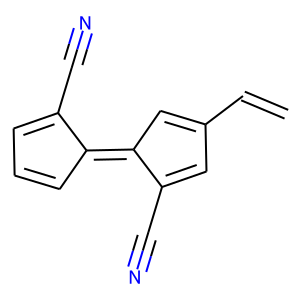

C1=C/C(/C(=C1)C#N)=C\1/C=C(C=C1C#N)C=C

618


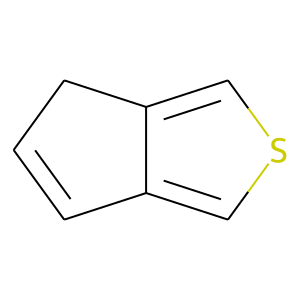

c1scc2c1C=C(C2)

619


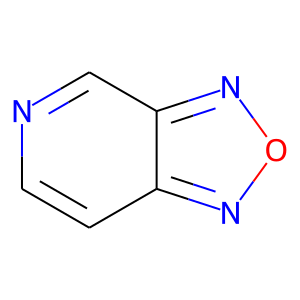

c1c(ncc2c1non2)

620


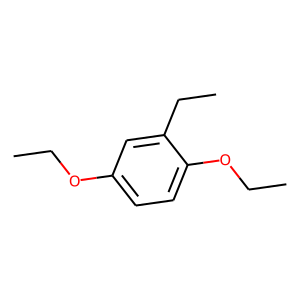

c1c(OCC)cc(CC)c(OCC)c1

621


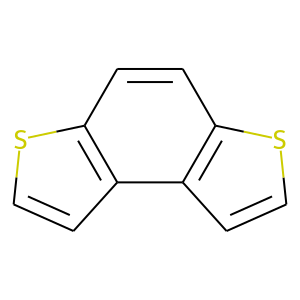

c1sc2c(c1)c1c(scc1)c(c2)

622


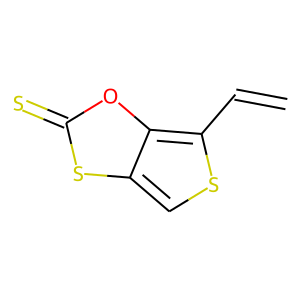

c1sc(c2c1sc(=S)o2)C=C

623


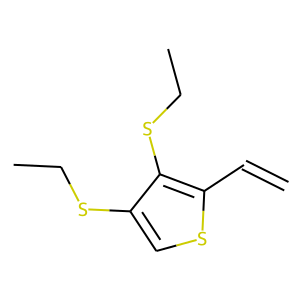

c1sc(c(c1SCC)SCC)C=C

624


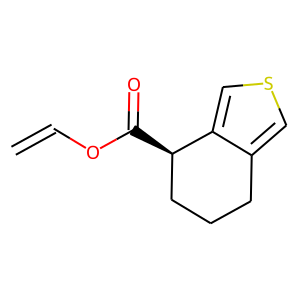

c1scc2c1CCC[C@H]2C(=O)OC=C

625


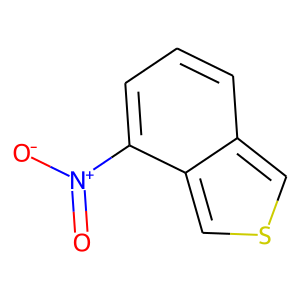

c1sc(c2c1c(N(=O)=O)ccc2)

626


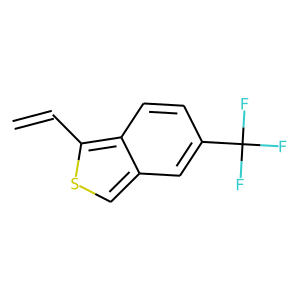

c1sc(c2c1cc(C(F)(F)F)cc2)C=C

627


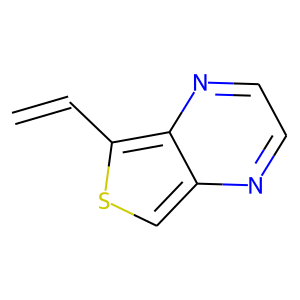

c1c2nccnc2c(s1)C=C

628


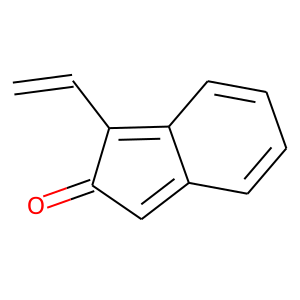

c1c2ccccc2c(c1=O)C=C

629


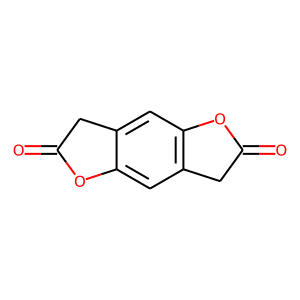

C1C(=O)Oc2c1cc1c(c2)C(C(=O)O1)

630


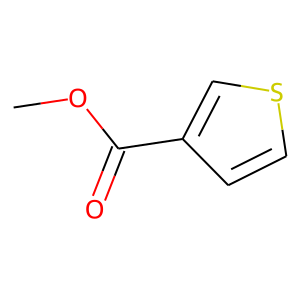

c1scc(C(=O)OC)c1

631


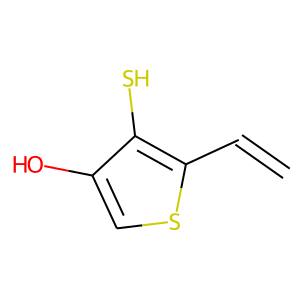

c1sc(c(c1O)S)C=C

632


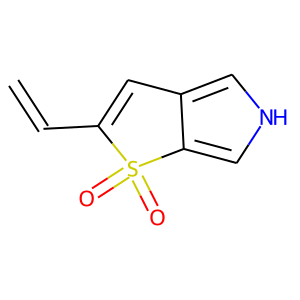

c1[nH]cc2c1S(=O)(=O)C(=C2)C=C

633


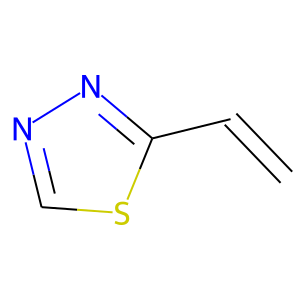

c1sc(nn1)C=C

634


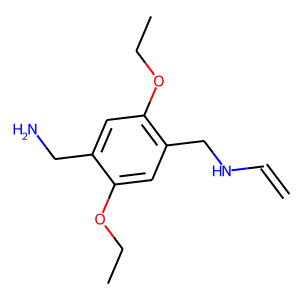

NCc1cc(OCC)c(cc1OCC)CNC=C

635


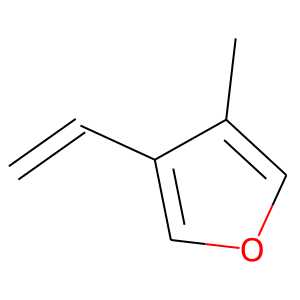

c1occ(C)c1C=C

636


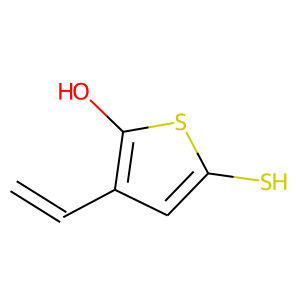

c1c(S)sc(O)c1C=C

637


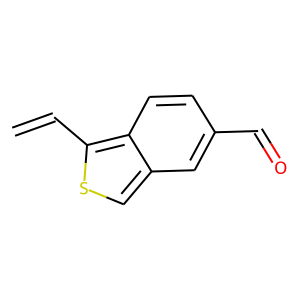

c1sc(c2c1cc(C=O)cc2)C=C

638


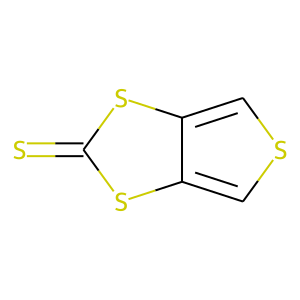

c1sc(c2c1sc(=S)s2)

639


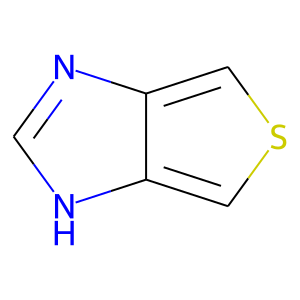

c1sc(c2c1[nH]cn2)

640


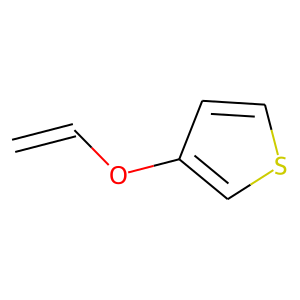

c1sccc1OC=C

641


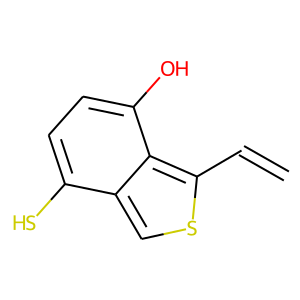

c1sc(c2c1c(S)ccc2O)C=C

642


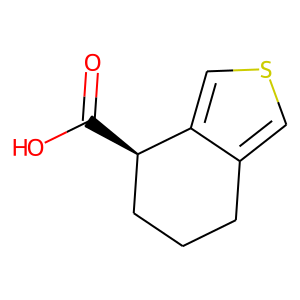

c1scc2c1CCC[C@H]2C(=O)O

643


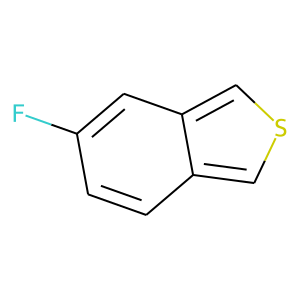

c1sc(c2c1ccc(F)c2)

644


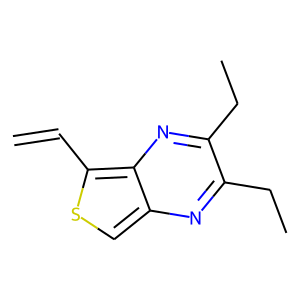

c1c2nc(CC)c(CC)nc2c(s1)C=C

645


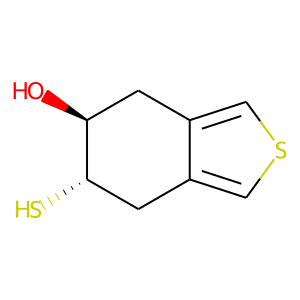

c1sc(c2c1C[C@H](S)[C@@H](O)C2)

646


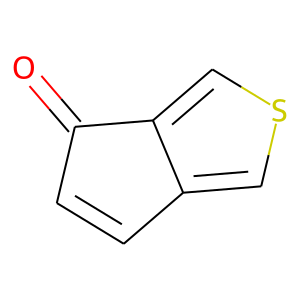

c1scc2c1C=C(C2=O)

647


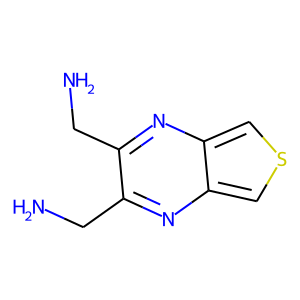

c1sc(c2c1nc(CN)c(CN)n2)

648


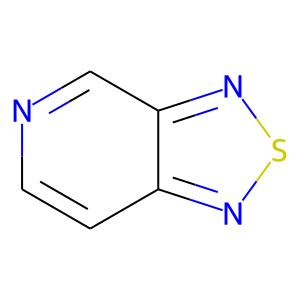

c1cnc(c2c1nsn2)

649


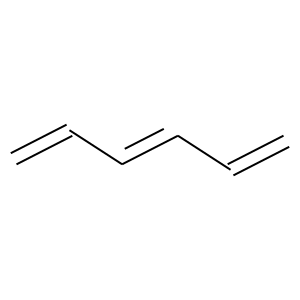

C=CC=CC=C

650


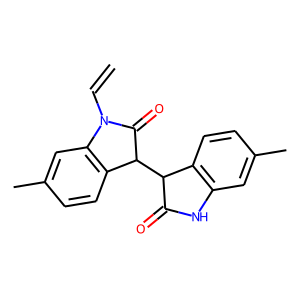

N1C(=O)C(c2c1cc(cc2)C)C1C(=O)N(c2c1ccc(C)c2)C=C

651


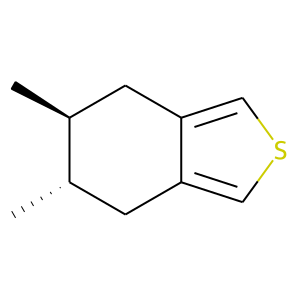

c1sc(c2c1C[C@H](C)[C@@H](C)C2)

652


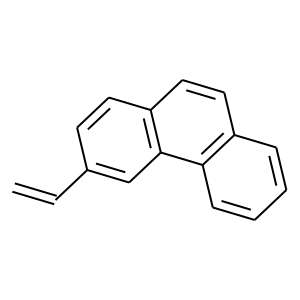

c1cc(cc2c1ccc1c2cccc1)C=C

653


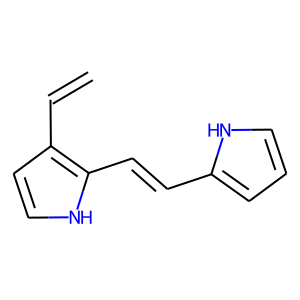

c1[nH]c(/C=C/c2[nH]ccc2)c(c1)C=C

654


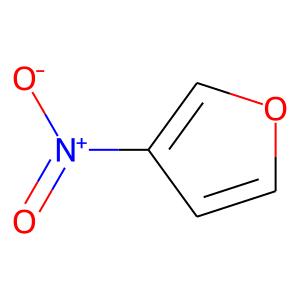

c1oc(c(c1)N(=O)=O)

655


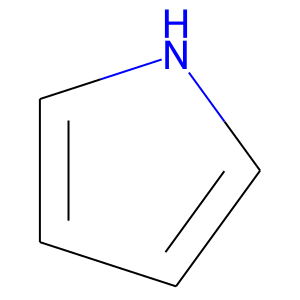

c1[nH]c(cc1)

656


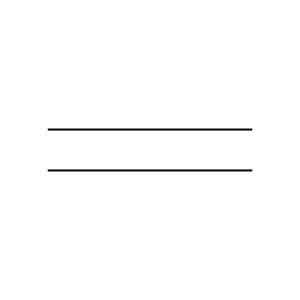

C=C

657


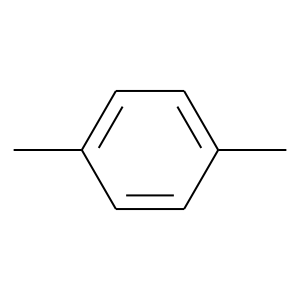

c1cc(C)cc(c1C)

658


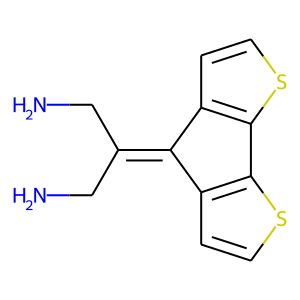

c(s1)cc(c(=C(CN)(CN))2)c1c(s3)c2cc3

659


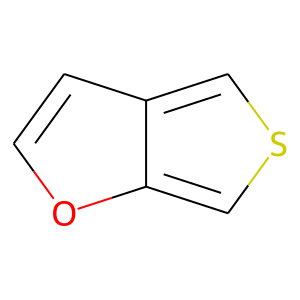

c1sc(c2c1occ2)

660


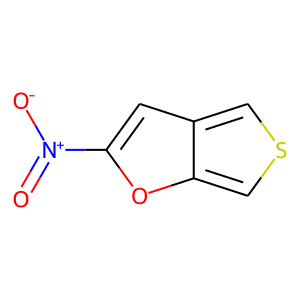

c1sc(c2c1oc(N(=O)=O)c2)

661


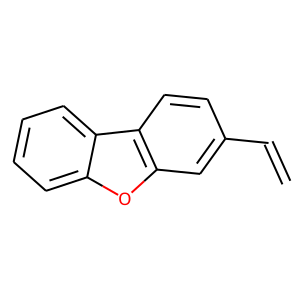

c1ccc2c(c1)oc1c2ccc(c1)C=C

662


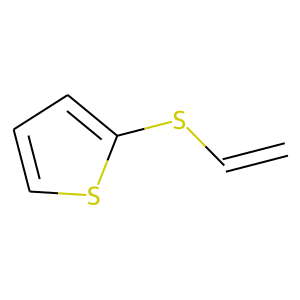

c1sc(cc1)SC=C

663


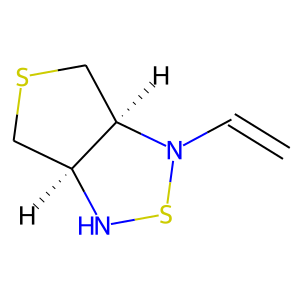

N1[C@H]2CSC[C@H]2N(S1)C=C

664


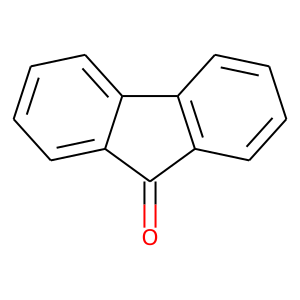

c1ccc2c(c1)C(=O)c1c2ccc(c1)

665


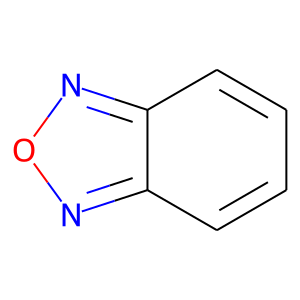

c1c2nonc2c(cc1)

666


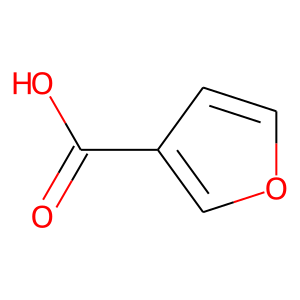

c1oc(cc1C(=O)O)

667


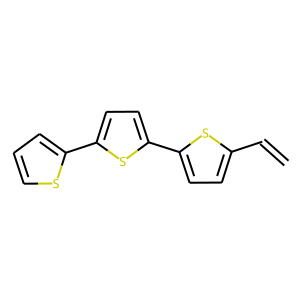

c1sc(cc1)c1ccc(s1)c1sc(cc1)C=C

668


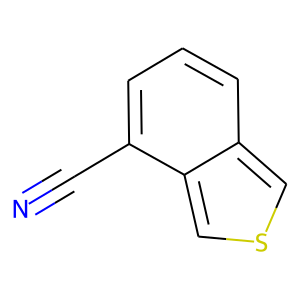

c1sc(c2c1c(C#N)ccc2)

669


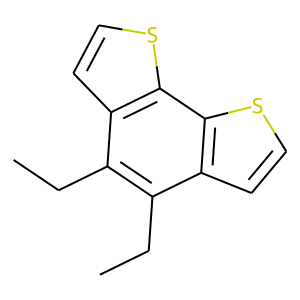

c(s1)cc(c(CC)c(CC)2)c1c(s3)c2cc3

670


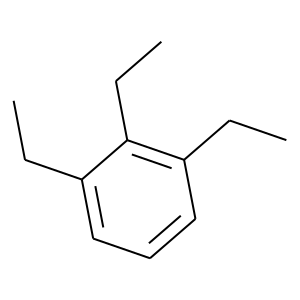

c1c(CC)c(CC)c(CC)cc1

671


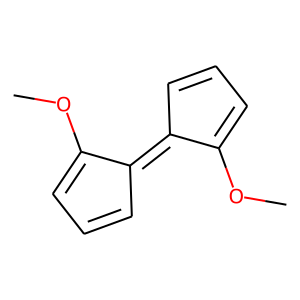

C1=C/C(/C(=C1)OC)=C\1/C=C(C=C1OC)

672


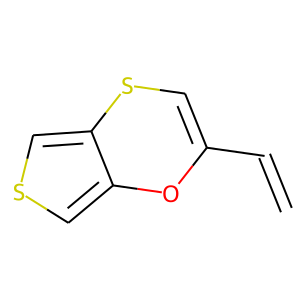

c1c(oc2cscc2s1)C=C

673


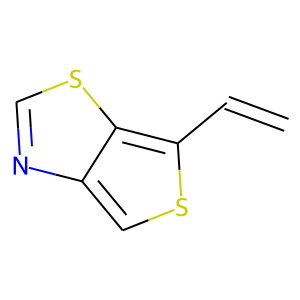

c1sc(c2c1ncs2)C=C

674


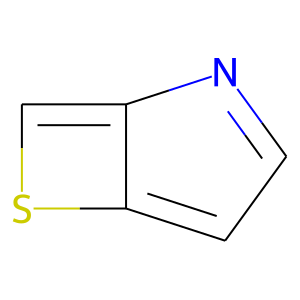

c1c(nc2cSc12)

675


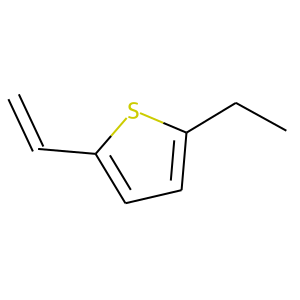

c1c(CC)sc(c1)C=C

676


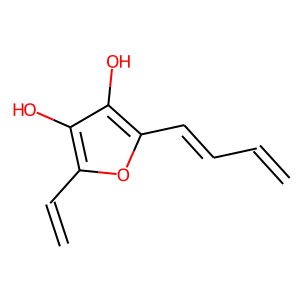

C=Cc1oc(c(c1O)O)C=CC=C

677


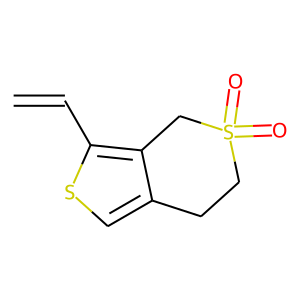

c1sc(c2c1CCS(=O)(=O)C2)C=C

678


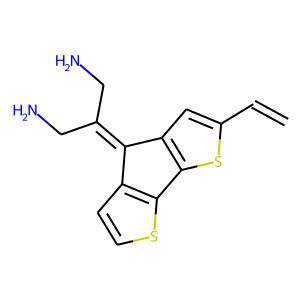

c(s1)cc(c(=C(CN)(CN))2)c1c(s3)c2cc3C=C

679


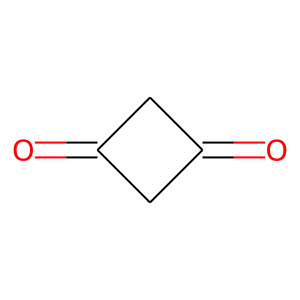

C(C(=O)1)C(=O)C1

680


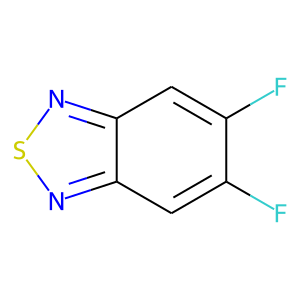

c1c(F)c(F)c(c2c1nsn2)

681


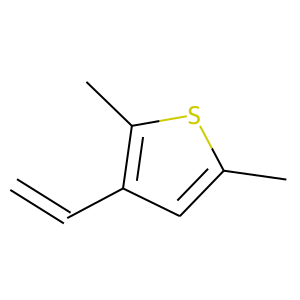

c1c(C)sc(C)c1C=C

682


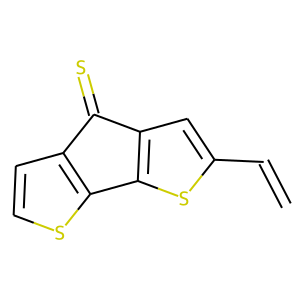

c(s1)cc(c(=S)2)c1c(s3)c2cc3C=C

683


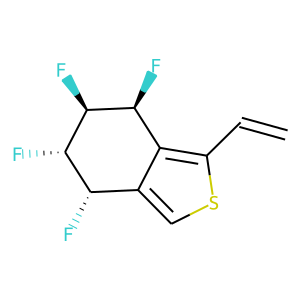

c1sc(c2c1[C@H](F)[C@H](F)[C@@H](F)[C@H]2F)C=C

684


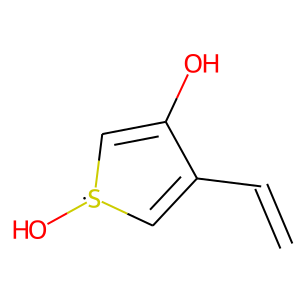

C1=C(C(=C[S@@]1O)O)C=C

685


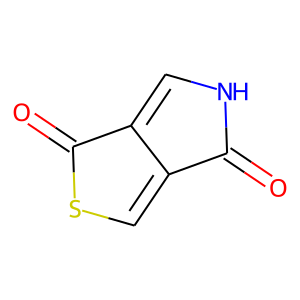

C1=C2C(C(=O)S1)=CN(C2=O)

686


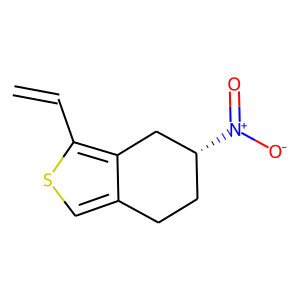

c1sc(c2c1CC[C@@H](N(=O)=O)C2)C=C

687


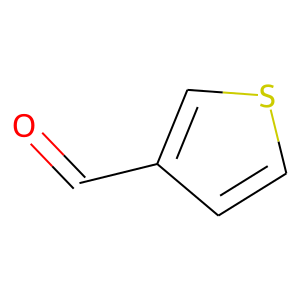

c1sc(c(c1)C=O)

688


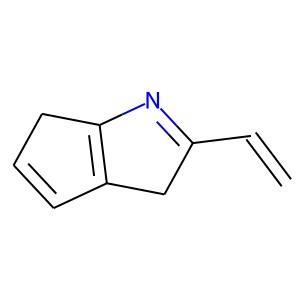

C1=CC2=C(C1)N=C(C2)C=C

689


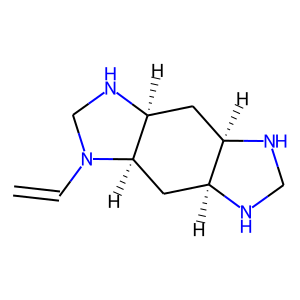

N1CN[C@@H]2C[C@H]3[C@@H](C[C@H]12)N(CN3)C=C

690


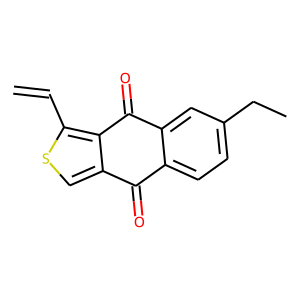

c1sc(c2c1C(=O)c1ccc(CC)cc1C2=O)C=C

691


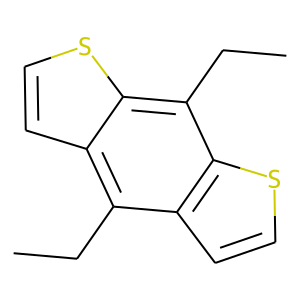

c1csc2c1c(CC)c1c(c2CC)scc1

692


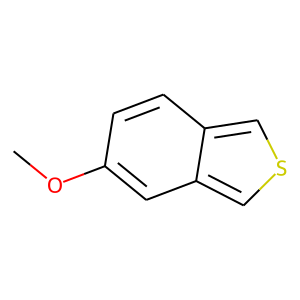

c1sc(c2c1cc(OC)cc2)

693


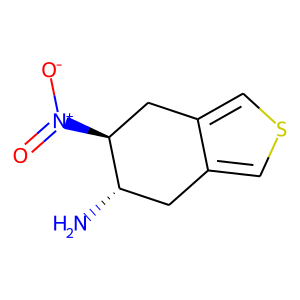

c1sc(c2c1C[C@H](N)[C@@H](N(=O)=O)C2)

694


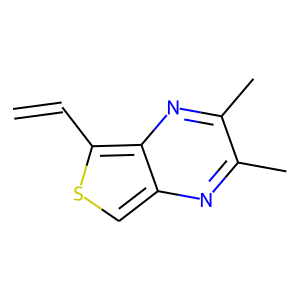

c1c2nc(C)c(C)nc2c(s1)C=C

695


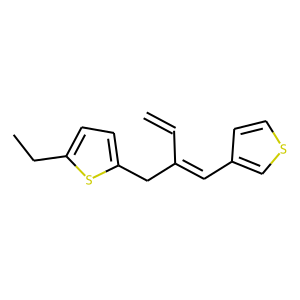

c1sccc1/C=C(/Cc1sc(CC)cc1)C=C

696


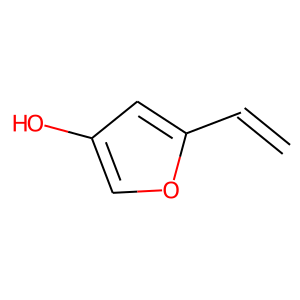

c1oc(cc1O)C=C

697


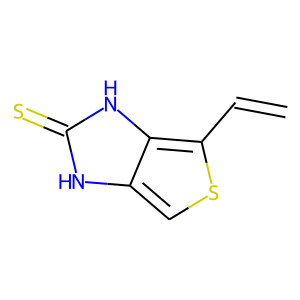

c1sc(c2c1[nH]c(=S)[nH]2)C=C

698


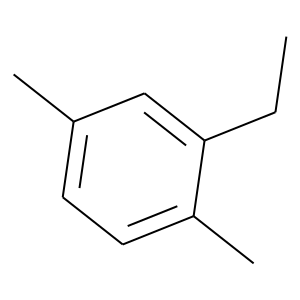

c1c(C)cc(CC)c(C)c1

699


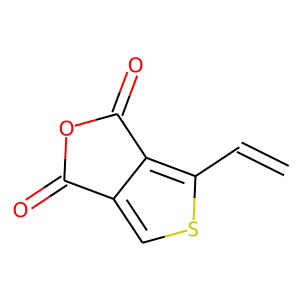

c1sc(c2c1C(=O)OC2=O)C=C

700


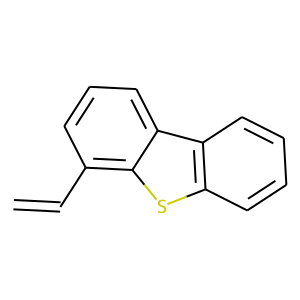

c1cc(c2c(c1)c1c(s2)cccc1)C=C

701


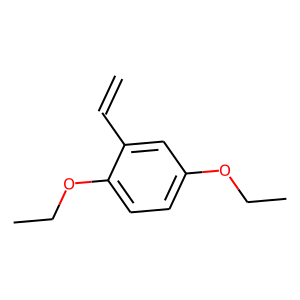

c1c(OCC)c(cc(c1)OCC)C=C

702


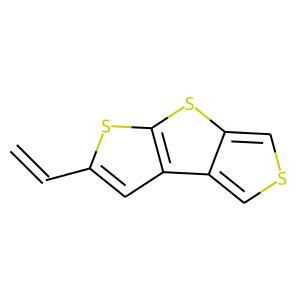

c1scc2c1c1c(s2)sc(c1)C=C

703


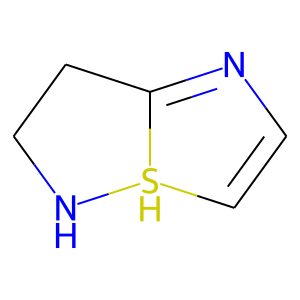

c1nc2CCNS2c1

704


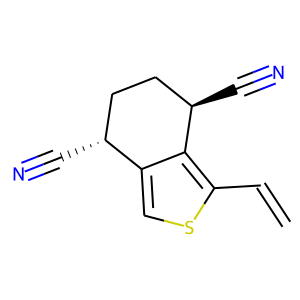

c1sc(c2c1[C@H](C#N)CC[C@H]2C#N)C=C

705


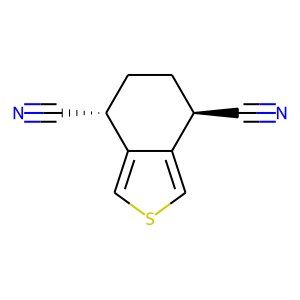

c1sc(c2c1[C@H](C#N)CC[C@H]2C#N)

706


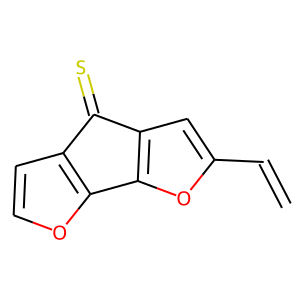

c1oc2c(c1)C(=S)c1c2oc(c1)C=C

707


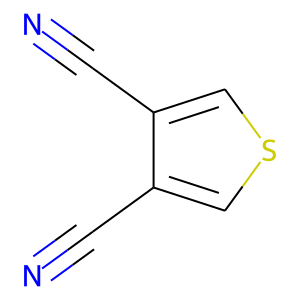

c1sc(c(c1C#N)C#N)

708


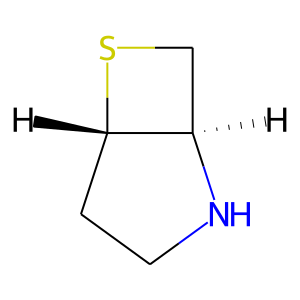

C1S[C@@H]2[C@@H]1NCC2

709


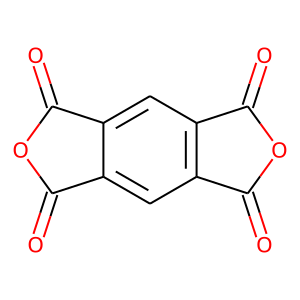

c1c2c(=O)oc(=O)c2c(c2c1c(=O)oc2=O)

710


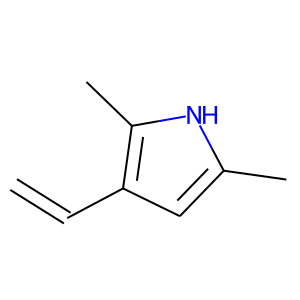

c1c(C)Nc(C)c1C=C

711


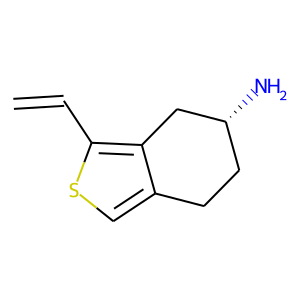

c1sc(c2c1CC[C@@H](N)C2)C=C

712


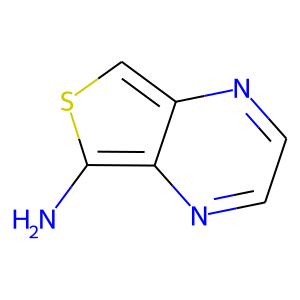

Nc1sc(c2c1nccn2)

713


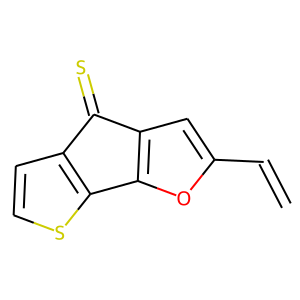

c1sc2c(c1)C(=S)c1c2oc(c1)C=C

714


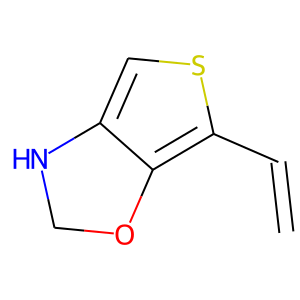

c1c2c(OCN2)c(s1)C=C

715


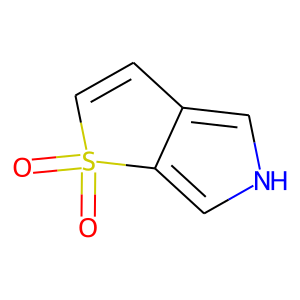

c1[nH]cc2c1S(=O)(=O)C(=C2)

716


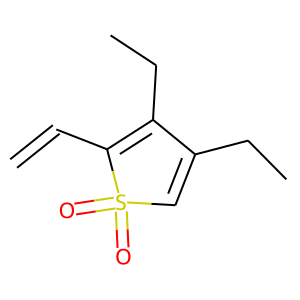

C1=C(CC)C(CC)=C(S1(=O)=O)C=C

717


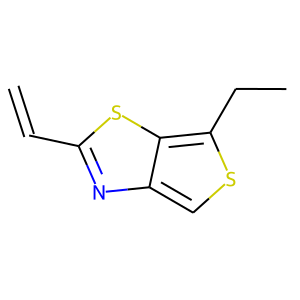

c1sc(CC)c2c1nc(s2)C=C

718


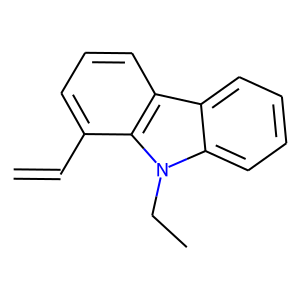

c1c2n(CC)c3c(c2ccc1)cccc3C=C

719


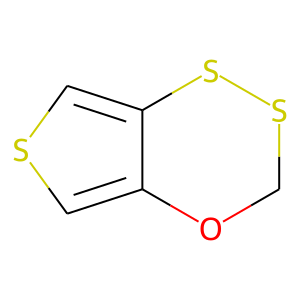

c1sc(c2c1OCSS2)

720


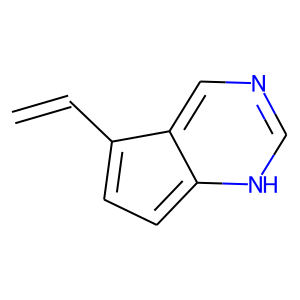

c1cc(c2c1[nH]cnc2)C=C

721


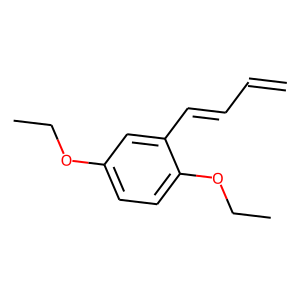

c1c(OCC)cc(c(c1)OCC)C=CC=C

722


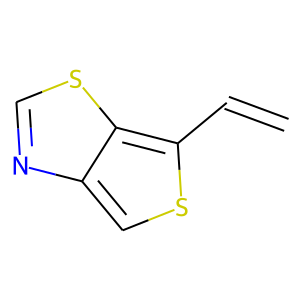

c(s1)c2ncsc2c1C=C

723


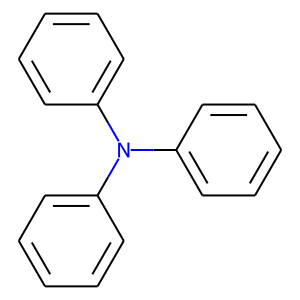

c1cc(c(cc1)N(c1ccccc1)c1ccccc1)

724


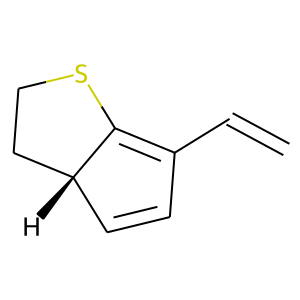

C1=CC(=C2[C@H]1CCS2)C=C

725


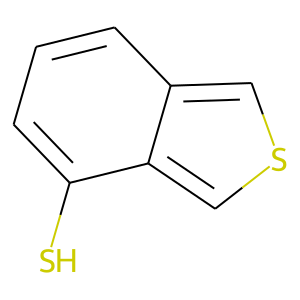

c1sc(c2c1c(S)ccc2)

726


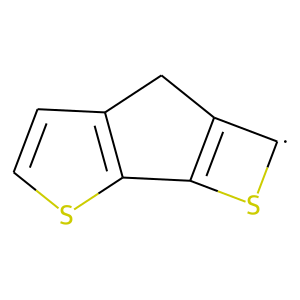

c1sc2C3=C([CH]S3)Cc2c1

727


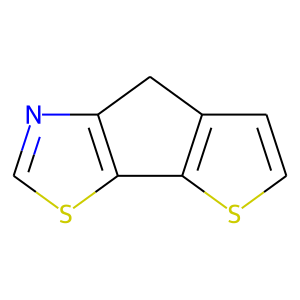

c1sc2c(n1)Cc1c2sc(c1)

728


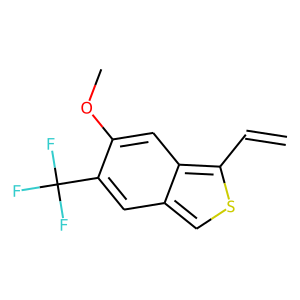

c1sc(c2c1cc(C(F)(F)F)c(OC)c2)C=C

729


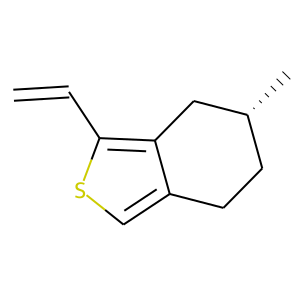

c1sc(c2c1CC[C@@H](C)C2)C=C

730


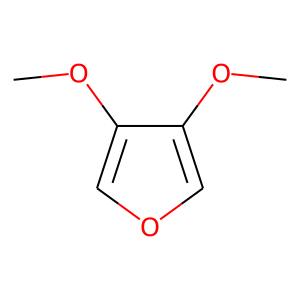

c1oc(c(c1OC)OC)

731


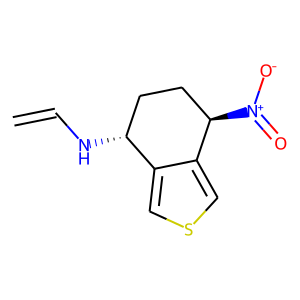

c1scc2c1[C@@H](CC[C@H]2N(=O)=O)NC=C

732


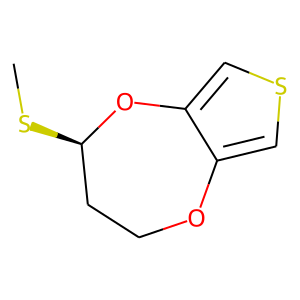

c1sc(c2c1OCC[C@@H](SC)O2)

733


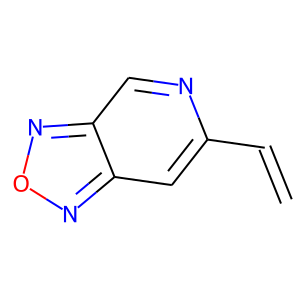

c1c(ncc2c1non2)C=C

734


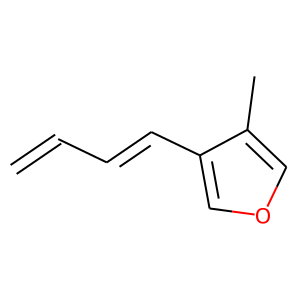

c1occ(C)c1C=CC=C

735


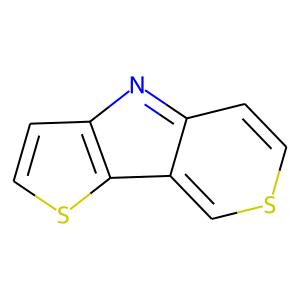

c1c2c(ccs1)nc1c2sc(c1)

736


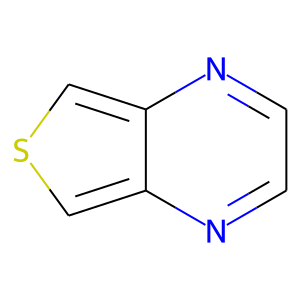

c1nc2cscc2nc1

737


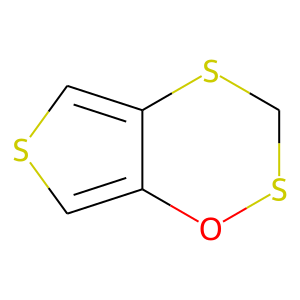

c1sc(c2c1OSCS2)

738


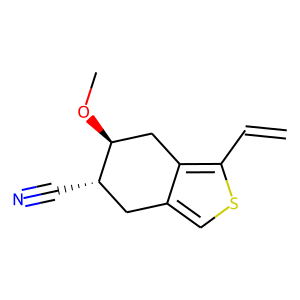

c1sc(c2c1C[C@H](C#N)[C@@H](OC)C2)C=C

739


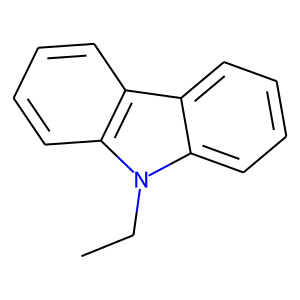

c1c2n(CC)c3c(c2ccc1)cccc3

740


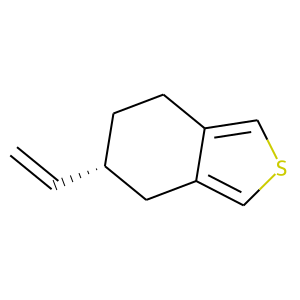

c1scc2c1C[C@@H](CC2)C(=C)

741


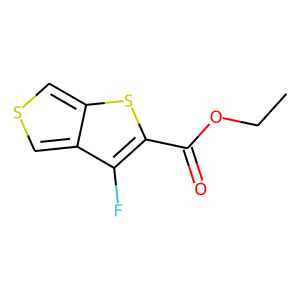

c1c2c(sc(C(=O)OCC)c2F)c(s1)

742


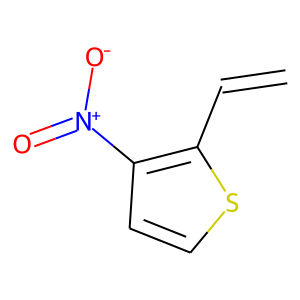

c1sc(c(c1)N(=O)=O)C=C

743


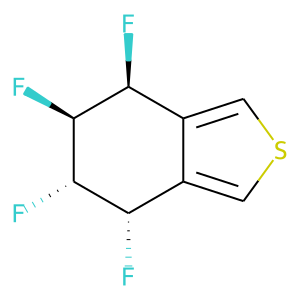

c1sc(c2c1[C@H](F)[C@H](F)[C@@H](F)[C@H]2F)

744


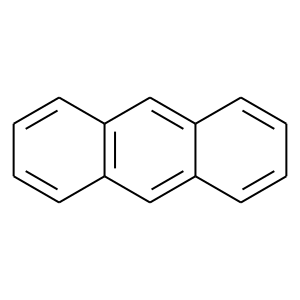

c1c2c(cccc2)cc2c1c(ccc2)

745


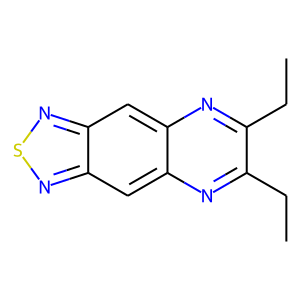

c1c2nsnc2c(c2c1nc(CC)c(CC)n2)

746


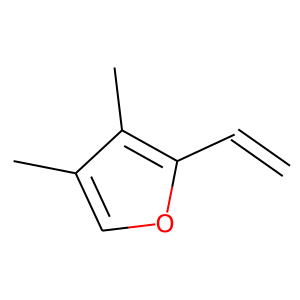

c1oc(c(c1C)C)C=C

747


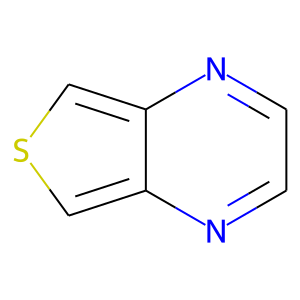

c1sc(c2c1nccn2)

748


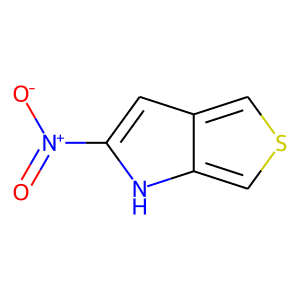

c1sc(c2c1[nH]c(N(=O)=O)c2)

749


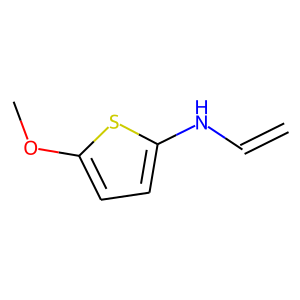

c1c(sc(OC)c1)NC=C

750


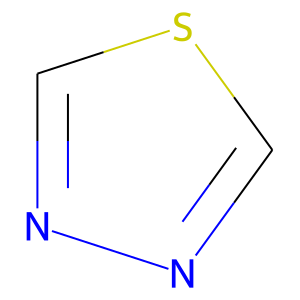

c1sc(nn1)

751


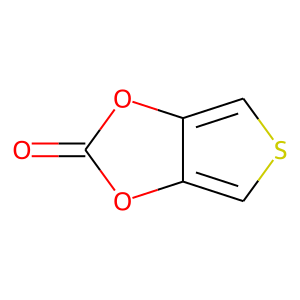

c1sc(c2c1oc(=O)o2)

752


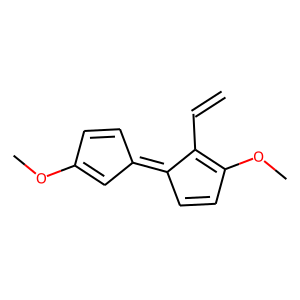

C1=CC(OC)=C(/C/1=C\1/C=C(OC)C=C1)C=C

753


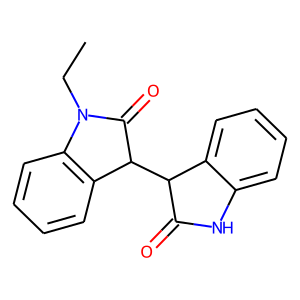

c1cc2c(cc1)C(C(=O)N2CC)C1C(=O)Nc2cc(ccc12)

754


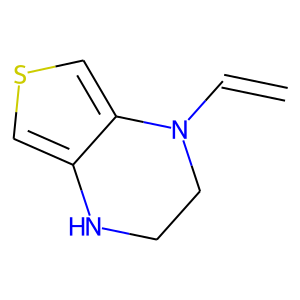

N1c2cscc2N(CC1)C=C

755


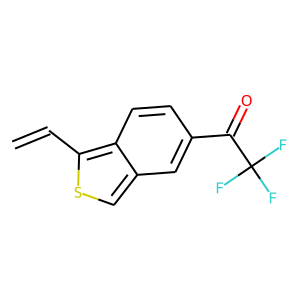

c1sc(c2c1cc(C(=O)C(F)(F)F)cc2)C=C

756


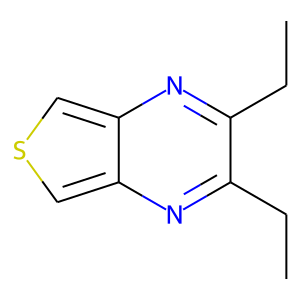

c1c2nc(CC)c(CC)nc2c(s1)

757


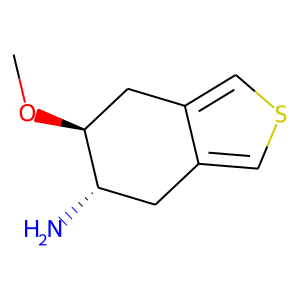

c1scc2c1C[C@@H]([C@@H](OC)C2)N

758


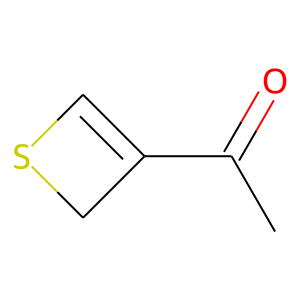

C1SC=C1C(=O)C

759


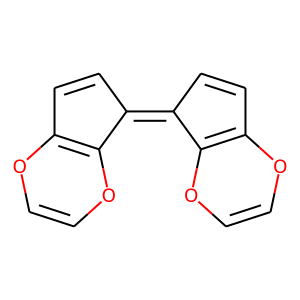

C1=CC2=C(OC=CO2)/C/1=C/1\C2=C(OC=CO2)C=C1

760


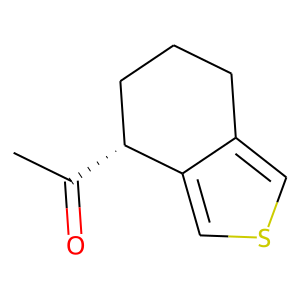

c1sc(c2c1[C@H](C(=O)C)CCC2)

761


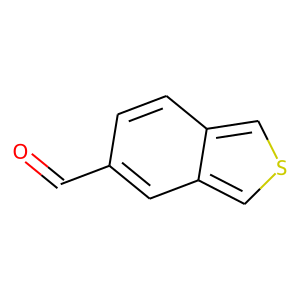

c1sc(c2c1cc(C=O)cc2)

762


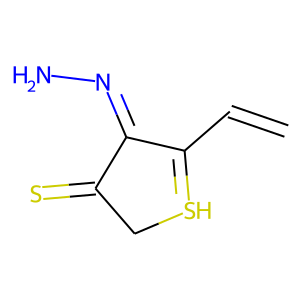

C1S=C(/C(=N/N)/C1=S)C=C

763


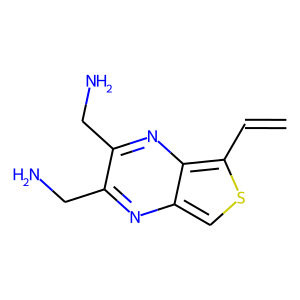

c1sc(c2c1nc(CN)c(CN)n2)C=C

764


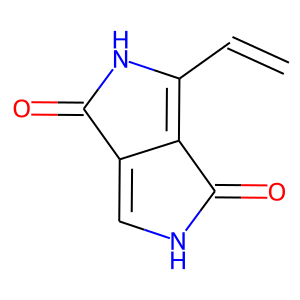

c1[nH]c(=O)c2c1c(=O)[nH]c2C=C

765


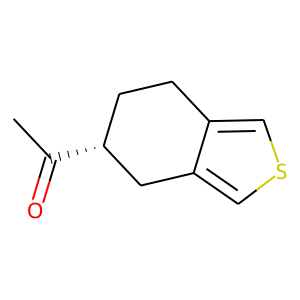

c1sc(c2c1C[C@H](C(=O)C)CC2)

766


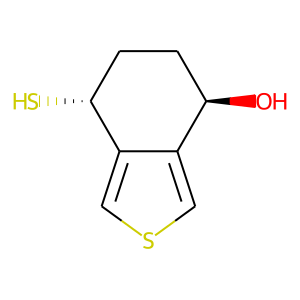

c1sc(c2c1[C@H](S)CC[C@H]2O)

767


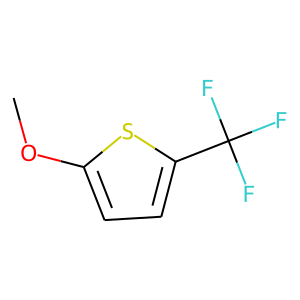

c1c(C(F)(F)F)sc(OC)c1

768


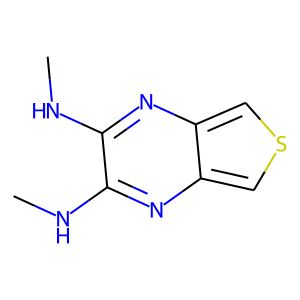

c1scc2c1nc(c(NC)n2)N(C)

769


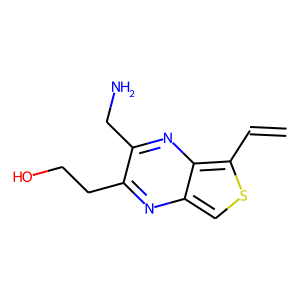

c1sc(c2c1nc(CCO)c(CN)n2)C=C

770


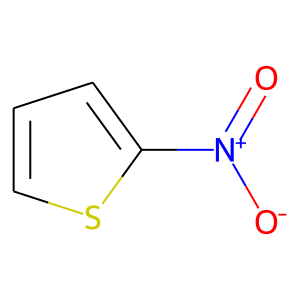

c1sc(N(=O)=O)cc1

771


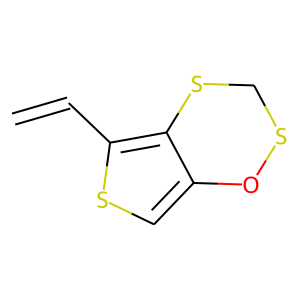

c1sc(c2c1OSCS2)C=C

772


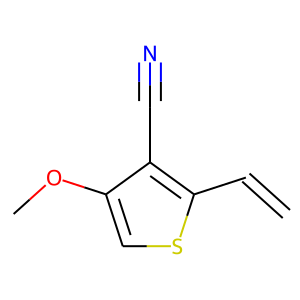

c1sc(c(c1OC)C#N)C=C

773


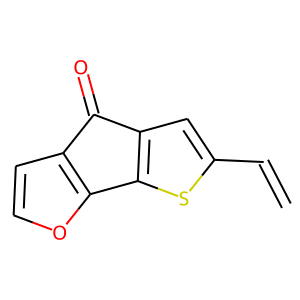

c1oc2c(c1)C(=O)c1c2sc(c1)C=C

774


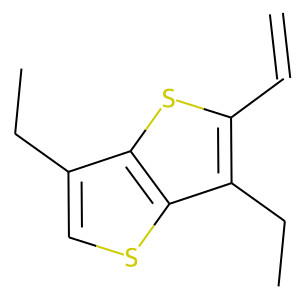

c1sc2c(c1CC)sc(c2CC)C=C

775


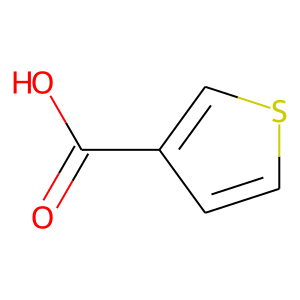

c1cscc1C(=O)O

776


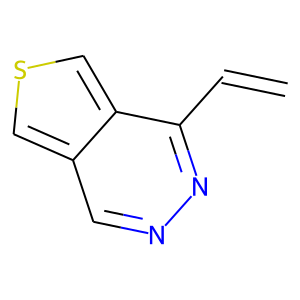

c1c2cscc2c(nn1)C=C

777


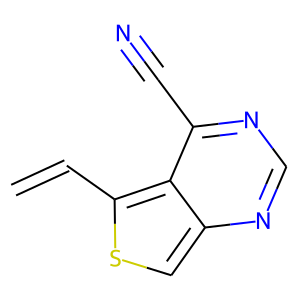

c1sc(c2c1ncnc2C#N)C=C

778


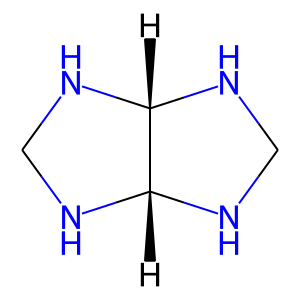

N1CN[C@@H]2[C@H]1N(CN2)

779


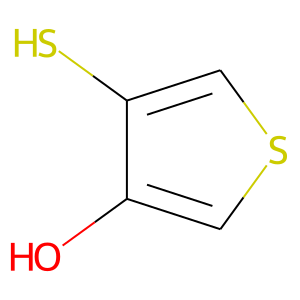

c1sc(c(c1O)S)

780


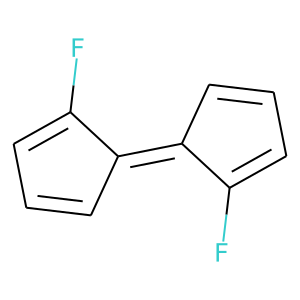

C1=C/C(/C(=C1)F)=C\1/C=C(C=C1F)

781


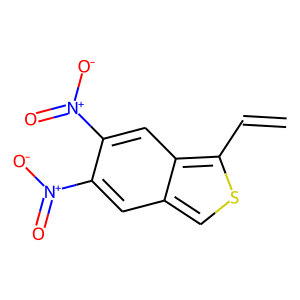

c1sc(c2c1cc(N(=O)=O)c(N(=O)=O)c2)C=C

782


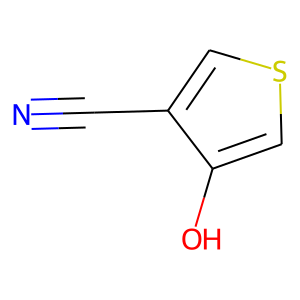

c1sc(c(c1O)C#N)

783


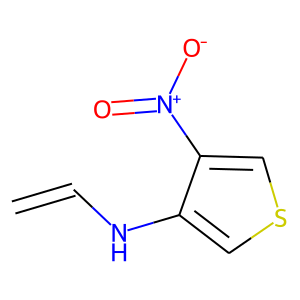

c1scc(N(=O)=O)c1NC=C

784


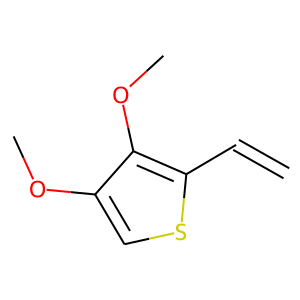

c1sc(c(c1OC)OC)C=C

785


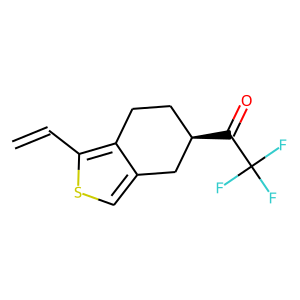

c1sc(c2c1C[C@H](C(=O)C(F)(F)F)CC2)C=C

786


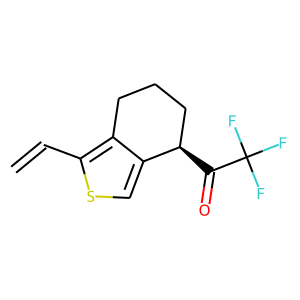

c1sc(c2c1[C@H](C(=O)C(F)(F)F)CCC2)C=C

787


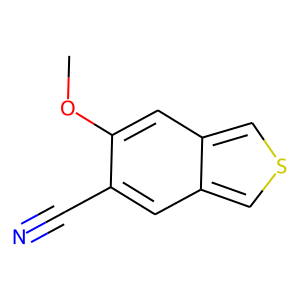

c1sc(c2c1cc(C#N)c(OC)c2)

788


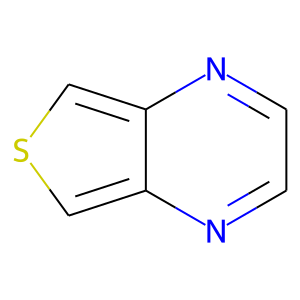

c1c2nccnc2c(s1)

789


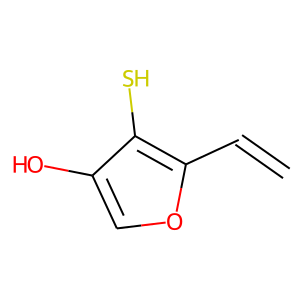

c1oc(c(c1O)S)C=C

790


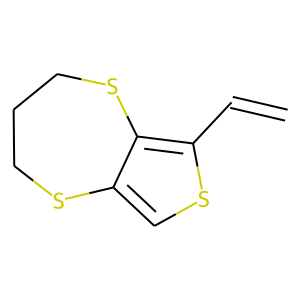

c1sc(c2c1SCCCS2)C=C

791


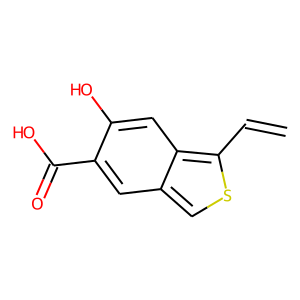

c1sc(c2c1cc(C(=O)O)c(O)c2)C=C

792


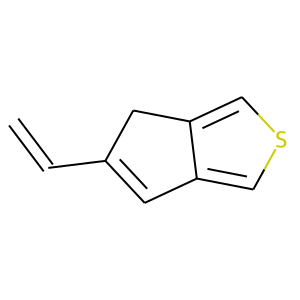

c1scc2c1C=C(C2)C=C

793


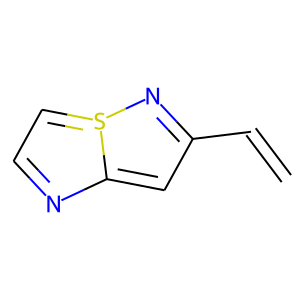

c(nc1c2)cs1nc2C=C

794


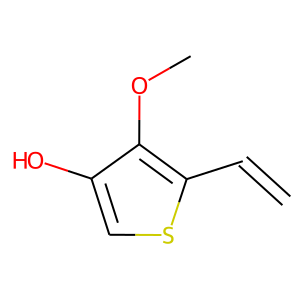

c1sc(c(c1O)OC)C=C

795


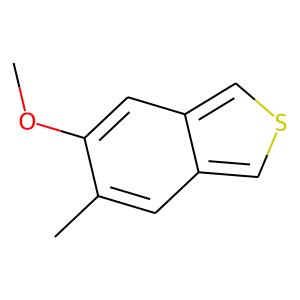

c1sc(c2c1cc(C)c(OC)c2)

796


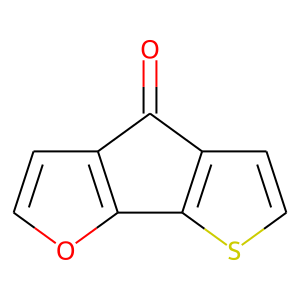

c1oc2c(c1)C(=O)c1c2sc(c1)

797


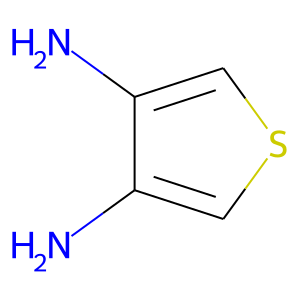

Nc1cscc1N

798


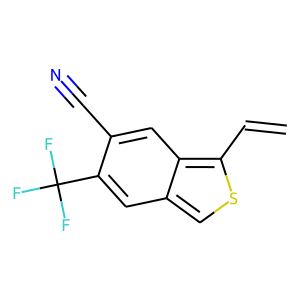

c1sc(c2c1cc(C(F)(F)F)c(C#N)c2)C=C

799


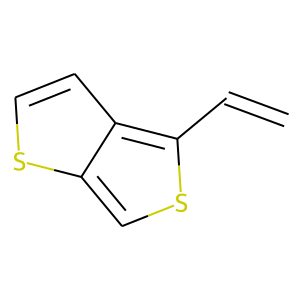

c1sc(c2c1scc2)C=C

800


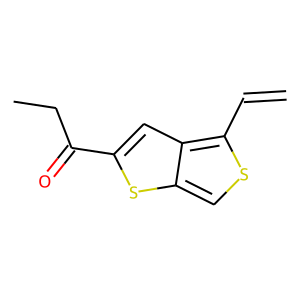

c1sc(c2c1sc(C(=O)CC)c2)C=C

801


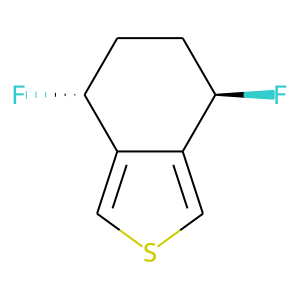

c1sc(c2c1[C@H](F)CC[C@H]2F)

802


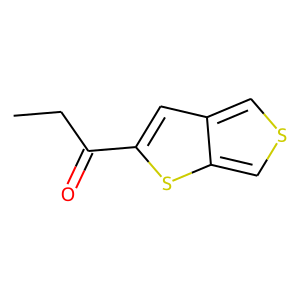

c1sc(c2c1sc(C(=O)CC)c2)

803


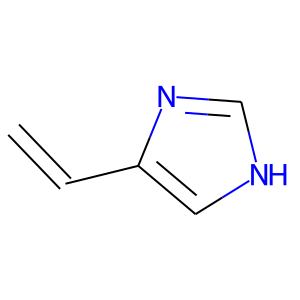

c1[nH]cnc1C=C

804


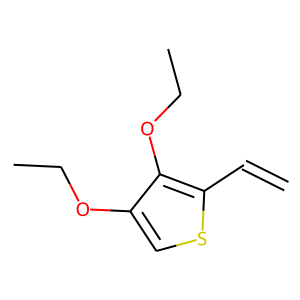

c1sc(c(c1OCC)OCC)C=C

805


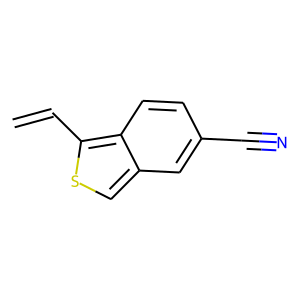

c1sc(c2c1cc(C#N)cc2)C=C

806


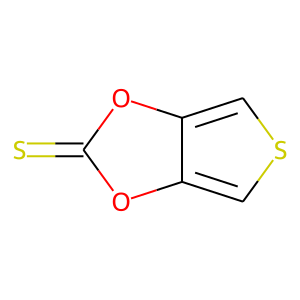

c1sc(c2c1oc(=S)o2)

807


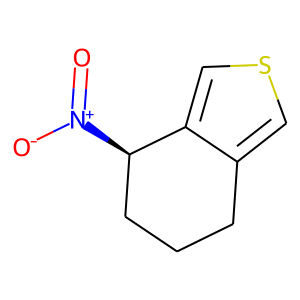

c1sc(c2c1CCC[C@H]2N(=O)=O)

808


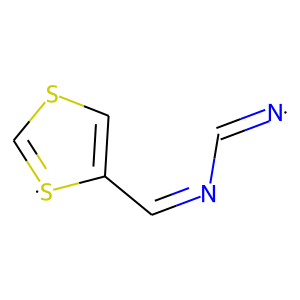

C(=[N])/N=C(\C1=CSC=[S]1)

809


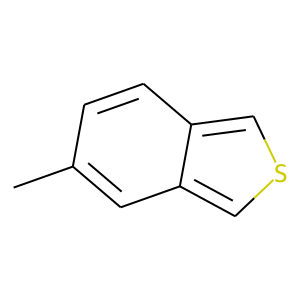

c1sc(c2c1cc(C)cc2)

810


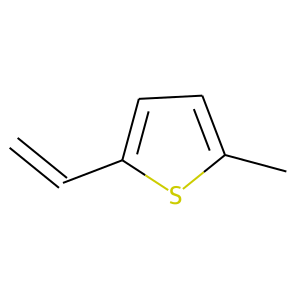

C(=C)c1sc(C)c(c1)

811


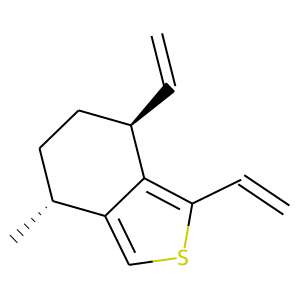

c1sc(c2c1[C@H](C)CC[C@H]2C=C)C=C

812


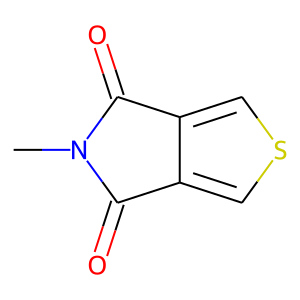

c(s1)c2c(=O)n(C)c(=O)c2c1

813


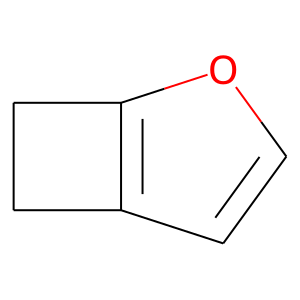

c1oc2CCc2c1

814


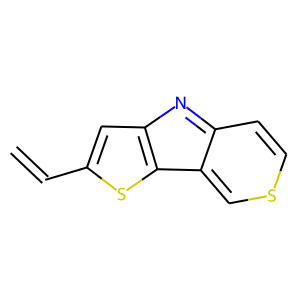

c1c2c(ccs1)nc1c2sc(c1)C=C

815


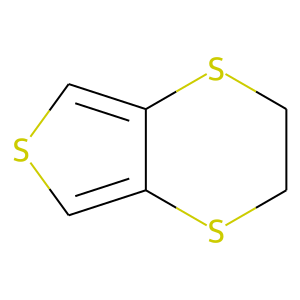

c1sc(c2c1SCCS2)

816


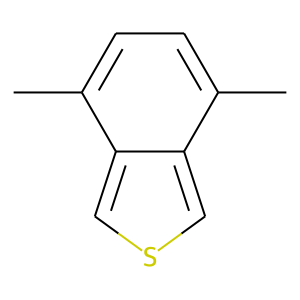

c1sc(c2c1c(C)ccc2C)

817


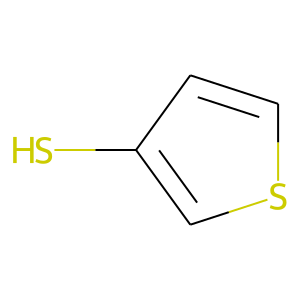

c1sccc1S

818


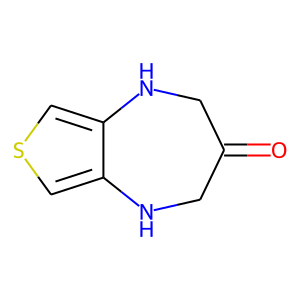

N1c2cscc2N(CC(=O)C1)

819


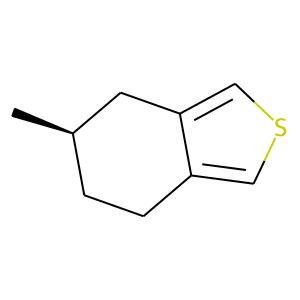

c1sc(c2c1CC[C@@H](C)C2)

820


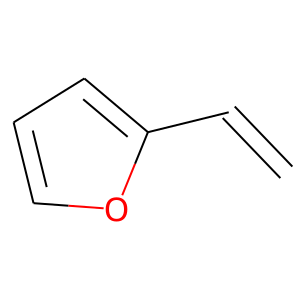

c1oc(cc1)C=C

821


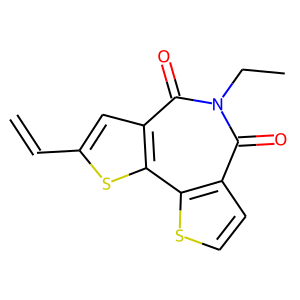

c1cc2c(s1)c1c(c(=O)n(c2=O)CC)cc(s1)C=C

822


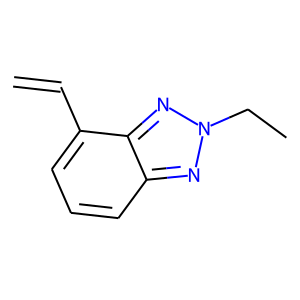

c1ccc(c2c1nn(CC)n2)C=C

823


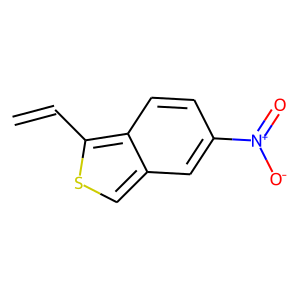

c1sc(c2c1cc(N(=O)=O)cc2)C=C

824


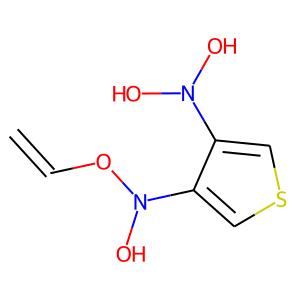

c1scc(N(O)O)c1N(O)OC=C

825


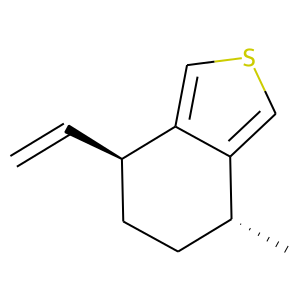

c1sc(c2c1[C@H](C)CC[C@H]2C=C)

826


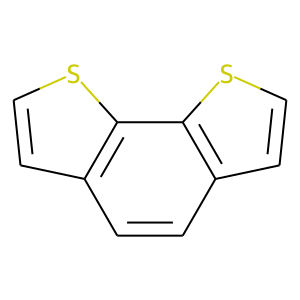

c1csc2c1cc(c1c2scc1)

827


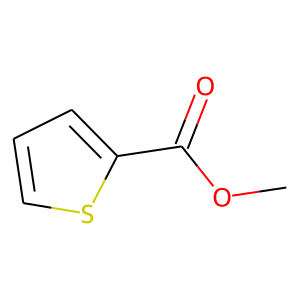

c1sc(C(=O)OC)cc1

828


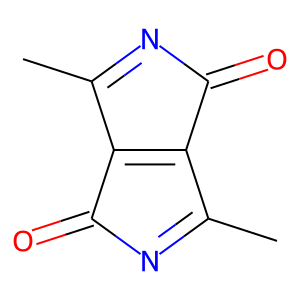

n1c(C)c2c(c1=O)c(C)n(c2=O)

829


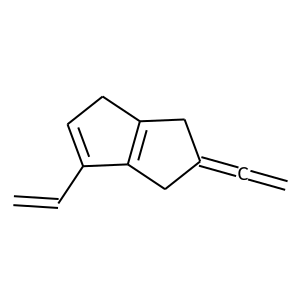

C=C=C1CC2=C(C1)C(=CC2)C=C

830


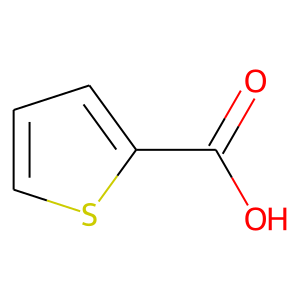

c1sc(C(=O)O)c(c1)

831


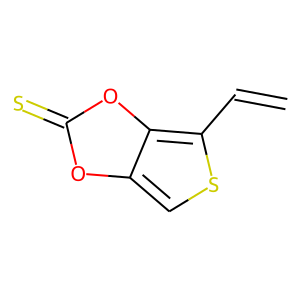

c1sc(c2c1oc(=S)o2)C=C

832


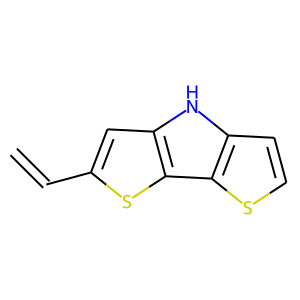

c1cc2c(s1)c1c([nH]2)cc(s1)C=C

833


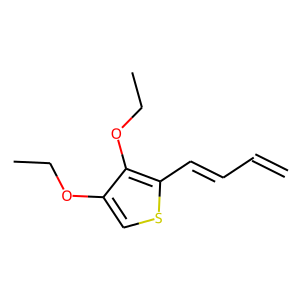

c1sc(c(c1OCC)OCC)C=CC=C

834


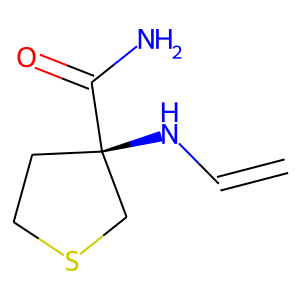

C1SC[C@](C1)(C(=O)N)NC=C

835


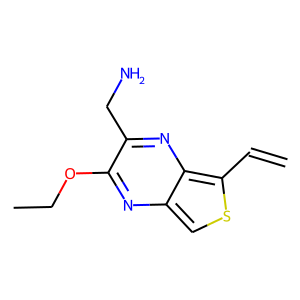

c1sc(c2c1nc(OCC)c(CN)n2)C=C

836


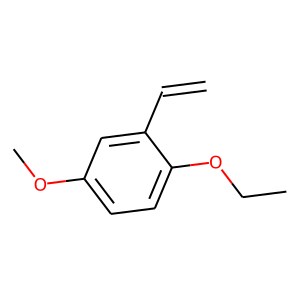

c1c(OC)cc(c(c1)OCC)C=C

837


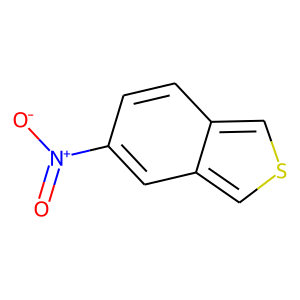

c1sc(c2c1cc(N(=O)=O)cc2)

838


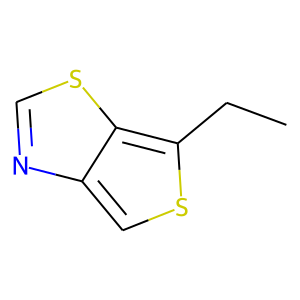

c1sc(CC)c2c1nc(s2)

839


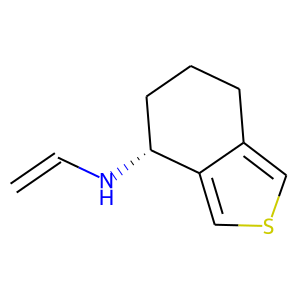

c1scc2c1[C@@H](CCC2)NC=C

840


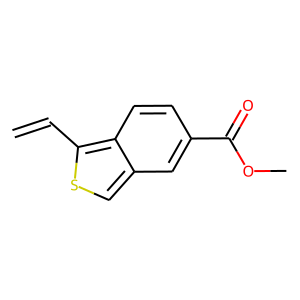

c1sc(c2c1cc(C(=O)OC)cc2)C=C

841


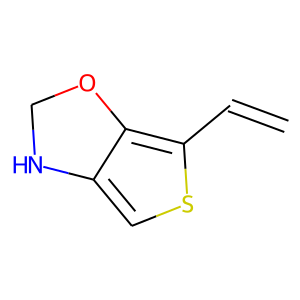

c(s1)c2NCOc2c1C=C

842


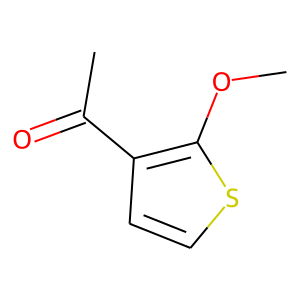

c1sc(OC)c(C(=O)C)c1

843


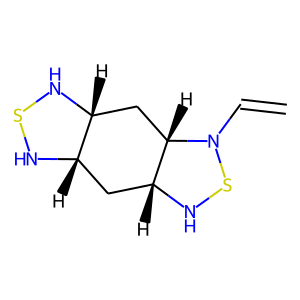

N1[C@@H]2C[C@@H]3NSN[C@@H]3C[C@@H]2N(S1)C=C

844


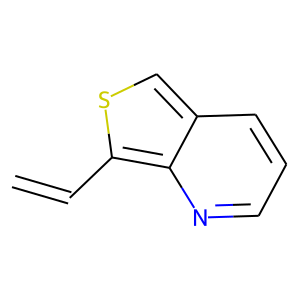

c1c2c(nccc2)c(s1)C=C

845


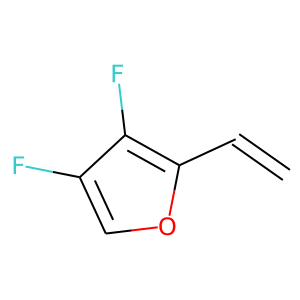

c1oc(c(c1F)F)C=C

846


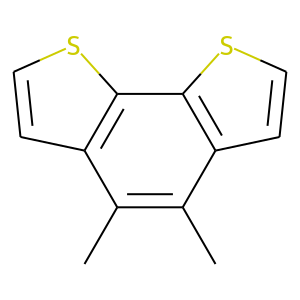

c1csc2c1c(C)c(C)c1c2scc1

847


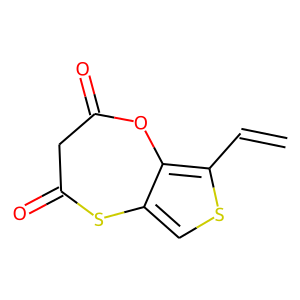

c1sc(c2c1SC(=O)CC(=O)O2)C=C

848


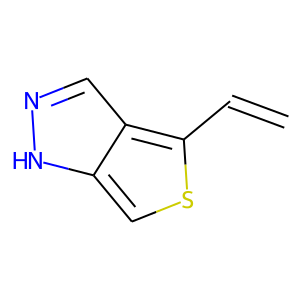

c1sc(c2c1[nH]nc2)C=C

849


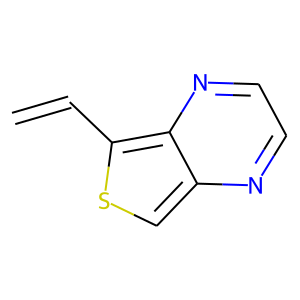

c1sc(c2c1nccn2)C=C

850


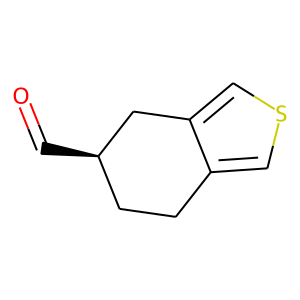

c1sc(c2c1CC[C@@H](C=O)C2)

851


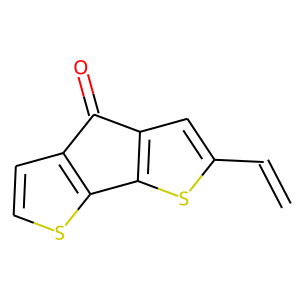

c(s1)cc(c(=O)2)c1c(s3)c2cc3C=C

852


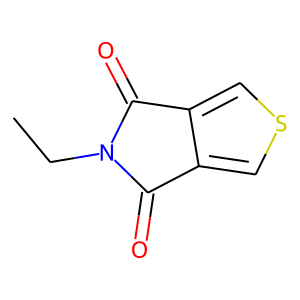

c(s1)c2c(=O)n(CC)c(=O)c2c1

853


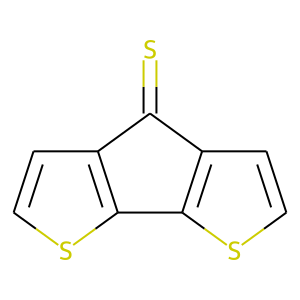

c(s1)cc(c(=S)2)c1c(s3)c2cc3

854


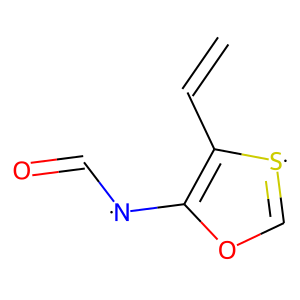

C1=[S]C(=C(O1)[N]C=O)C=C

855


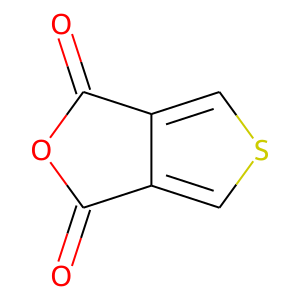

c1sc(c2c1C(=O)OC2=O)

856


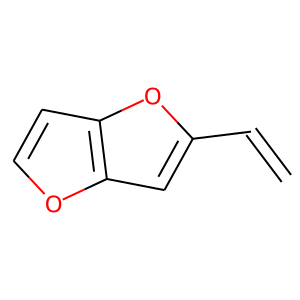

c1oc2cc(oc2c1)C=C

857


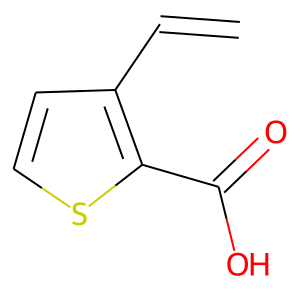

c1sc(C(=O)O)c(c1)C=C

858


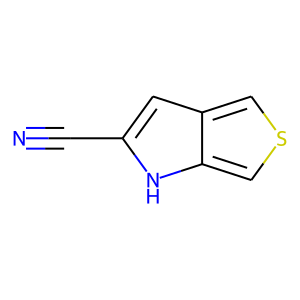

c1sc(c2c1[nH]c(C#N)c2)

859


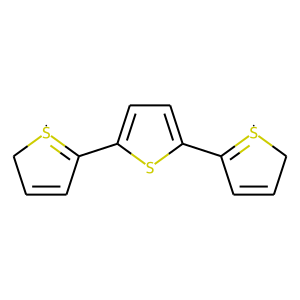

C1=CC(=[S]C1)c1ccc(s1)C1=[S]CC(=C1)

860


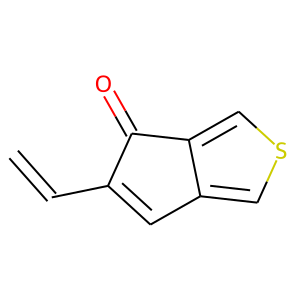

c1scc2c1C=C(C2=O)C=C

861


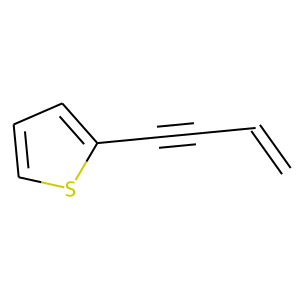

c1sc(cc1)C#CC=C

862


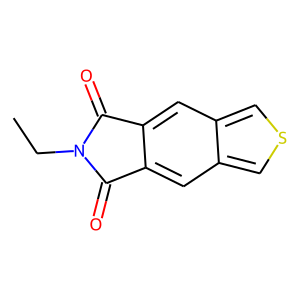

c1sc(c2c1cc1C(=O)N(CC)C(=O)c1c2)

863


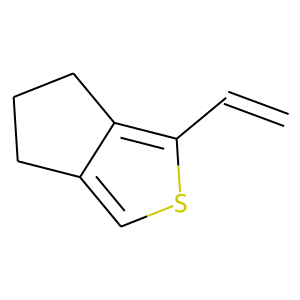

c1sc(c2c1CCC2)C=C

864


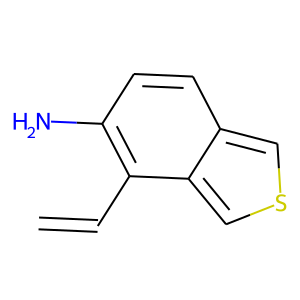

c1scc2c1c(c(cc2)N)C=C

865


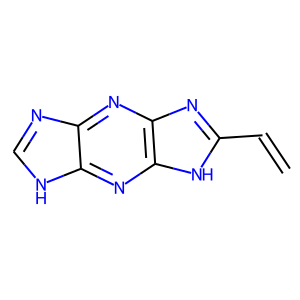

c1[nH]c2nc3[nH]c(nc3nc2n1)C=C

866


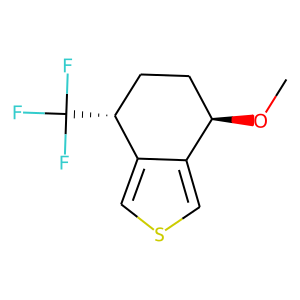

c1sc(c2c1[C@H](C(F)(F)F)CC[C@H]2OC)

867


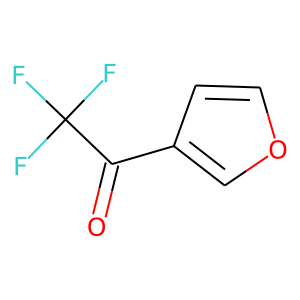

c1oc(cc1C(=O)C(F)(F)F)

868


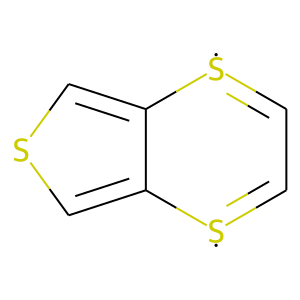

C1=[S]c2cscc2[S]=C1

869


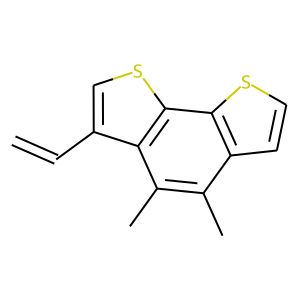

c1csc2c1c(C)c(C)c1c2scc1C=C

870


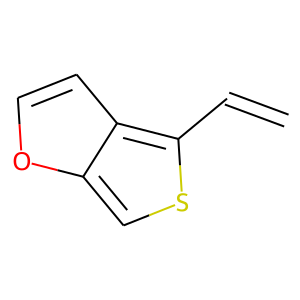

c1sc(c2c1occ2)C=C

871


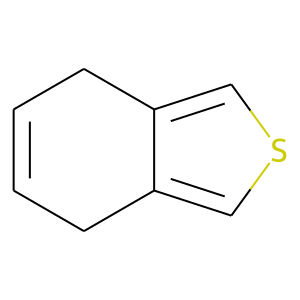

C1=C(Cc2cscc2C1)

872


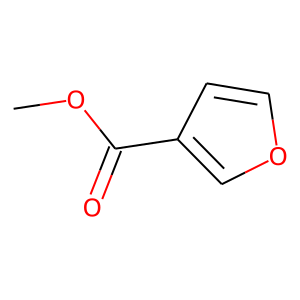

c1oc(cc1C(=O)OC)

873


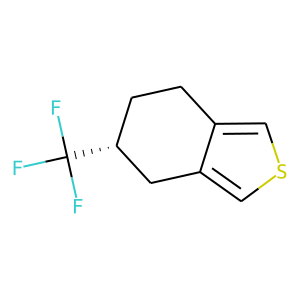

c1sc(c2c1C[C@H](C(F)(F)F)CC2)

874


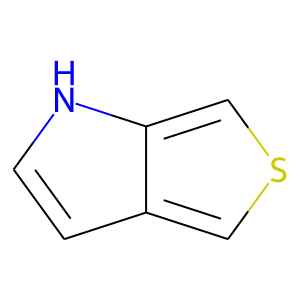

c1sc(c2c1cc[nH]2)

875


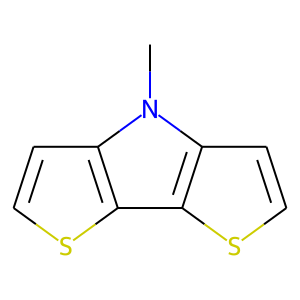

c1sc2c(c1)n(C)c1c2sc(c1)

876


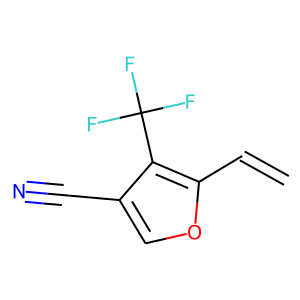

c1oc(c(c1C#N)C(F)(F)F)C=C

877


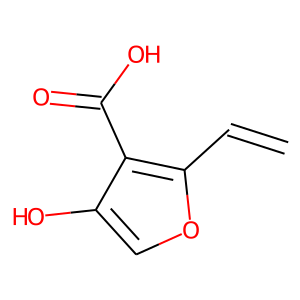

c1oc(c(c1O)C(=O)O)C=C

878


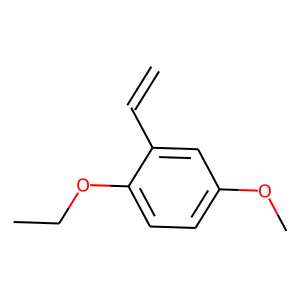

c1c(OCC)c(cc(c1)OC)C=C

879


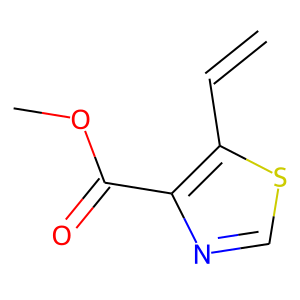

c1sc(c(n1)C(=O)OC)C=C

880


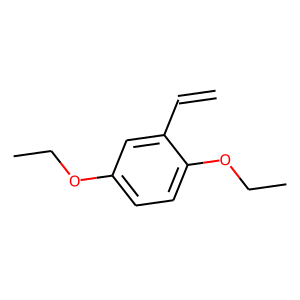

c1c(OCC)cc(c(c1)OCC)C=C

881


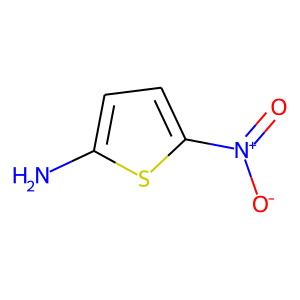

Nc1sc(N(=O)=O)cc1

882


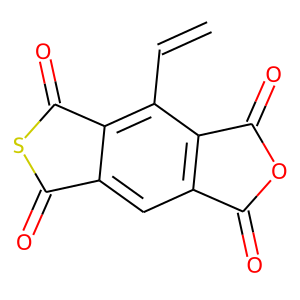

c1c2c(=O)sc(=O)c2c(c2c1c(=O)oc2=O)C=C

883


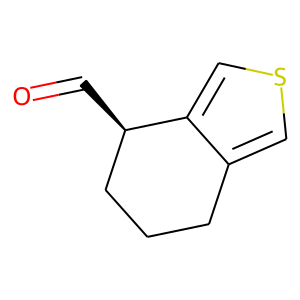

c1sc(c2c1CCC[C@H]2C=O)

884


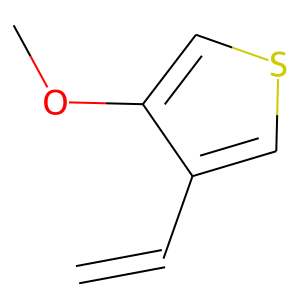

c1sc(c(c1C=C)OC)

885


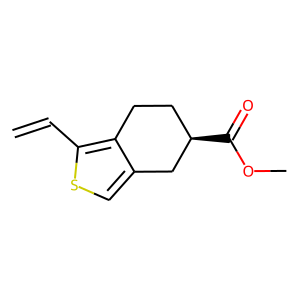

c1sc(c2c1C[C@H](C(=O)OC)CC2)C=C

886


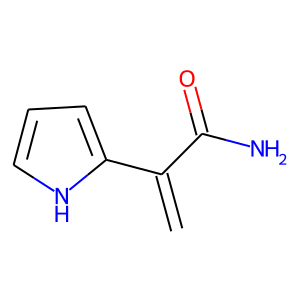

c1[nH]c(cc1)C(C(=O)N)=C

887


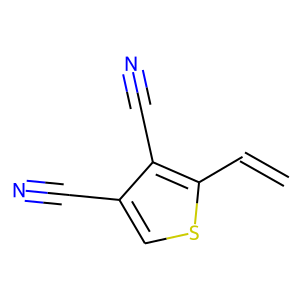

c1sc(c(c1C#N)C#N)C=C

888


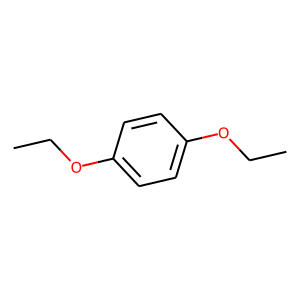

c1c(OCC)c(cc(c1)OCC)

889


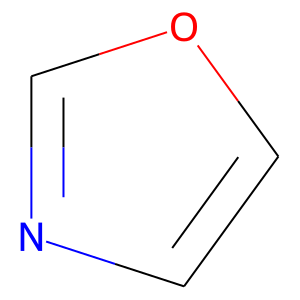

c1oc(nc1)

890


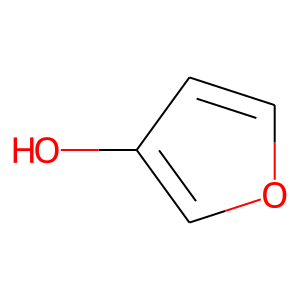

c1oc(cc1O)

891


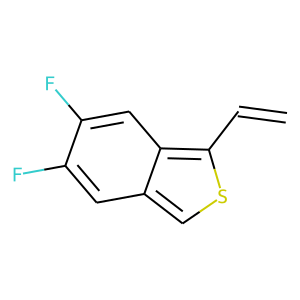

c1sc(c2c1cc(F)c(F)c2)C=C

892


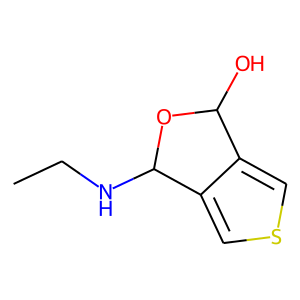

c(s1)c2C(NCC)OC(O)c2c1

893


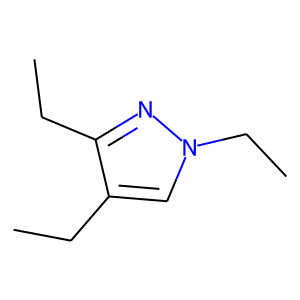

c1n(CC)nc(c1CC)CC

894


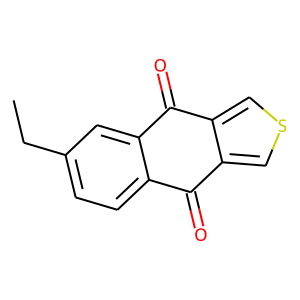

c1sc(c2c1C(=O)c1ccc(CC)cc1C2=O)

895


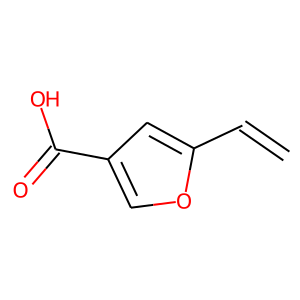

c1oc(cc1C(=O)O)C=C

896


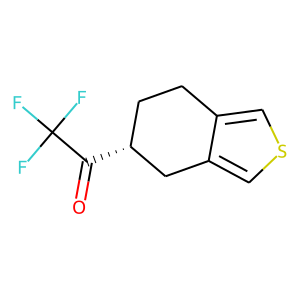

c1sc(c2c1C[C@H](C(=O)C(F)(F)F)CC2)

897


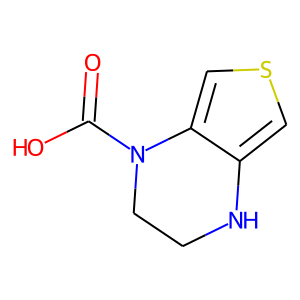

c1scc2c1N(CCN2C(=O)O)

898


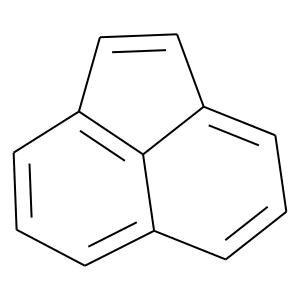

C1=C(c2c3c(cccc13)ccc2)

899


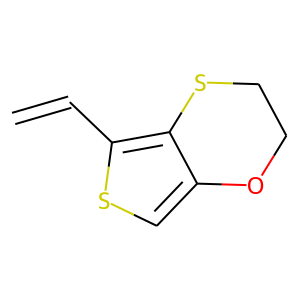

c1sc(c2c1OCCS2)C=C

900


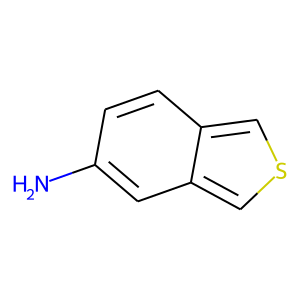

c1scc2c1c(c(cc2)N)

901


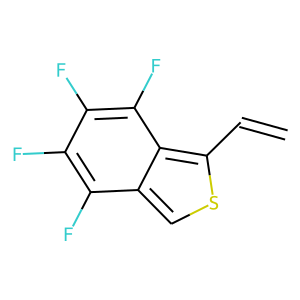

c1sc(c2c1c(F)c(F)c(F)c2F)C=C

902


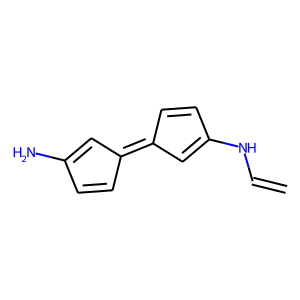

C1=C(C=C/C/1=C\1/C=CC(=C1)N)NC=C

903


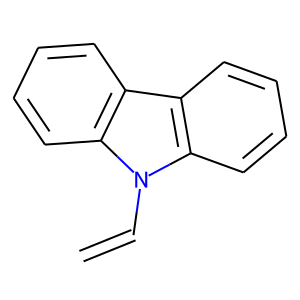

c1cccc2c1n(c1c2cccc1)C=C

904


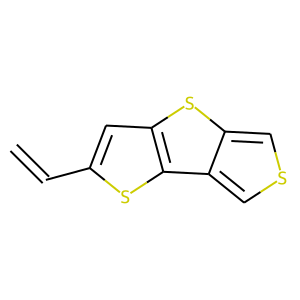

c1scc2c1c1c(s2)cc(s1)C=C

905


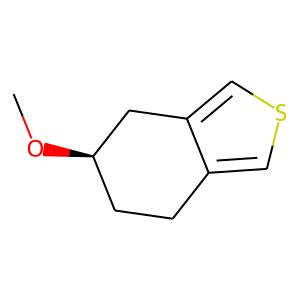

c1sc(c2c1CC[C@@H](OC)C2)

906


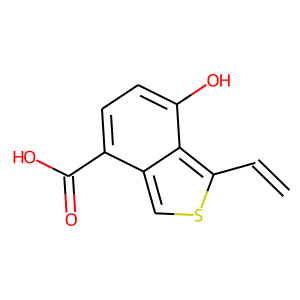

c1sc(c2c1c(C(=O)O)ccc2O)C=C

907


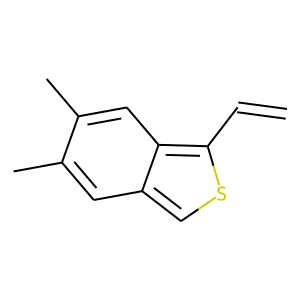

c1sc(c2c1cc(C)c(C)c2)C=C

908


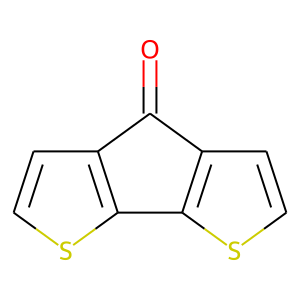

c1sc2c(c1)C(=O)c1c2sc(c1)

909


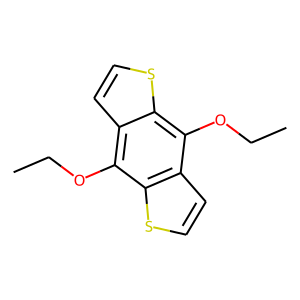

c1c2c(OCC)c3c(c(c2sc1)OCC)cc(s3)

910


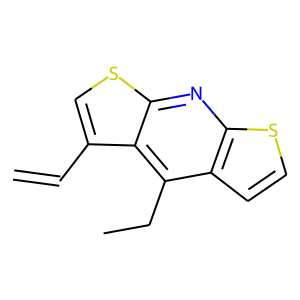

c1csc2c1c(CC)c1c(n2)scc1C=C

911


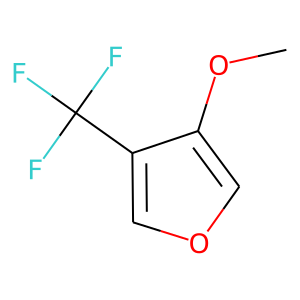

c1oc(c(c1C(F)(F)F)OC)

912


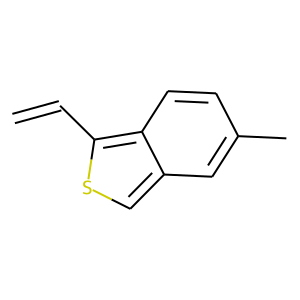

c1sc(c2c1cc(C)cc2)C=C

913


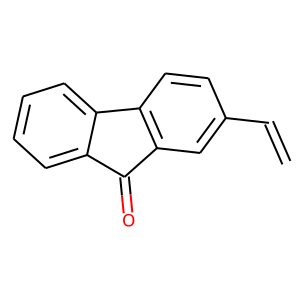

c1ccc2c(c1)C(=O)c1c2ccc(c1)C=C

914


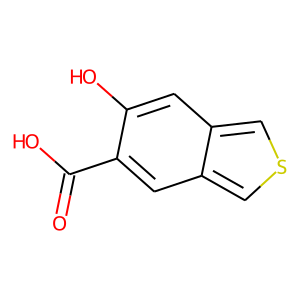

c1sc(c2c1cc(C(=O)O)c(O)c2)

915


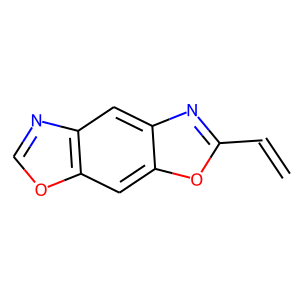

c1oc2c(n1)cc1c(c2)oc(n1)C=C

916


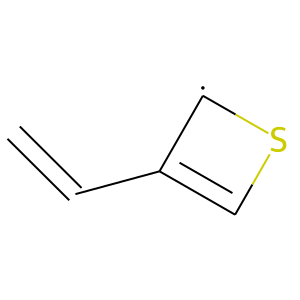

C1=C([CH]S1)C(=C)

917


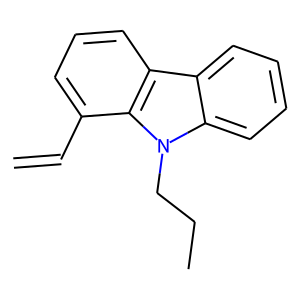

c1c2n(CCC)c3c(c2ccc1)cccc3C=C

918


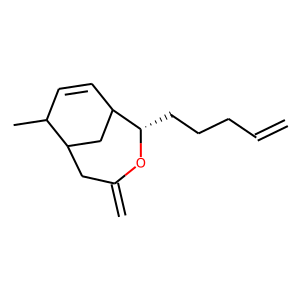

C1C2CC(=C)O[C@H](C1C=CC2C)CCCC=C

919


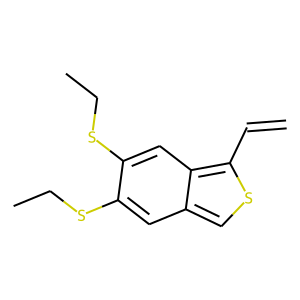

c1sc(c2c1cc(SCC)c(SCC)c2)C=C

920


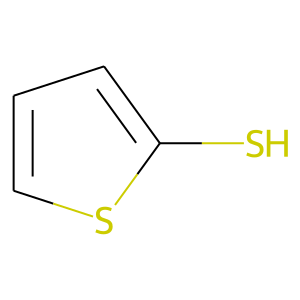

c1sc(cc1)S

921


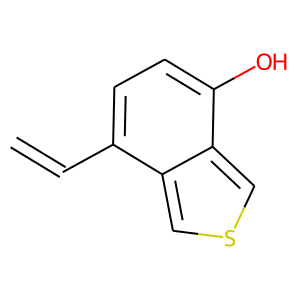

c1scc2c1c(ccc2O)C=C

922


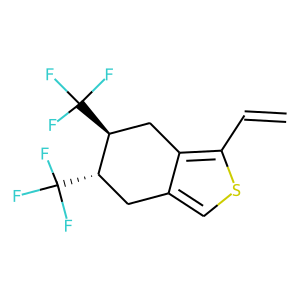

c1sc(c2c1C[C@H](C(F)(F)F)[C@@H](C(F)(F)F)C2)C=C

923


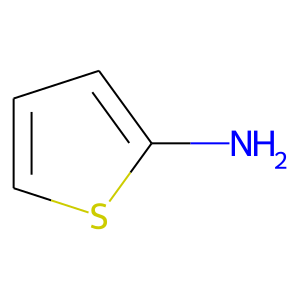

c1sc(cc1)N

924


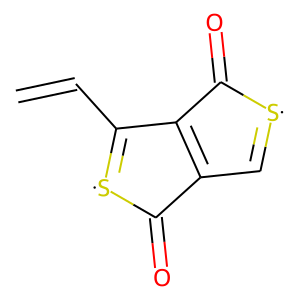

C1=[S]C(=O)C2=C1C(=O)[S]=C2C=C

925


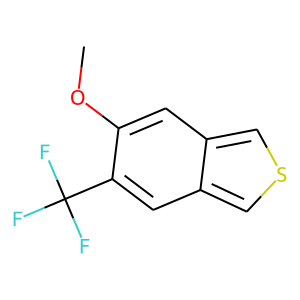

c1sc(c2c1cc(C(F)(F)F)c(OC)c2)

926


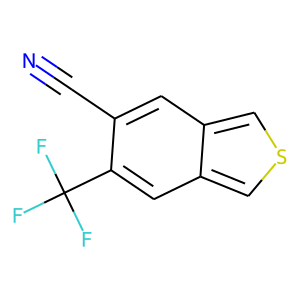

c1sc(c2c1cc(C(F)(F)F)c(C#N)c2)

927


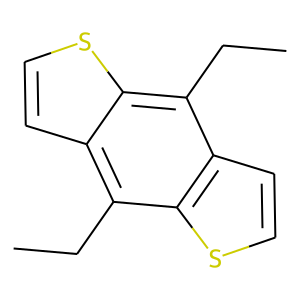

c1c(c2c(s1)c(CC)c1c(c2CC)scc1)

928


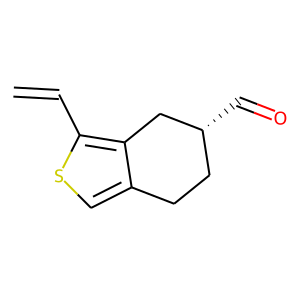

c1sc(c2c1CC[C@@H](C=O)C2)C=C

929


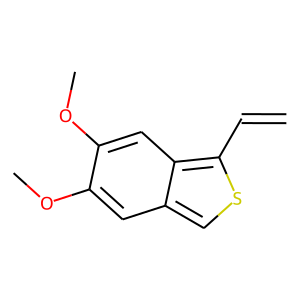

c1sc(c2c1cc(OC)c(OC)c2)C=C

930


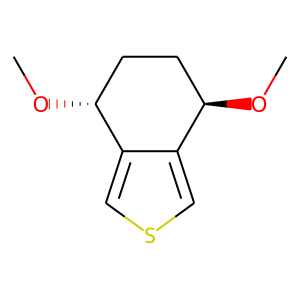

c1sc(c2c1[C@H](OC)CC[C@H]2OC)

931


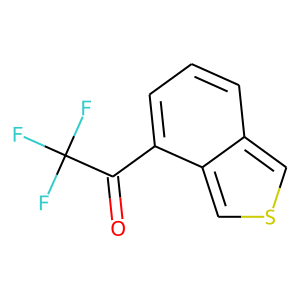

c1sc(c2c1c(C(=O)C(F)(F)F)ccc2)

932


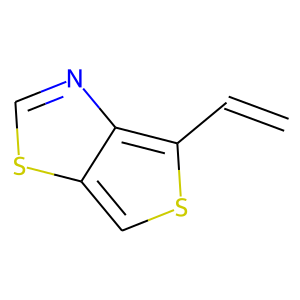

c1sc(c2c1scn2)C=C

933


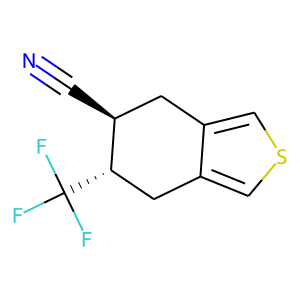

c1sc(c2c1C[C@H](C(F)(F)F)[C@@H](C#N)C2)

934


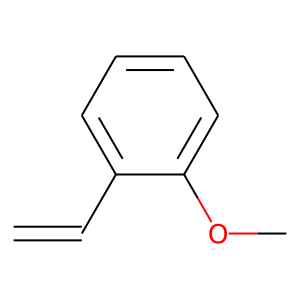

c1c(OC)c(ccc1)C=C

935


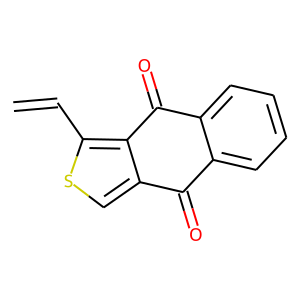

c1sc(c2c1C(=O)c1ccccc1C2=O)C=C

936


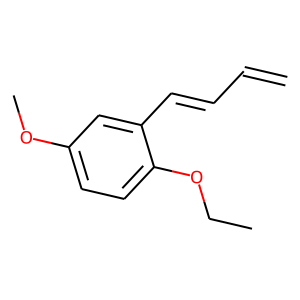

c1c(OC)cc(c(c1)OCC)C=CC=C

937


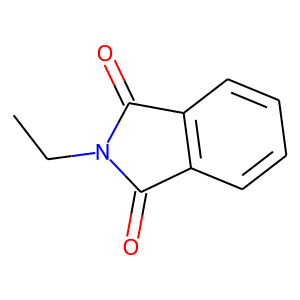

c1cc2c(C(=O)N(C2=O)CC)cc1

938


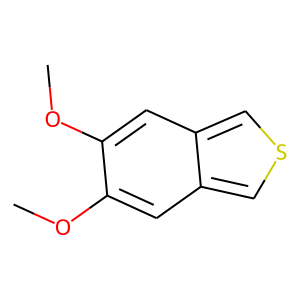

c1sc(c2c1cc(OC)c(OC)c2)

939


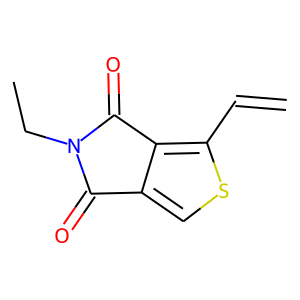

c(s1)c2c(=O)n(CC)c(=O)c2c1C=C

940


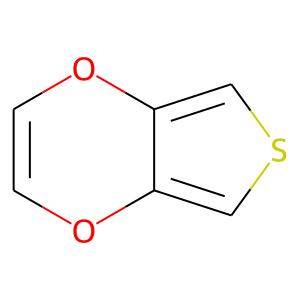

C1=C(Oc2c(csc2)O1)

941


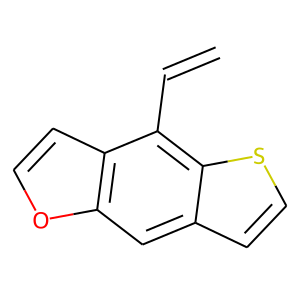

c1sc2c(c3ccoc3cc2c1)C=C

942


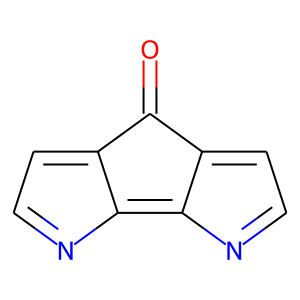

c1nc2c(c(=O)c3c2ncc3)c1

943


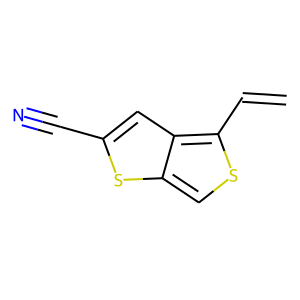

c1sc(c2c1sc(C#N)c2)C=C

944


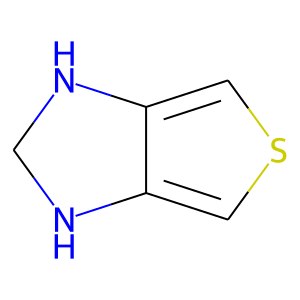

N1c2cscc2N(C1)

945


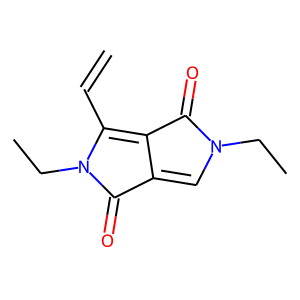

c1n(CC)c(=O)c2c1c(=O)n(CC)c2C=C

946


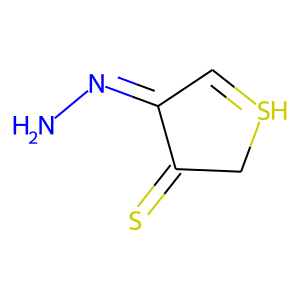

C1S=C(/C(=N/N)/C1=S)

947


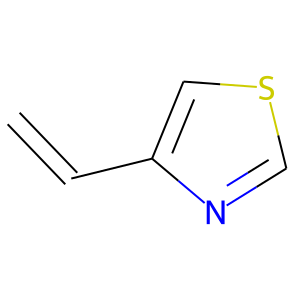

c1scc(n1)C=C

948


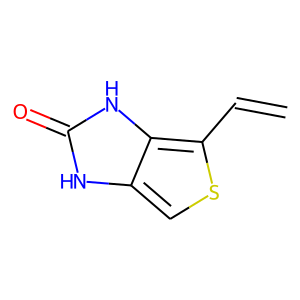

c1sc(c2c1[nH]c(=O)[nH]2)C=C

949


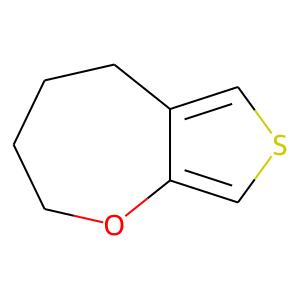

c1sc(c2c1OCCCC2)

950


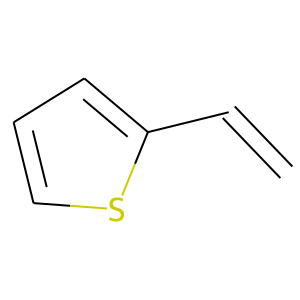

c1sc(cc1)C=C

951


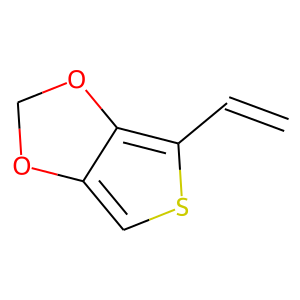

c1sc(c2c1OCO2)C=C

952


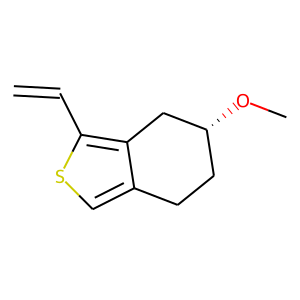

c1sc(c2c1CC[C@@H](OC)C2)C=C

953


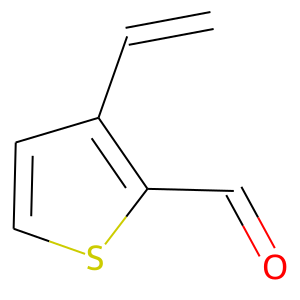

c1sc(C=O)c(c1)C=C

954


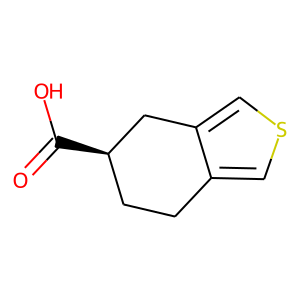

c1sc(c2c1CC[C@@H](C(=O)O)C2)

955


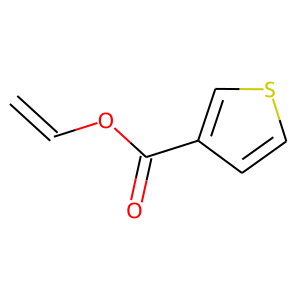

c1cscc1C(=O)OC=C

956


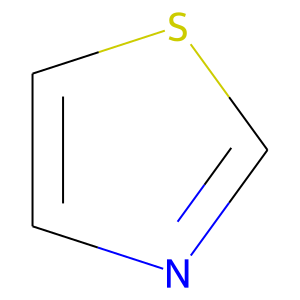

c1scc(n1)

957


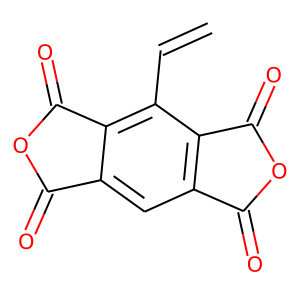

c1c2c(=O)oc(=O)c2c(c2c1c(=O)oc2=O)C=C

958


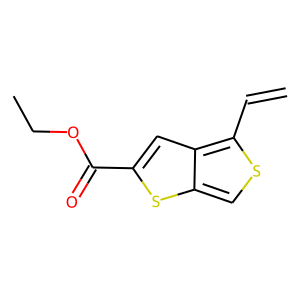

c1sc(c2c1sc(C(=O)OCC)c2)C=C

959


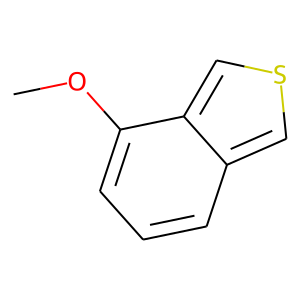

c1scc2c1c(ccc2OC)

960


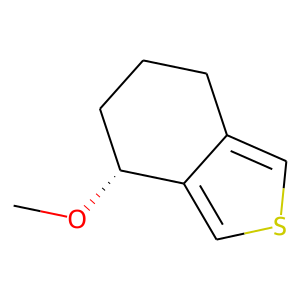

c1sc(c2c1[C@H](OC)CCC2)

961


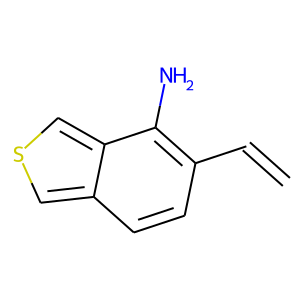

c1c2cscc2c(N)c(c1)C=C

962


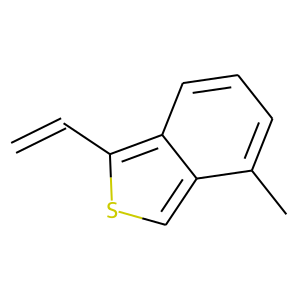

c1sc(c2c1c(C)ccc2)C=C

963


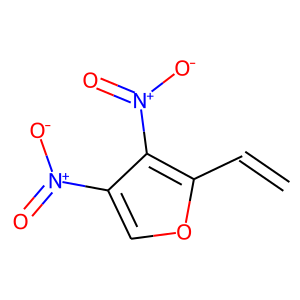

c1oc(c(c1N(=O)=O)N(=O)=O)C=C

964


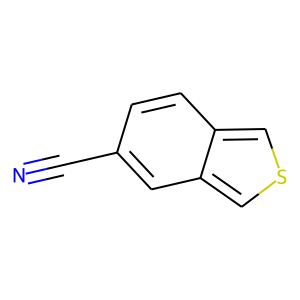

c1sc(c2c1cc(C#N)cc2)

965


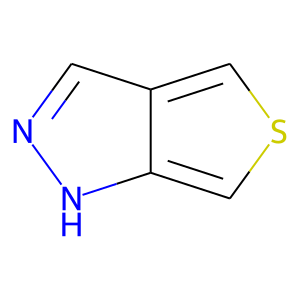

c1sc(c2c1[nH]nc2)

966


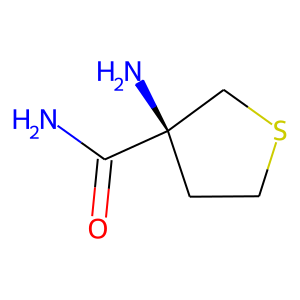

C1SC[C@](C1)(C(=O)N)N

967


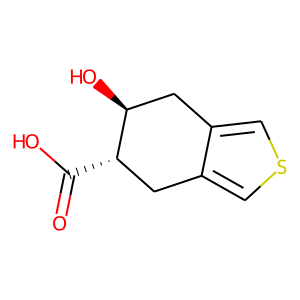

c1sc(c2c1C[C@H](C(=O)O)[C@@H](O)C2)

968


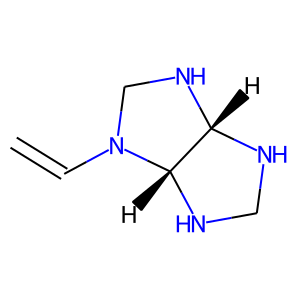

N1CN[C@@H]2[C@H]1N(CN2)C=C

969


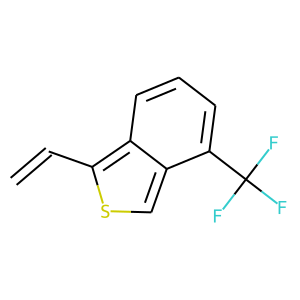

c1sc(c2c1c(C(F)(F)F)ccc2)C=C

970


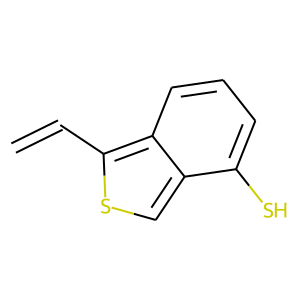

c1sc(c2c1c(S)ccc2)C=C

971


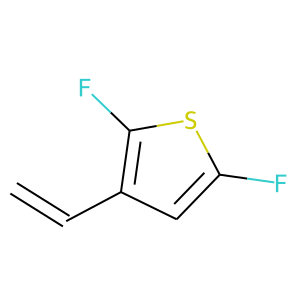

c1c(F)sc(F)c1C=C

972


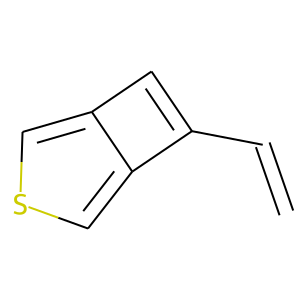

C1=C(c2cscc12)C=C

973


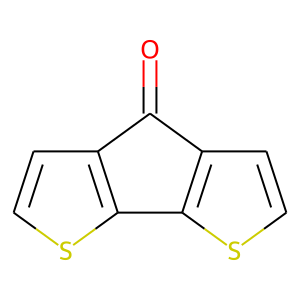

c(s1)cc(c(=O)2)c1c(s3)c2cc3

974


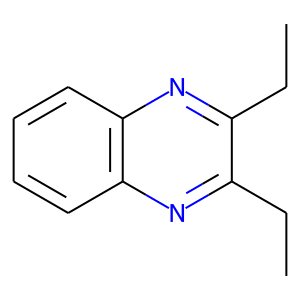

c1ccc(c2c1nc(CC)c(CC)n2)

975


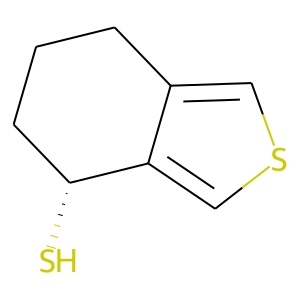

c1sc(c2c1[C@H](S)CCC2)

976


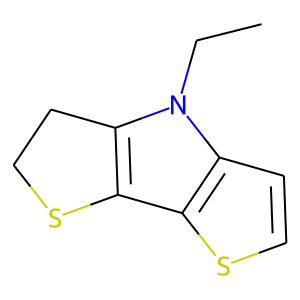

c1c(c2c(s1)c1c(n2CC)CCS1)

977


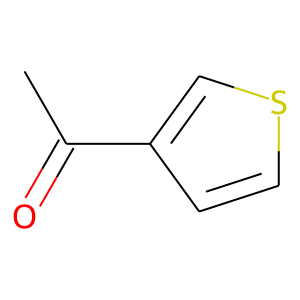

c1sc(c(c1)C(=O)C)

978


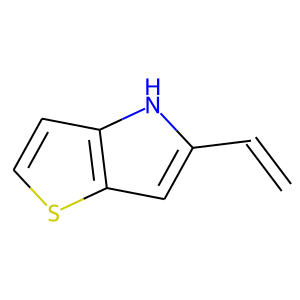

c1sc2c(c1)[nH]c(c2)C=C

979


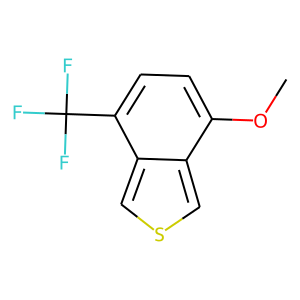

c1sc(c2c1c(C(F)(F)F)ccc2OC)

980


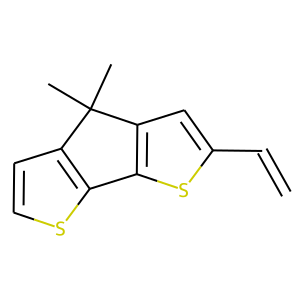

c1sc2c(c1)C(C)(C)c1c2sc(c1)C=C

981


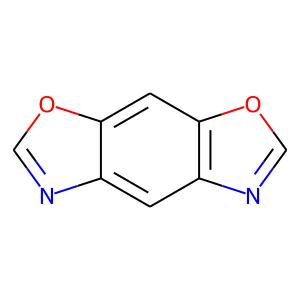

c1oc2c(n1)cc1c(c2)oc(n1)

982


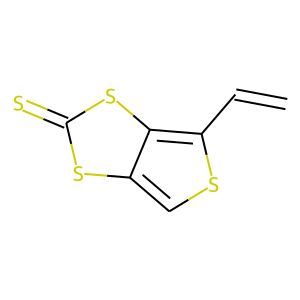

c1sc(c2c1sc(=S)s2)C=C

983


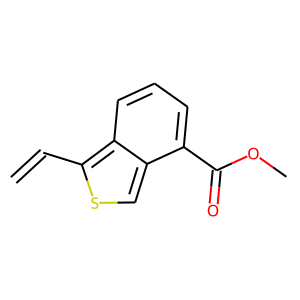

c1sc(c2c1c(C(=O)OC)ccc2)C=C

984


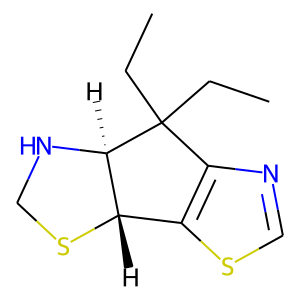

c1nc2c(s1)[C@H]1[C@H](C2(CC)CC)N(CS1)

985


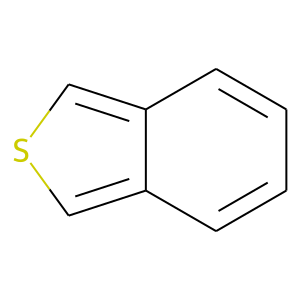

c1c2cccc(c2cs1)

986


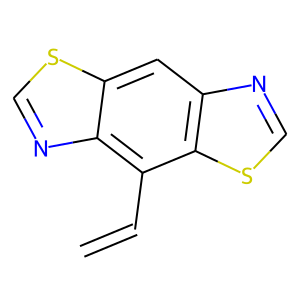

c1c2c(ncs2)c(c2c1ncs2)C=C

987


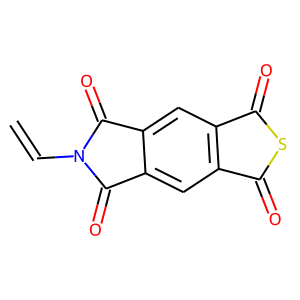

c1c2c(=O)n(c(=O)c2cc2c1c(=O)sc2=O)C=C

988


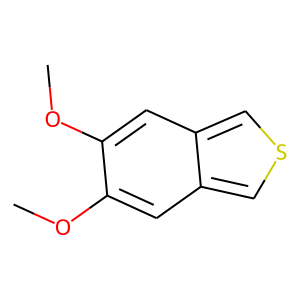

c(s1)c2cc(OC)c(OC)cc2c1

989


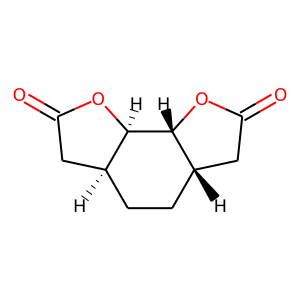

C1C(=O)O[C@@H]2[C@H]1CC[C@@H]1[C@H]2OC(=O)C1

990


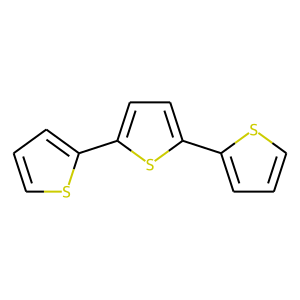

c1sc(cc1)c1ccc(s1)c1sc(cc1)

991


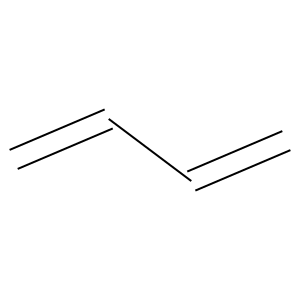

C=CC=C

992


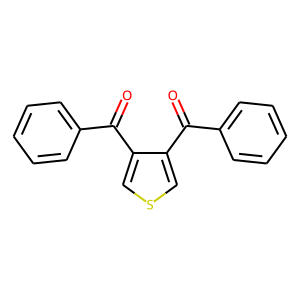

c1c(C(=O)c2cscc2C(=O)c2ccccc2)ccc(c1)

993


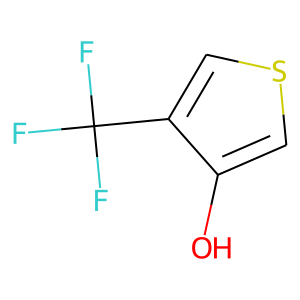

c1sc(c(c1O)C(F)(F)F)

994


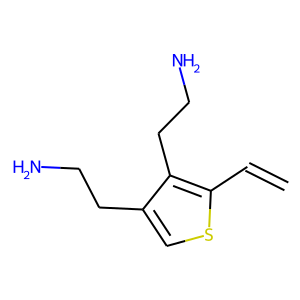

c(s1)c(CCN)c(CCN)c1C=C

995


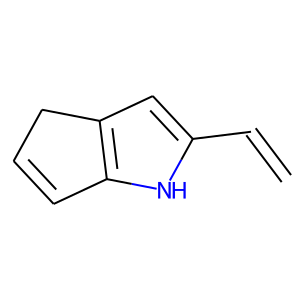

C1=Cc2[nH]c(cc2C1)C=C

996


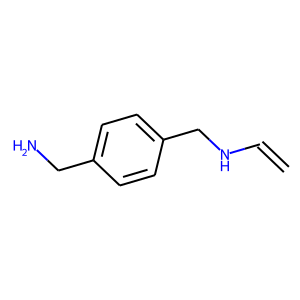

c1cc(CN)ccc1CNC=C

997


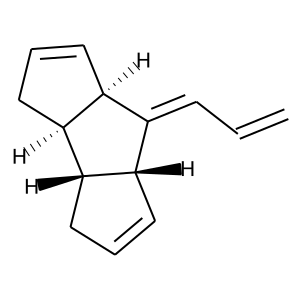

C1=C[C@@H]2[C@H](C1)[C@@H]1[C@@H](C=CC1)C2=CC=C

998


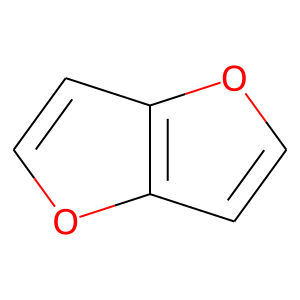

c1oc2cc(oc2c1)

999


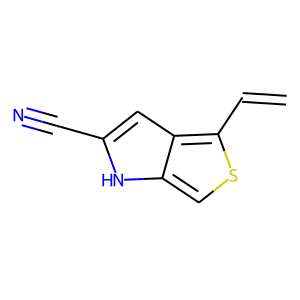

c1sc(c2c1[nH]c(C#N)c2)C=C

1000


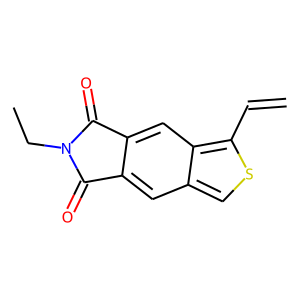

c1sc(c2c1cc1C(=O)N(CC)C(=O)c1c2)C=C

1001


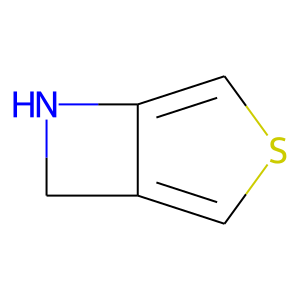

c1sc(c2c1CN2)

1002


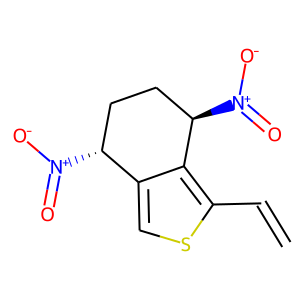

c1sc(c2c1[C@H](N(=O)=O)CC[C@H]2N(=O)=O)C=C

1003


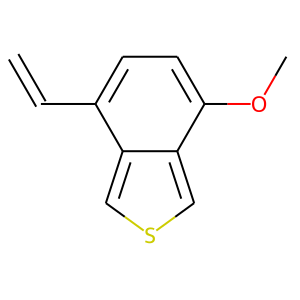

c1scc2c1c(ccc2OC)C=C

1004


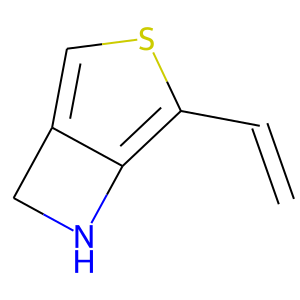

c1sc(c2c1CN2)C=C

1005


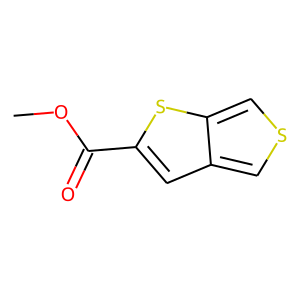

c1sc(c2c1cc(C(=O)OC)s2)

1006


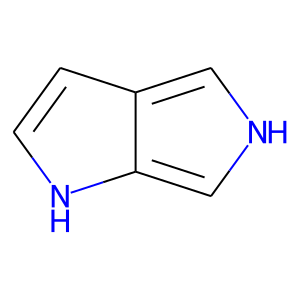

c1[nH]cc2c1[nH]cc2

1007


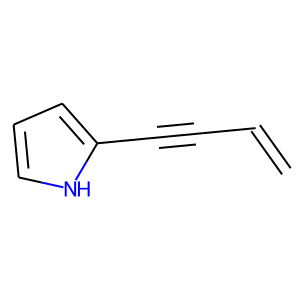

c1[nH]c(cc1)C#CC=C

1008


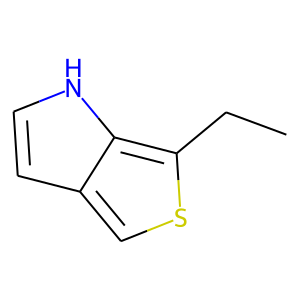

c1sc(CC)c2c1c(c[nH]2)

1009


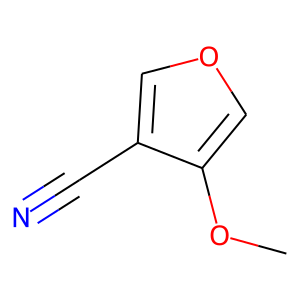

c1oc(c(c1OC)C#N)

1010


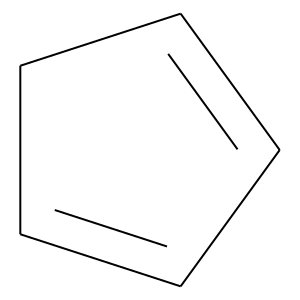

c1cCcc1

1011


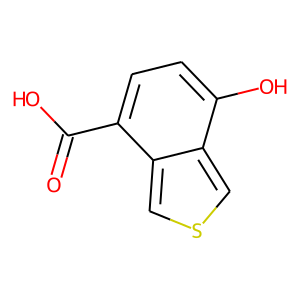

c1sc(c2c1c(C(=O)O)ccc2O)

1012


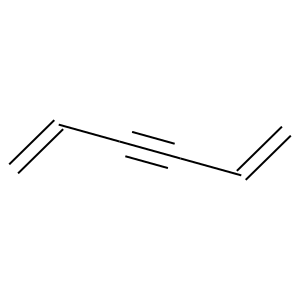

C(=C)C#CC=C

1013


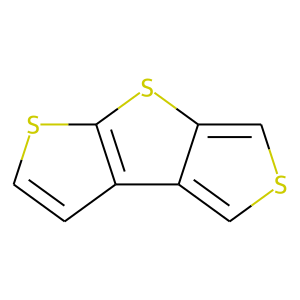

c1scc2c1c1c(s2)sc(c1)

1014


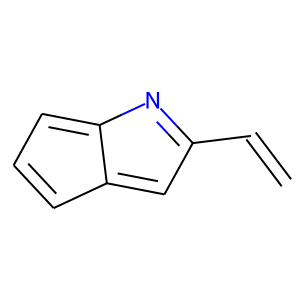

C1=CC2=CC(=NC2=C1)C=C

1015


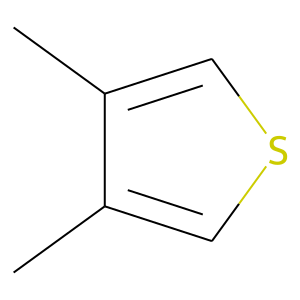

c1sc(c(c1C)C)

1016


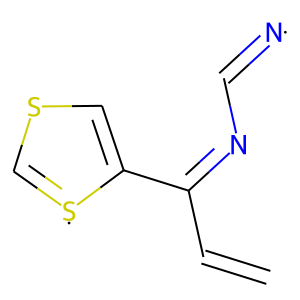

C(=[N])/N=C(\C1=CSC=[S]1)C=C

1017


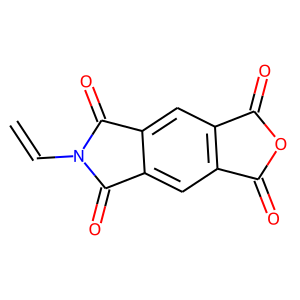

c1c2c(=O)n(c(=O)c2cc2c1c(=O)oc2=O)C=C

1018


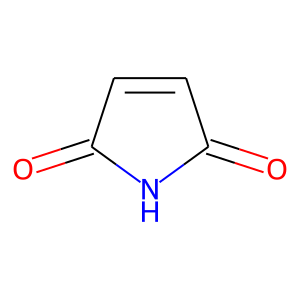

N1C(=O)C=C(C1=O)

1019


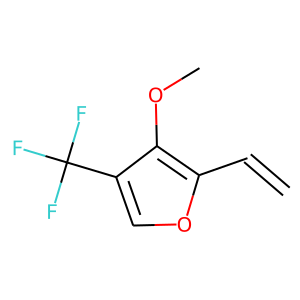

c1oc(c(c1C(F)(F)F)OC)C=C

1020


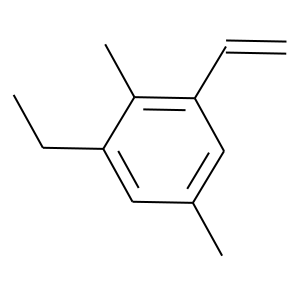

c1c(C)cc(CC)c(C)c1C=C

1021


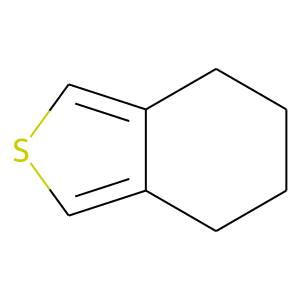

c1sc(c2c1CCCC2)

1022


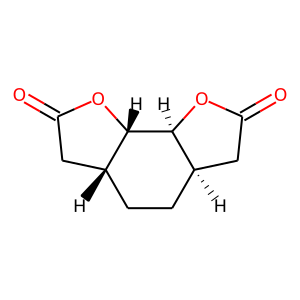

C1C(=O)O[C@H]2[C@@H]1CC[C@H]1[C@@H]2OC(=O)C1

1023


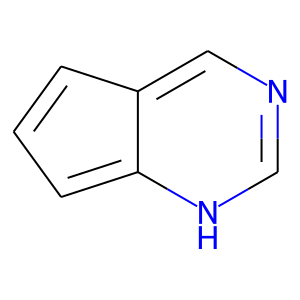

c1cc(c2c1[nH]cnc2)

1024


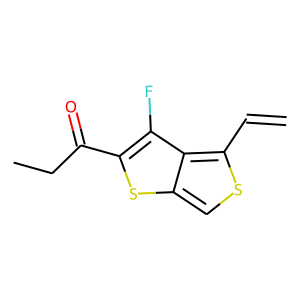

c1sc(c2c1sc(C(=O)CC)c2F)C=C

1025


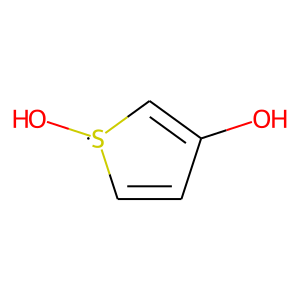

C1=C(C(=C[S@@]1O)O)

1026


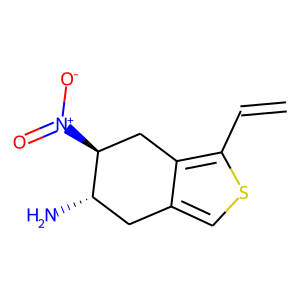

c1sc(c2c1C[C@H](N)[C@@H](N(=O)=O)C2)C=C

1027


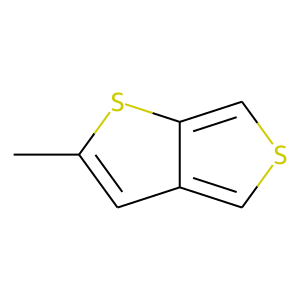

c1sc(c2c1cc(C)s2)

1028


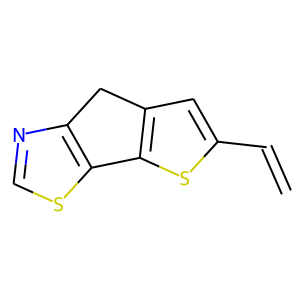

c1sc2c(n1)Cc1c2sc(c1)C=C

1029


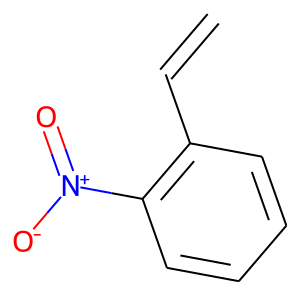

c1cc(N(=O)=O)c(cc1)C=C

1030


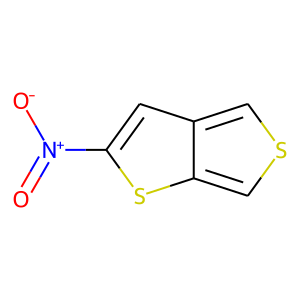

c1sc(c2c1sc(N(=O)=O)c2)

1031


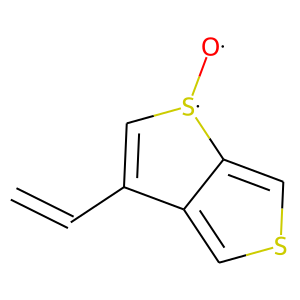

c1scc2c1C(=C[S@@]2[O])C=C

1032


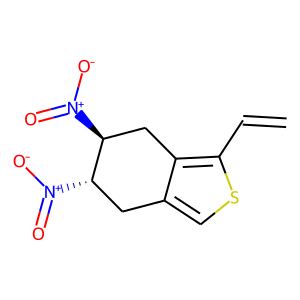

c1sc(c2c1C[C@H](N(=O)=O)[C@@H](N(=O)=O)C2)C=C

1033


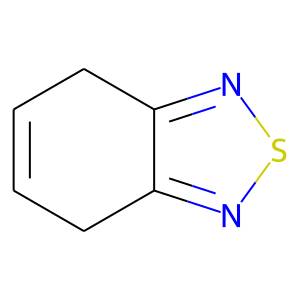

C1=C(Cc2c(C1)nsn2)

1034


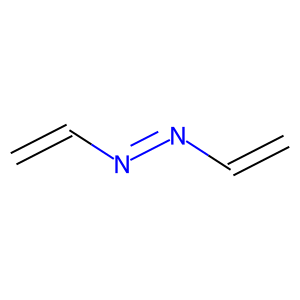

C(=C)N=NC=C

1035


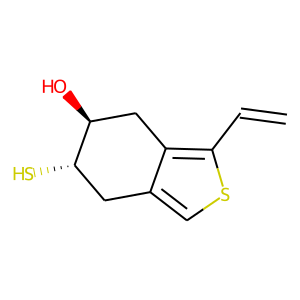

c1sc(c2c1C[C@H](S)[C@@H](O)C2)C=C

1036


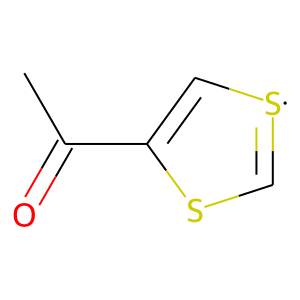

C1=[S]C(=C(S1)C(=O)C)

1037


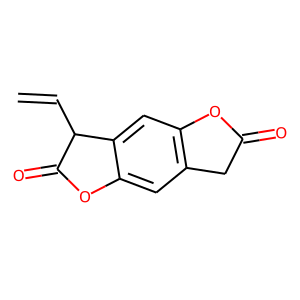

C1C(=O)Oc2c1cc1c(c2)C(C(=O)O1)C=C

1038


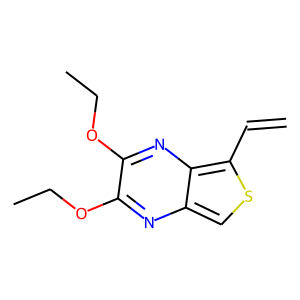

c1sc(c2c1nc(OCC)c(OCC)n2)C=C

1039


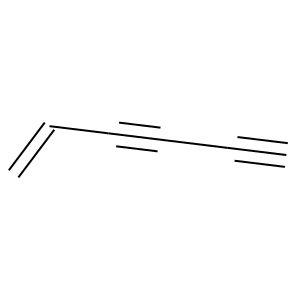

C#CC#CC=C

1040


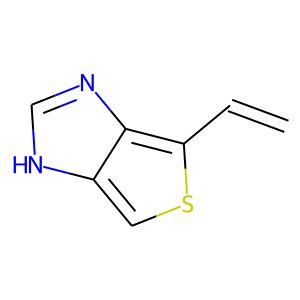

c1sc(c2c1[nH]cn2)C=C

1041


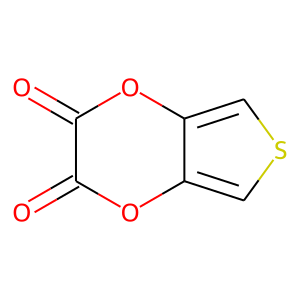

c1sc(c2c1oc(=O)c(=O)o2)

1042


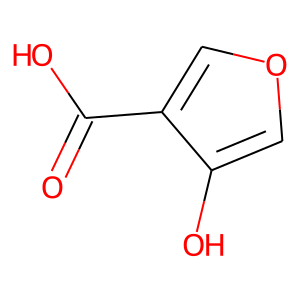

c1oc(c(c1O)C(=O)O)

1043


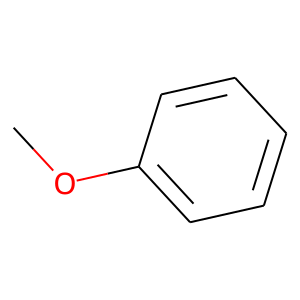

c1c(OC)c(ccc1)

1044


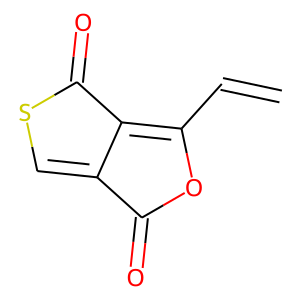

C1=C2C(C(=O)S1)=C(OC2=O)C=C

1045


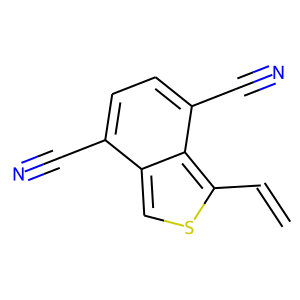

c1sc(c2c1c(C#N)ccc2C#N)C=C

1046


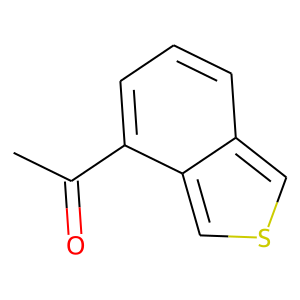

c1sc(c2c1c(C(=O)C)ccc2)

1047


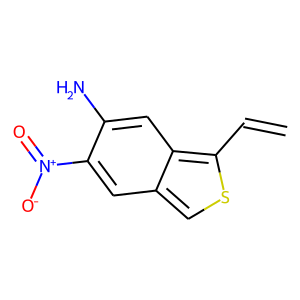

c1sc(c2c1cc(N(=O)=O)c(N)c2)C=C

1048


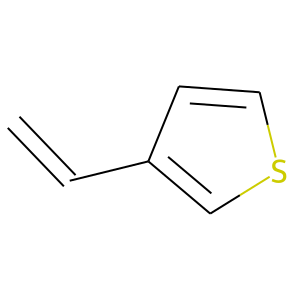

C=Cc1csc(c1)

1049


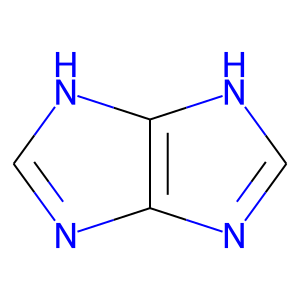

c1[nH]c2[nH]c(nc2n1)

1050


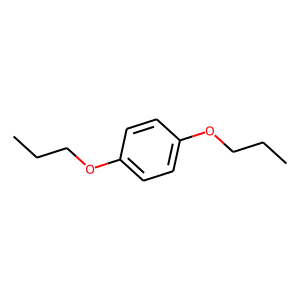

c1c(OCCC)c(cc(c1)OCCC)

1051


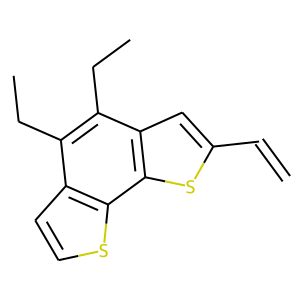

c(s1)cc(c(CC)c(CC)2)c1c(s3)c2cc3C=C

1052


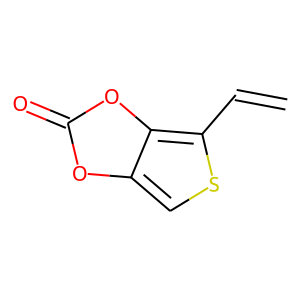

c1sc(c2c1oc(=O)o2)C=C

1053


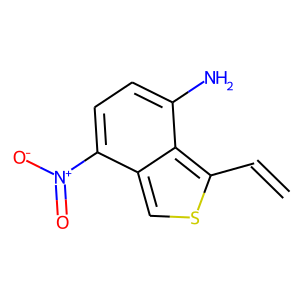

c1sc(c2c1c(N(=O)=O)ccc2N)C=C

1054


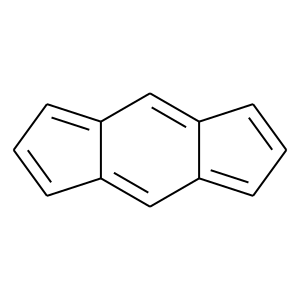

C1=Cc2cc3=CC(=Cc3cc2=C1)

1055


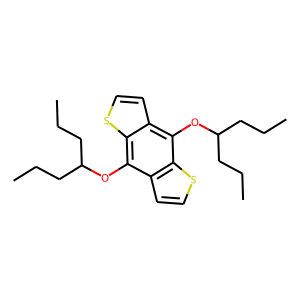

c(s1)cc(c(OC(CCC)CCC)2)c1c(OC(CCC)CCC)c(c3)c2sc3

1056


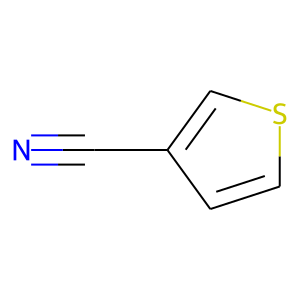

c1sc(c(c1)C#N)

1057


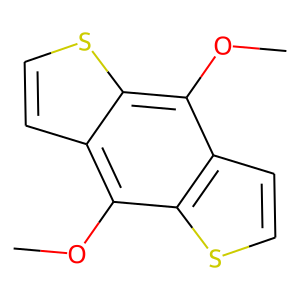

c1c(c2c(s1)c(OC)c1c(c2OC)scc1)

1058


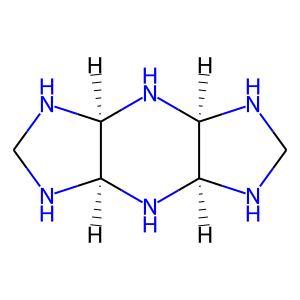

N1CN[C@@H]2N[C@H]3[C@@H](N[C@H]12)NCN3

1059


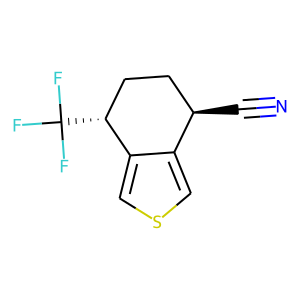

c1sc(c2c1[C@H](C(F)(F)F)CC[C@H]2C#N)

1060


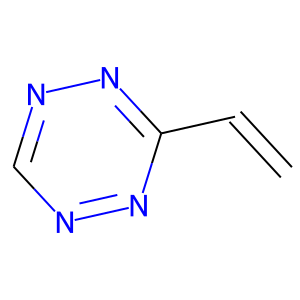

c1nnc(nn1)C=C

1061


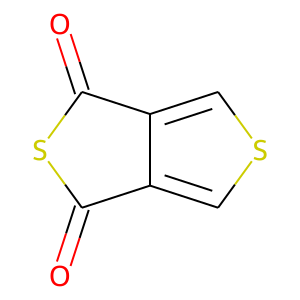

c1sc(c2c1C(=O)SC2=O)

1062


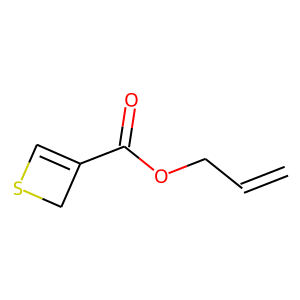

C1SC=C1C(=O)OCC=C

1063


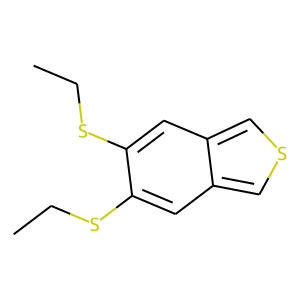

c1sc(c2c1cc(SCC)c(SCC)c2)

1064


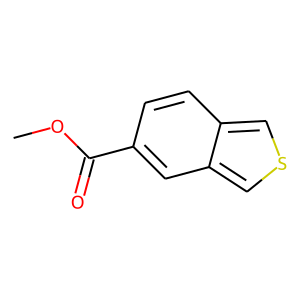

c1sc(c2c1cc(C(=O)OC)cc2)

1065


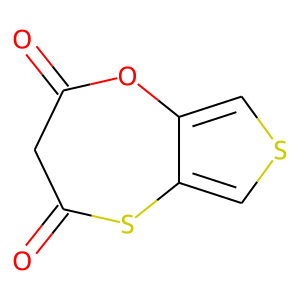

c1sc(c2c1SC(=O)CC(=O)O2)

1066


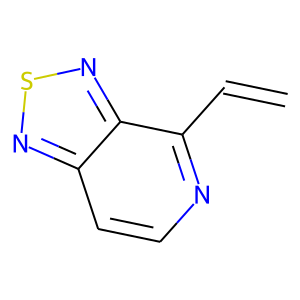

c1cnc(c2c1nsn2)C=C

1067


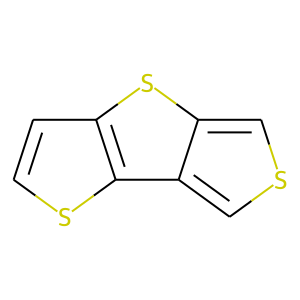

c1scc2c1c1c(s2)cc(s1)

1068


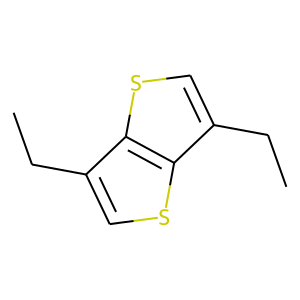

c1sc2c(c1CC)sc(c2CC)

1069


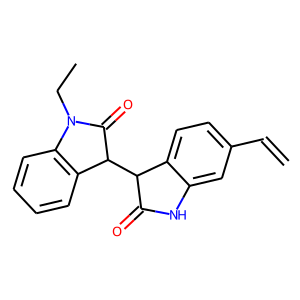

c1cc2c(cc1)C(C(=O)N2CC)C1C(=O)Nc2cc(ccc12)C=C

1070


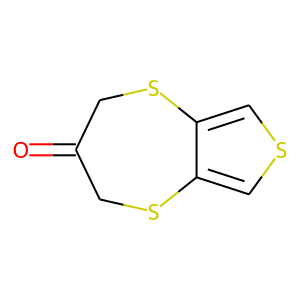

c1sc(c2c1SCC(=O)CS2)

1071


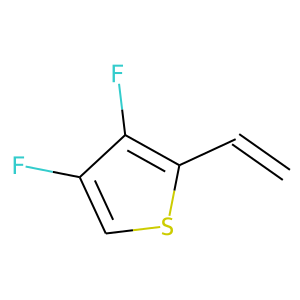

c1sc(c(c1F)F)C=C

1072


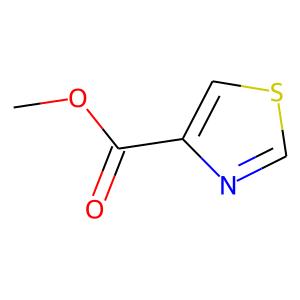

c1sc(c(n1)C(=O)OC)

1073


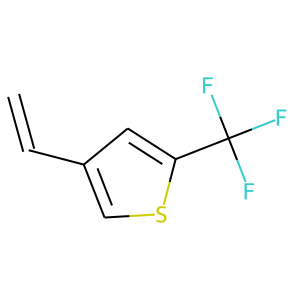

c1sc(C(F)(F)F)cc1C=C

1074


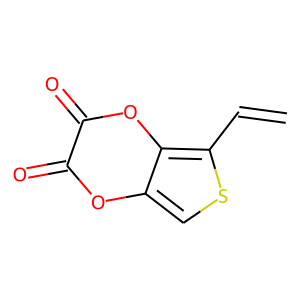

c1sc(c2c1oc(=O)c(=O)o2)C=C

1075


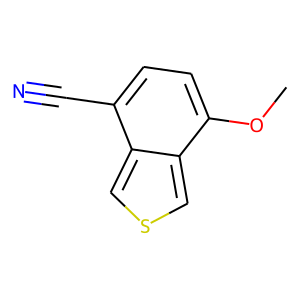

c1sc(c2c1c(C#N)ccc2OC)

1076


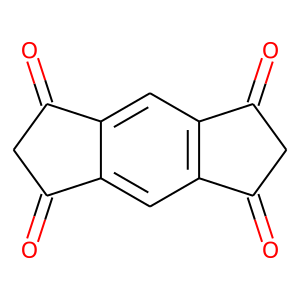

c1c2C(=O)CC(=O)c2c(c2c1C(=O)CC2=O)

1077


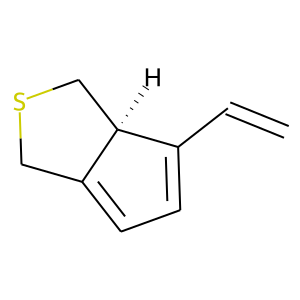

C1=C2CSC[C@H]2C(=C1)C=C

1078


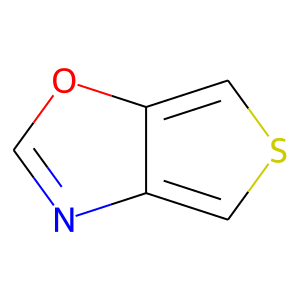

c1sc(c2c1nco2)

1079


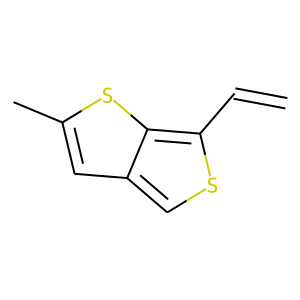

c1sc(c2c1cc(C)s2)C=C

1080


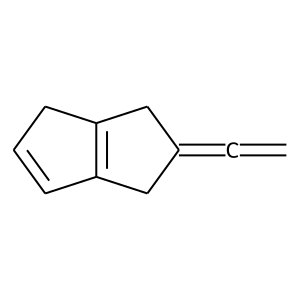

C=C=C1CC2=C(C1)C(=CC2)

1081


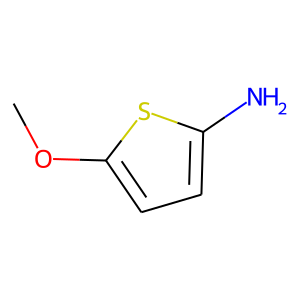

c1c(sc(OC)c1)N

1082


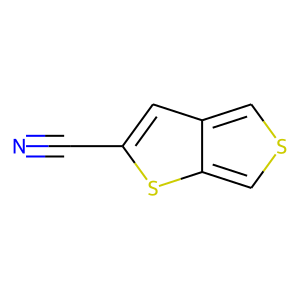

c1sc(c2c1sc(C#N)c2)

1083


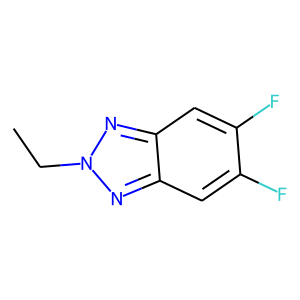

c1c(F)c(F)c(c2c1nn(CC)n2)

1084


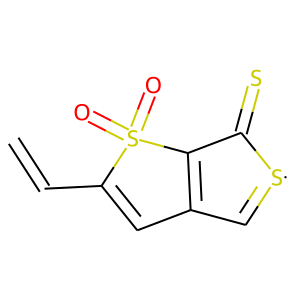

C1=[S]C(=S)C2=C1C=C(S2(=O)=O)C=C

1085


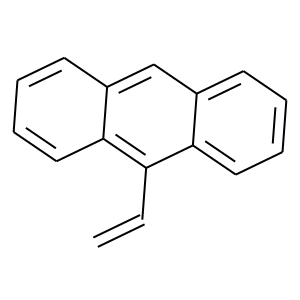

c1c2c(C=C)c3c(cc2ccc1)c(ccc3)

1086


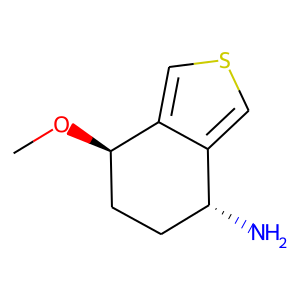

c1sc(c2c1[C@H](N)CC[C@H]2OC)

1087


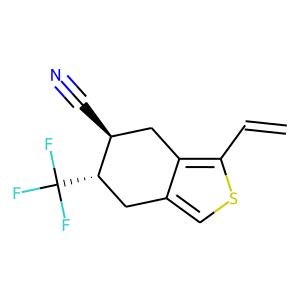

c1sc(c2c1C[C@H](C(F)(F)F)[C@@H](C#N)C2)C=C

1088


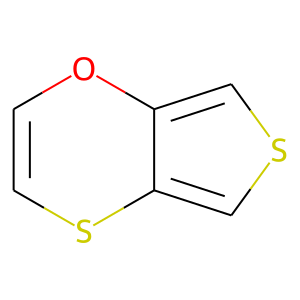

c1c(oc2cscc2s1)

1089


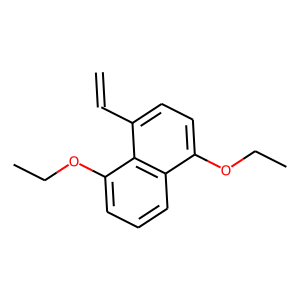

c1ccc(OCC)c2c1c(OCC)ccc2C=C

1090


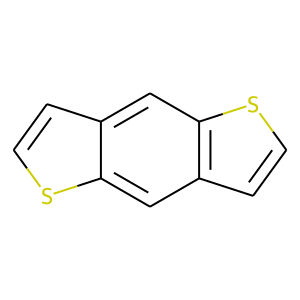

c1csc2c1cc1c(ccs1)c2

1091


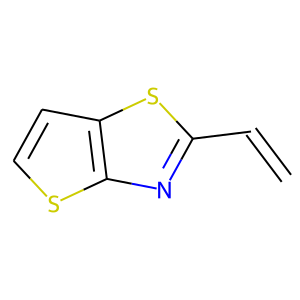

c1sc2nc(sc2c1)C=C

1092


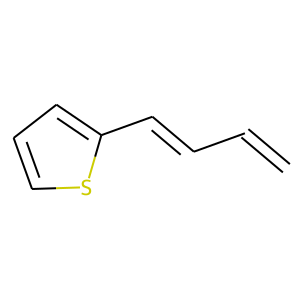

c1sc(cc1)C=CC=C

1093


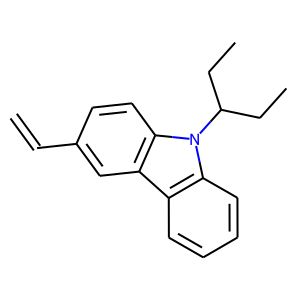

c1cc(cc2c1n(c1c2cccc1)C(CC)CC)C=C

1094


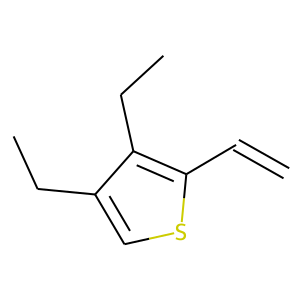

c1sc(c(c1CC)CC)C=C

1095


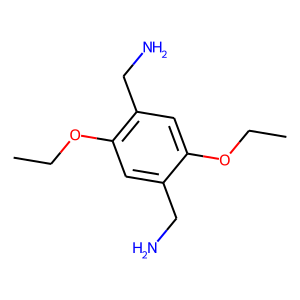

NCc1cc(OCC)c(cc1OCC)CN

1096


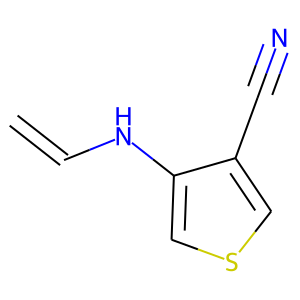

c1scc(C#N)c1NC=C

1097


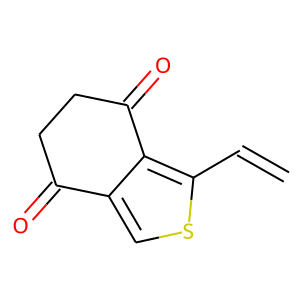

c1sc(c2c1C(=O)CCC2=O)C=C

1098


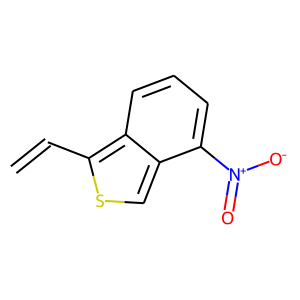

c1sc(c2c1c(N(=O)=O)ccc2)C=C

1099


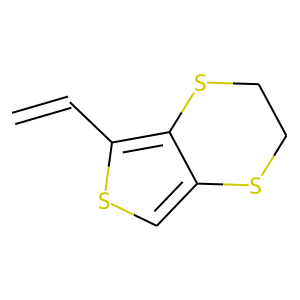

c1sc(c2c1SCCS2)C=C

1100


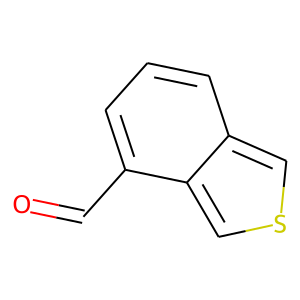

c1sc(c2c1c(C=O)ccc2)

1101


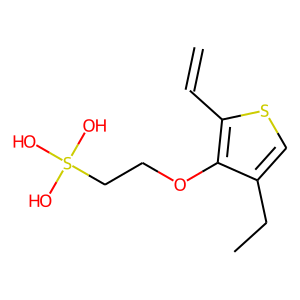

c1sc(c(c1CC)OCCS(O)(O)O)C=C

1102


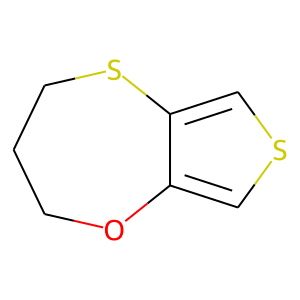

c1sc(c2c1OCCCS2)

1103


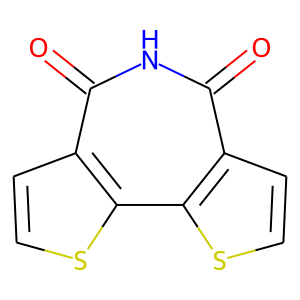

c1cc2c(s1)c1c(c(=O)[nH]c2=O)cc(s1)

1104


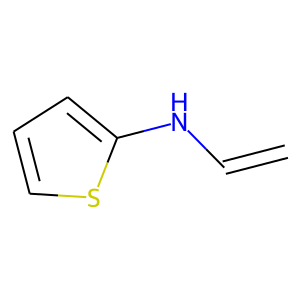

c1sc(cc1)NC=C

1105


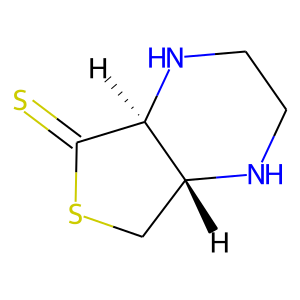

N1[C@@H]2CSC(=S)[C@H]2N(CC1)

1106


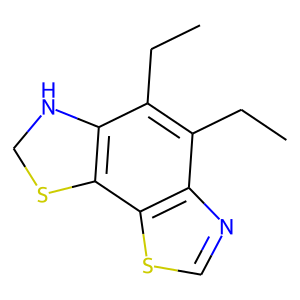

c1nc2c(s1)c1c(c(c2CC)CC)N(CS1)

1107


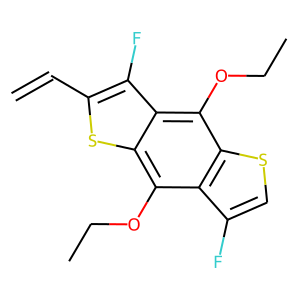

c1sc2c(c1F)c(OCC)c1c(c2OCC)c(F)c(s1)C=C

1108


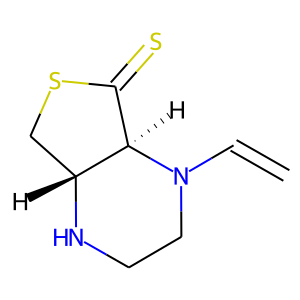

N1[C@@H]2CSC(=S)[C@H]2N(CC1)C=C


In [3]:
with open('1235MonomerList.txt') as new_mons:
    count = 1
    for line in new_mons:
        print(count)
        mol = Chem.MolFromSmiles(line)
        img = Draw.MolToImage(mol)
        display(img)
        print(line)
        '''if num_rings(line) == 3:
            print(count)
            mol = Chem.MolFromSmiles(line)
            img = Draw.MolToImage(mol)
            display(img)'''
        count +=1